In [258]:
# import packages
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

## Importing the data

In [259]:
#import the data

train = pd.read_csv("/Users/justin_mah/Downloads/uts-advdsi-22-02-nba-career-prediction/train.csv")
test = pd.read_csv("/Users/justin_mah/Downloads/uts-advdsi-22-02-nba-career-prediction/test.csv")

In [260]:
# observe the shape of the train data
train.shape

(8000, 21)

In [261]:
# observe the shape of the test data
test.shape

(3799, 20)

In [262]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8000 entries, 0 to 7999
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Id           8000 non-null   int64  
 1   GP           8000 non-null   int64  
 2   MIN          8000 non-null   float64
 3   PTS          8000 non-null   float64
 4   FGM          8000 non-null   float64
 5   FGA          8000 non-null   float64
 6   FG%          8000 non-null   float64
 7   3P Made      8000 non-null   float64
 8   3PA          8000 non-null   float64
 9   3P%          8000 non-null   float64
 10  FTM          8000 non-null   float64
 11  FTA          8000 non-null   float64
 12  FT%          8000 non-null   float64
 13  OREB         8000 non-null   float64
 14  DREB         8000 non-null   float64
 15  REB          8000 non-null   float64
 16  AST          8000 non-null   float64
 17  STL          8000 non-null   float64
 18  BLK          8000 non-null   float64
 19  TOV   

In [263]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3799 entries, 0 to 3798
Data columns (total 20 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Id       3799 non-null   int64  
 1   GP       3799 non-null   int64  
 2   MIN      3799 non-null   float64
 3   PTS      3799 non-null   float64
 4   FGM      3799 non-null   float64
 5   FGA      3799 non-null   float64
 6   FG%      3799 non-null   float64
 7   3P Made  3799 non-null   float64
 8   3PA      3799 non-null   float64
 9   3P%      3799 non-null   float64
 10  FTM      3799 non-null   float64
 11  FTA      3799 non-null   float64
 12  FT%      3799 non-null   float64
 13  OREB     3799 non-null   float64
 14  DREB     3799 non-null   float64
 15  REB      3799 non-null   float64
 16  AST      3799 non-null   float64
 17  STL      3799 non-null   float64
 18  BLK      3799 non-null   float64
 19  TOV      3799 non-null   float64
dtypes: float64(18), int64(2)
memory usage: 593.7 KB


## **Data Glossary**

Id_old - Previous Player Identifier (apparently not in data)

Id - Player Identifier

GP - Games Played

MIN - Minutes Played

PTS - Points Per Game

FGM - Field Goals Made

FGA - Field Goals Attempts

FG% - Field Goals Percent

3P Made - 3-Points Made

3PA - 3-Points Attempts

3P% - 3-Points Percent

FTM - Free Throw Made

FTA - Free Throw Attempts

FT% - Free Throw Percent

OREB - Offensive Rebounds

DREB - Defensive Rebounds

REB - Rebounds

AST - Assists

STL - Steals

BLK - Blocks

TOV - Turnovers

TARGET_5Yrs - Outcome: 1 if career length >= 5 years, 0 otherwise


In [264]:
# identifying if there is any null values for each feature
test.isnull().sum()

Id         0
GP         0
MIN        0
PTS        0
FGM        0
FGA        0
FG%        0
3P Made    0
3PA        0
3P%        0
FTM        0
FTA        0
FT%        0
OREB       0
DREB       0
REB        0
AST        0
STL        0
BLK        0
TOV        0
dtype: int64

## Correlation Plot

Using the train dataset to check any association with the Target variable "TARGET_5Yrs" to the predictor variables.

In [265]:
# This is another Correlation plot I preferred this one as it does give a lot more information
corr = train.corr()
corr.style.background_gradient(cmap='coolwarm')

,Id,GP,MIN,PTS,FGM,FGA,FG%,3P Made,3PA,3P%,FTM,FTA,FT%,OREB,DREB,REB,AST,STL,BLK,TOV,TARGET_5Yrs
Id,1.000000,0.028860,0.027481,0.023416,0.023845,0.024341,0.009777,0.008947,0.009524,-0.005559,0.020854,0.017460,0.018887,0.014007,0.018180,0.018471,0.017703,0.007974,0.011955,0.021505,0.018233
GP,0.028860,1.000000,0.608090,0.578344,0.577697,0.553374,0.278510,0.123231,0.119146,0.045434,0.524276,0.519154,0.155667,0.402654,0.492070,0.484485,0.402126,0.473409,0.187269,0.537821,0.242108
MIN,0.027481,0.608090,1.000000,0.904840,0.895957,0.895085,0.234919,0.358597,0.372454,0.153846,0.767647,0.753660,0.212366,0.542782,0.770128,0.728842,0.639013,0.759933,0.260428,0.792059,0.182203
PTS,0.023416,0.578344,0.904840,1.000000,0.989208,0.973297,0.301991,0.337786,0.349452,0.156044,0.864463,0.842903,0.257157,0.539289,0.690687,0.673621,0.573893,0.678514,0.232923,0.816414,0.182004
FGM,0.023845,0.577697,0.895957,0.989208,1.000000,0.972670,0.343140,0.288906,0.299300,0.123230,0.810273,0.798366,0.208038,0.565086,0.699456,0.689229,0.550682,0.663419,0.245199,0.799119,0.183568
FGA,0.024341,0.553374,0.895085,0.973297,0.972670,1.000000,0.140998,0.373362,0.399025,0.203040,0.787989,0.761174,0.263515,0.464325,0.635072,0.607930,0.619597,0.689391,0.191895,0.816810,0.162389
FG%,0.009777,0.278510,0.234919,0.301991,0.343140,0.140998,1.000000,-0.269994,-0.330586,-0.312446,0.279252,0.335512,-0.187200,0.539317,0.429142,0.490902,-0.132006,0.071364,0.288155,0.128622,0.158858
3P Made,0.008947,0.123231,0.358597,0.337786,0.288906,0.373362,-0.269994,1.000000,0.979340,0.585280,0.149567,0.088516,0.320845,-0.200575,0.076694,-0.014098,0.375967,0.305817,-0.094750,0.231413,0.015016
3PA,0.009524,0.119146,0.372454,0.349452,0.299300,0.399025,-0.330586,0.979340,1.000000,0.576168,0.165116,0.101186,0.335011,-0.213506,0.069782,-0.023208,0.409646,0.337407,-0.101143,0.255422,0.003463
3P%,-0.005559,0.045434,0.153846,0.156044,0.123230,0.203040,-0.312446,0.585280,0.576168,1.000000,0.013036,-0.054517,0.339894,-0.297108,-0.105370,-0.181554,0.291623,0.195759,-0.169376,0.095169,-0.011977


/var/folders/k8/13xywxp125dck1f8lh1hts8h0000gn/T/ipykernel_16488/3064712858.py:7: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),


<AxesSubplot:>

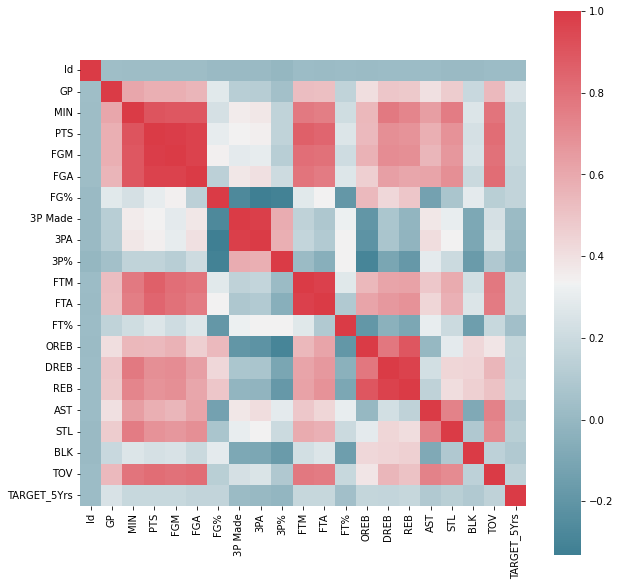

In [9]:
# Sample of using a correlation plot to identify which feature is associated with our Target variable "TARGET_5Yrs"
import seaborn as sns
import matplotlib.pyplot as plt

f, ax = plt.subplots(figsize=(10, 10))
corr = train.corr()
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax)

<AxesSubplot:>

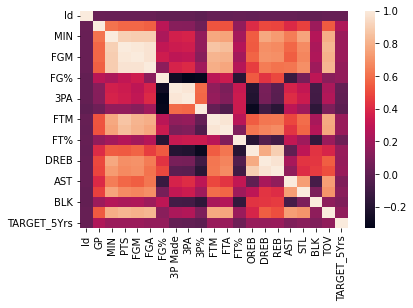

In [52]:
# Seaborn heatmap correlation plot (insufficient visualisation to give information to client)
sns.heatmap(train.corr())

In [266]:
# Adjusting the jupyter notebook display to see more data
pd.set_option('display.max_rows', 600)
pd.set_option('display.max_columns', 100)
pd.set_option('display.width', 500)

## *Lets examine the details of the dataset* 

In [267]:
# observing the first 5 records 
train.head()

,Id,GP,MIN,PTS,FGM,FGA,FG%,3P Made,3PA,3P%,FTM,FTA,FT%,OREB,DREB,REB,AST,STL,BLK,TOV,TARGET_5Yrs
0,10556,80,24.3,7.8,3.0,6.4,45.7,0.1,0.3,22.6,2.0,2.9,72.1,2.2,2.0,3.8,3.2,1.1,0.2,1.6,1
1,5342,75,21.8,10.5,4.2,7.9,55.1,-0.3,-1.0,34.9,2.4,3.6,67.8,3.6,3.7,6.6,0.7,0.5,0.6,1.4,1
2,5716,85,19.1,4.5,1.9,4.5,42.8,0.4,1.2,34.3,0.4,0.6,75.7,0.6,1.8,2.4,0.8,0.4,0.2,0.6,1
3,13790,63,19.1,8.2,3.5,6.7,52.5,0.3,0.8,23.7,0.9,1.5,66.9,0.8,2.0,3.0,1.8,0.4,0.1,1.9,1
4,5470,63,17.8,3.7,1.7,3.4,50.8,0.5,1.4,13.7,0.2,0.5,54.0,2.4,2.7,4.9,0.4,0.4,0.6,0.7,1


In [268]:
# the first 5 rows for test data
test.head()

,Id,GP,MIN,PTS,FGM,FGA,FG%,3P Made,3PA,3P%,FTM,FTA,FT%,OREB,DREB,REB,AST,STL,BLK,TOV
0,1,56,9.1,4.0,1.6,3.7,43.7,0.1,0.3,7.3,0.7,1.2,63.4,1.2,0.8,1.7,0.4,0.2,0.3,0.8
1,8194,43,19.3,10.1,3.7,8.1,46.0,0.6,1.7,35.1,1.8,2.5,75.3,0.5,0.9,1.5,3.5,0.6,-0.0,1.8
2,3,82,33.9,11.3,4.9,10.6,45.6,0.5,1.9,44.8,1.8,2.7,71.2,1.3,3.3,4.5,2.5,1.3,0.3,2.0
3,8196,86,44.7,18.8,6.8,15.9,42.9,0.5,1.8,13.5,4.5,6.3,70.9,1.5,3.2,5.0,4.1,0.9,0.1,3.6
4,8197,58,12.3,4.7,1.6,4.0,40.0,0.5,1.7,38.7,1.1,1.3,76.9,0.2,0.6,0.9,1.5,0.5,-0.4,0.9


In [269]:
# train.corr().plot()
# import matplotlib.pyplot as plt
# plt.matshow(train.corr())
# plt.show()

Check the **TARGET_5Yrs** variable only has 0 or 1.

In [277]:
# Check Target variable to see the unique values in that column, should be only 1 or 0
train["TARGET_5Yrs"].unique()

# Thats great there is no artifacts in that column besides 1 and 0

array([1, 0])

### Produce a crosstab to show the data imbalance for target variable

In [278]:
# Using crosstab function lets check the train data of the sum of the group
pd.crosstab(train['TARGET_5Yrs'],train['TARGET_5Yrs'],margins=True)

TARGET_5Yrs,0,1,All
TARGET_5Yrs,,,
0,1331,0,1331
1,0,6669,6669
All,1331,6669,8000


From the crosstab above, in the train data we have an imbalanced dataset of 1331 NBA rookie players of whom do not make it to the NBA after 5 years. compared to 6669 NBA rookie players that do play on after 5 years with the NBA profession.<br>
This represents about 79% success rate of the 8000 players which adds to the issue that we have an **imbalanced dataset** that needs to be balanced out in order for make our models to be reliable and reasonably accurate as possible.


### --- **Lets look at NBA Rookies that have passed 5 years in the organisation** ---

In [12]:
# create a filter dataframe with records only have passed 5 years in NBA and save it as 'passed'
passed = train[train['TARGET_5Yrs']==1]

In [345]:
passed.describe()

,Id,GP,MIN,PTS,FGM,FGA,FG%,3P Made,3PA,3P%,FTM,FTA,FT%,OREB,DREB,REB,AST,STL,BLK,TOV,TARGET_5Yrs
count,6669.000000,6669.000000,6669.000000,6669.000000,6669.000000,6669.000000,6669.000000,6669.000000,6669.000000,6669.000000,6669.000000,6669.000000,6669.000000,6669.000000,6669.000000,6669.000000,6669.000000,6669.000000,6669.000000,6669.000000,6669.0
mean,6889.367971,64.629330,19.303929,7.618219,2.945899,6.491243,45.045719,0.267102,0.818204,19.498081,1.464477,2.046544,71.549543,1.138417,2.273024,3.408892,1.683131,0.672065,0.281392,1.306628,1.0
std,3971.261531,16.718539,9.069595,4.396696,1.726871,3.655725,6.093200,0.384559,1.062603,15.974117,0.939564,1.271339,10.469601,0.802867,1.419288,2.125565,1.386373,0.415717,0.766430,0.735796,0.0
min,4.000000,-3.000000,3.300000,0.900000,0.300000,0.900000,21.300000,-1.100000,-2.600000,-38.500000,0.000000,0.000000,-13.300000,0.000000,0.200000,0.300000,0.000000,0.000000,-15.700000,0.100000,1.0
25%,3472.000000,53.000000,12.600000,4.400000,1.700000,3.800000,40.900000,0.000000,0.100000,8.200000,0.800000,1.100000,65.300000,0.500000,1.200000,1.800000,0.700000,0.400000,0.100000,0.800000,1.0
50%,6793.000000,64.000000,17.600000,6.700000,2.600000,5.700000,44.900000,0.300000,0.800000,19.400000,1.300000,1.800000,71.500000,1.000000,2.000000,3.000000,1.300000,0.600000,0.200000,1.200000,1.0
75%,10326.000000,76.000000,24.500000,9.900000,3.900000,8.400000,49.000000,0.500000,1.500000,30.600000,2.000000,2.700000,77.600000,1.500000,3.000000,4.500000,2.300000,0.900000,0.400000,1.700000,1.0
max,13798.000000,123.000000,73.800000,34.200000,13.100000,28.900000,67.200000,1.700000,4.700000,82.100000,8.100000,11.100000,168.900000,5.500000,11.000000,15.900000,12.800000,3.600000,18.900000,5.300000,1.0


In [346]:
passed.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6669 entries, 0 to 7999
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Id           6669 non-null   int64  
 1   GP           6669 non-null   int64  
 2   MIN          6669 non-null   float64
 3   PTS          6669 non-null   float64
 4   FGM          6669 non-null   float64
 5   FGA          6669 non-null   float64
 6   FG%          6669 non-null   float64
 7   3P Made      6669 non-null   float64
 8   3PA          6669 non-null   float64
 9   3P%          6669 non-null   float64
 10  FTM          6669 non-null   float64
 11  FTA          6669 non-null   float64
 12  FT%          6669 non-null   float64
 13  OREB         6669 non-null   float64
 14  DREB         6669 non-null   float64
 15  REB          6669 non-null   float64
 16  AST          6669 non-null   float64
 17  STL          6669 non-null   float64
 18  BLK          6669 non-null   float64
 19  TOV   

In [14]:
# Check correlation for passed
corr_pass = passed.corr()

corr_pass.style.background_gradient(cmap='coolwarm')

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/pandas/io/formats/style.py:2813: RuntimeWarning: All-NaN slice encountered
  smin = np.nanmin(gmap) if vmin is None else vmin
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/pandas/io/formats/style.py:2814: RuntimeWarning: All-NaN slice encountered
  smax = np.nanmax(gmap) if vmax is None else vmax


,Id,GP,MIN,PTS,FGM,FGA,FG%,3P Made,3PA,3P%,FTM,FTA,FT%,OREB,DREB,REB,AST,STL,BLK,TOV,TARGET_5Yrs
Id,1.000000,0.031239,0.029226,0.025308,0.025165,0.025797,0.005963,0.015010,0.015655,-0.002916,0.023093,0.018008,0.028733,0.008833,0.013528,0.013281,0.021664,0.005362,0.011549,0.024401,nan
GP,0.031239,1.000000,0.595901,0.567392,0.566320,0.543503,0.252092,0.122282,0.119836,0.052079,0.511675,0.506110,0.149833,0.383911,0.477376,0.469142,0.397600,0.464152,0.184132,0.530314,nan
MIN,0.029226,0.595901,1.000000,0.902605,0.893831,0.893472,0.213058,0.360379,0.375442,0.163182,0.758825,0.744390,0.203574,0.529313,0.763939,0.721264,0.638752,0.757098,0.267505,0.790062,nan
PTS,0.025308,0.567392,0.902605,1.000000,0.988946,0.972870,0.283103,0.338871,0.351692,0.166221,0.859657,0.837407,0.249881,0.525673,0.681734,0.664041,0.571683,0.674623,0.236649,0.815005,nan
FGM,0.025165,0.566320,0.893831,0.988946,1.000000,0.972420,0.325236,0.289200,0.300874,0.132975,0.803660,0.791370,0.200427,0.551687,0.690864,0.680016,0.548625,0.660018,0.249691,0.796965,nan
FGA,0.025797,0.543503,0.893472,0.972870,0.972420,1.000000,0.119955,0.375197,0.401839,0.212116,0.781201,0.753770,0.256119,0.449336,0.625590,0.597311,0.618190,0.685995,0.192582,0.815165,nan
FG%,0.005963,0.252092,0.213058,0.283103,0.325236,0.119955,1.000000,-0.286990,-0.345988,-0.309973,0.261764,0.319774,-0.196717,0.533617,0.417362,0.482075,-0.149835,0.054257,0.287961,0.110897,nan
3P Made,0.015010,0.122282,0.360379,0.338871,0.289200,0.375197,-0.286990,1.000000,0.979394,0.586433,0.146558,0.083979,0.319720,-0.214986,0.068405,-0.024501,0.380358,0.306578,-0.101950,0.236519,nan
3PA,0.015655,0.119836,0.375442,0.351692,0.300874,0.401839,-0.345988,0.979394,1.000000,0.576910,0.162986,0.097779,0.331728,-0.225878,0.063569,-0.031537,0.413292,0.338448,-0.106902,0.260900,nan
3P%,-0.002916,0.052079,0.163182,0.166221,0.132975,0.212116,-0.309973,0.586433,0.576910,1.000000,0.019454,-0.048588,0.339304,-0.298515,-0.101219,-0.179650,0.291907,0.199994,-0.166552,0.103976,nan


### *Summary statistics*

In [282]:
# Summary statistics for train data
train.describe()

,Id,GP,MIN,PTS,FGM,FGA,FG%,3P Made,3PA,3P%,FTM,FTA,FT%,OREB,DREB,REB,AST,STL,BLK,TOV,TARGET_5Yrs
count,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000
mean,6856.971000,62.777875,18.576663,7.267087,2.807037,6.231213,44.608900,0.264525,0.816563,19.583700,1.392525,1.947787,71.365825,1.077838,2.168500,3.245300,1.624513,0.648688,0.245212,1.257762,0.833625
std,3977.447579,17.118774,8.935263,4.318732,1.693373,3.584559,6.155453,0.384093,1.060964,16.003155,0.926153,1.252352,10.430447,0.785670,1.392224,2.085154,1.355986,0.407626,0.821037,0.723270,0.372440
min,4.000000,-8.000000,2.900000,0.800000,0.300000,0.800000,21.300000,-1.100000,-3.100000,-38.500000,0.000000,0.000000,-13.300000,0.000000,0.200000,0.300000,0.000000,0.000000,-17.900000,0.100000,0.000000
25%,3413.750000,51.000000,12.000000,4.100000,1.600000,3.600000,40.400000,0.000000,0.100000,8.400000,0.700000,1.000000,65.000000,0.500000,1.100000,1.700000,0.700000,0.300000,0.100000,0.700000,1.000000
50%,6787.500000,63.000000,16.800000,6.300000,2.400000,5.400000,44.400000,0.300000,0.800000,19.500000,1.200000,1.700000,71.400000,0.900000,1.900000,2.800000,1.300000,0.600000,0.200000,1.100000,1.000000
75%,10299.250000,74.000000,23.500000,9.500000,3.700000,8.100000,48.700000,0.500000,1.500000,30.600000,1.900000,2.600000,77.500000,1.500000,2.900000,4.300000,2.200000,0.900000,0.400000,1.600000,1.000000
max,13798.000000,123.000000,73.800000,34.200000,13.100000,28.900000,67.200000,1.700000,4.700000,82.100000,8.100000,11.100000,168.900000,5.500000,11.000000,15.900000,12.800000,3.600000,18.900000,5.300000,1.000000


In [98]:
# Summary statistics for test data
test.describe()

,Id,GP,MIN,PTS,FGM,FGA,FG%,3P Made,3PA,3P%,FTM,FTA,FT%,OREB,DREB,REB,AST,STL,BLK,TOV
count,3799.000000,3799.000000,3799.000000,3799.000000,3799.000000,3799.000000,3799.000000,3799.000000,3799.000000,3799.000000,3799.000000,3799.000000,3799.000000,3799.000000,3799.000000,3799.000000,3799.000000,3799.000000,3799.000000,3799.000000
mean,7010.614109,62.853909,18.650224,7.328034,2.835404,6.302580,44.599079,0.255962,0.796920,19.234746,1.399842,1.953567,71.612924,1.096025,2.179495,3.275783,1.636483,0.653593,0.257726,1.257910
std,3954.173641,17.151740,8.727259,4.294724,1.688427,3.579221,6.040168,0.380987,1.052862,15.968989,0.926140,1.250376,10.457336,0.785678,1.371935,2.070646,1.335496,0.410573,0.639660,0.712449
min,1.000000,6.000000,3.700000,0.700000,0.300000,0.800000,25.100000,-1.000000,-2.700000,-38.000000,0.000000,0.000000,23.700000,0.000000,0.200000,0.300000,0.000000,0.000000,-7.100000,0.100000
25%,3644.000000,51.000000,12.200000,4.200000,1.600000,3.700000,40.500000,0.000000,0.100000,8.500000,0.700000,1.000000,65.000000,0.500000,1.200000,1.800000,0.600000,0.400000,0.100000,0.700000
50%,7062.000000,63.000000,17.000000,6.400000,2.500000,5.500000,44.600000,0.300000,0.800000,19.400000,1.200000,1.700000,71.500000,0.900000,1.900000,2.800000,1.300000,0.600000,0.200000,1.100000
75%,10402.500000,74.000000,23.300000,9.400000,3.700000,8.100000,48.500000,0.500000,1.500000,30.250000,1.900000,2.600000,78.000000,1.500000,2.900000,4.300000,2.300000,0.900000,0.400000,1.600000
max,13792.000000,126.000000,68.000000,33.000000,13.400000,26.200000,74.600000,1.600000,4.300000,73.800000,7.800000,9.800000,127.100000,6.900000,12.000000,18.500000,9.000000,2.700000,14.800000,5.200000


### Create copy of the train data

### **Questions to ask** week 2

Question:<br>
Can a 3 point shot can have a negative number on it? 

Answer:<br>
Play differential when a player comes in to the game and scores vs a player exits the game and the opponents scores in the game. it is measuring the level of impact of the players involvement with the NBA games.

The answer is that when a player is in the court and playing against the opposing team, the problem with this stat is that it does not truly reflect on the individual player but which team players he is playing in the team against the opposing team.

In [283]:
# Create a copy of the train data
df = train.copy()

### Preparing the data

In [272]:
# turn "Id" column as an index column

# df.set_index(df["Id"],inplace=True)

In [273]:
# remove "Id" column in df
# df.drop(columns = ['Id'], inplace = True)

In [274]:
# review df 
df.head()

,Id,GP,MIN,PTS,FGM,FGA,FG%,3P Made,3PA,3P%,FTM,FTA,FT%,OREB,DREB,REB,AST,STL,BLK,TOV,TARGET_5Yrs
0,10556,80,24.3,7.8,3.0,6.4,45.7,0.1,0.3,22.6,2.0,2.9,72.1,2.2,2.0,3.8,3.2,1.1,0.2,1.6,1
1,5342,75,21.8,10.5,4.2,7.9,55.1,-0.3,-1.0,34.9,2.4,3.6,67.8,3.6,3.7,6.6,0.7,0.5,0.6,1.4,1
2,5716,85,19.1,4.5,1.9,4.5,42.8,0.4,1.2,34.3,0.4,0.6,75.7,0.6,1.8,2.4,0.8,0.4,0.2,0.6,1
3,13790,63,19.1,8.2,3.5,6.7,52.5,0.3,0.8,23.7,0.9,1.5,66.9,0.8,2.0,3.0,1.8,0.4,0.1,1.9,1
4,5470,63,17.8,3.7,1.7,3.4,50.8,0.5,1.4,13.7,0.2,0.5,54.0,2.4,2.7,4.9,0.4,0.4,0.6,0.7,1


In [284]:
# Seperate the TARGET_5YRS column from df and naming it as "target"
target = df.pop('TARGET_5Yrs')

In [285]:
# review df 
df.head()

,Id,GP,MIN,PTS,FGM,FGA,FG%,3P Made,3PA,3P%,FTM,FTA,FT%,OREB,DREB,REB,AST,STL,BLK,TOV
0,10556,80,24.3,7.8,3.0,6.4,45.7,0.1,0.3,22.6,2.0,2.9,72.1,2.2,2.0,3.8,3.2,1.1,0.2,1.6
1,5342,75,21.8,10.5,4.2,7.9,55.1,-0.3,-1.0,34.9,2.4,3.6,67.8,3.6,3.7,6.6,0.7,0.5,0.6,1.4
2,5716,85,19.1,4.5,1.9,4.5,42.8,0.4,1.2,34.3,0.4,0.6,75.7,0.6,1.8,2.4,0.8,0.4,0.2,0.6
3,13790,63,19.1,8.2,3.5,6.7,52.5,0.3,0.8,23.7,0.9,1.5,66.9,0.8,2.0,3.0,1.8,0.4,0.1,1.9
4,5470,63,17.8,3.7,1.7,3.4,50.8,0.5,1.4,13.7,0.2,0.5,54.0,2.4,2.7,4.9,0.4,0.4,0.6,0.7


#### **This is for when using the cookie cutter package**

In [51]:
# # joblib package
# from joblib import dump

In [ ]:
# # *** save scaler in the models folder called "scaler.joblib" for use next time
# dump(scaler, '../models/scaler.joblib')

In [104]:
# *** Saving the different set in data processed  

# np.save('../data/processed/X_train', X_train)
# np.save('../data/processed/X_val',   X_val)
# np.save('../data/processed/X_test',  X_test)
# np.save('../data/processed/y_train', y_train)
# np.save('../data/processed/y_val',   y_val)
# np.save('../data/processed/y_test',  y_test)

FileNotFoundError: [Errno 2] No such file or directory: '../data/processed/X_train.npy'

### Using SMOTE for imbalance data (Week 2)

In [129]:
from numpy import mean
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier

In [130]:
# #copy train data and save it as df
# df = train.copy()

# # Seperate the TARGET_5YRS column from df and naming it as "target"
# target = df.pop('TARGET_5Yrs')

In [353]:
# Allocating training and target data to X and y
X = df

y = target

### Scaling the training data

In [354]:
# scale the data
from sklearn.preprocessing import StandardScaler

In [355]:
scaler = StandardScaler()

In [356]:
X = scaler.fit_transform(X)

### Cross Validation on Decision Tree Classifier, KNN and Logistic Regression

In [357]:
# Models 
model_dtc = DecisionTreeClassifier()
model_knn = KNeighborsClassifier()
model_log = LogisticRegression() #(solver='liblinear') 

In [359]:
# evaluate Decision Tree Classifier
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
scores = cross_val_score(model_dtc, X, y, scoring='roc_auc', cv=cv, n_jobs=-1)
print('Mean ROC AUC for Decision Tree: %.3f' % mean(scores))

Mean ROC AUC for Decision Tree: 0.541


In [360]:
# evaluate KNN
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
scores = cross_val_score(model_knn, X, y, scoring='roc_auc', cv=cv, n_jobs=-1)
print('Mean ROC AUC for Decision Tree: %.3f' % mean(scores))

Mean ROC AUC for Decision Tree: 0.588


In [358]:
# evaluate Logistic Regression
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
scores = cross_val_score(model_log, X, y, scoring='roc_auc', cv=cv, n_jobs=-1)
print('Mean ROC AUC for Logistic Regression: %.3f' % mean(scores))

Mean ROC AUC for Logistic Regression: 0.703


***Result***

Does not work ROC_AUC is 0.703 still less than logistic regression from last week of 0.717 and K nearest neighbours of 0.626.<br>
For Decision Tree Classifier model this is new model this week performed poorly at 0.539.


# CROSS VALIDATION XGBOOST
no scaling required for XGBoost 

In [90]:
df = train.copy()

In [91]:
# Seperate the TARGET_5YRS column from df and naming it as "target"
target = df.pop('TARGET_5Yrs')

Stratified is to ensure that each fold of dataset has the same proportion of observations with a given label.
So, it means that StratifiedKFold is the improved version of KFold

We should use StratifiedKFold over KFold when dealing with classification tasks with imbalanced class distributions.

In [361]:
# import the required libraries

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
import xgboost as xgb
from collections import Counter
import warnings
warnings.filterwarnings("ignore")




In [ ]:
# load dataset
X = df
y = target

In [363]:
# count # of examples in each class
counter = Counter(y)
counter

Counter({1: 6669, 0: 1331})

In [364]:
# estimate scale_pos_weight value, assuming the class labels are 0 and 1. 
weight = counter[0] / counter[1]
weight

0.199580146948568

In [365]:
# Define the model

model_xgb = xgb.XGBClassifier(scale_pos_weight=weight,n_jobs=-1,random_state=42,eval_metric="auc")

# define cross-validation
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)

# evaluate model
xgb_scores = cross_val_score(model_xgb, X, y, scoring='roc_auc', cv=cv, n_jobs=-1)



/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-package

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-package

In [366]:
# summarize performance
print('Mean AUROC for XGBoost: %.3f' % np.mean(xgb_scores))

Mean AUROC for XGBoost: 0.655


In [ ]:
#  gbm = xgb.train(params, dtrain, num_boost_round, evals=watchlist, early_stopping_rounds=early_stopping_rounds, verbose_eval=True)

#     print("Validating...")
#     check = gbm.predict(xgb.DMatrix(X_valid[features]), ntree_limit=gbm.best_iteration+1)
    
#     #area under the precision-recall curve
#     score = average_precision_score(X_valid[target].values, check)
#     print('area under the precision-recall curve: {:.6f}'.format(score))

    
#     check2=check.round()
#     score = precision_score(X_valid[target].values, check2)
#     print('precision score: {:.6f}'.format(score))

#     score = recall_score(X_valid[target].values, check2)
#     print('recall score: {:.6f}'.format(score))
    
#     imp = get_importance(gbm, features)
#     print('Importance array: ', imp)

#     print("Predict test set... ")
#     test_prediction = gbm.predict(xgb.DMatrix(test[features],missing = -99), ntree_limit=gbm.best_iteration+1)
#     score = average_precision_score(test[target].values, test_prediction)

#     print('area under the precision-recall curve test set: {:.6f}'.format(score))

### XGBoost Classifier

In [306]:
# load dataset
X = df
y = target

In [307]:
# import packages
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [367]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [368]:
xbg_model = XGBClassifier( eval_metric="auc",early_stopping_rounds=5,n_jobs=-1)

In [369]:
xbg_model.fit(X_train, y_train)

[20:11:04] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1645117948562/work/src/learner.cc:576: 
Parameters: { "early_stopping_rounds" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, early_stopping_rounds=5,
              enable_categorical=False, eval_metric='auc', gamma=0, gpu_id=-1,
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=-1, num_parallel_tree=1,
              predictor='auto', random_state=0, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=1, tree_method='exact',
              validate_parameters=1, verbosity=None)

In [370]:
pred_prob_xgb = xbg_model.predict_proba(X_test)
pred_prob_xgb

array([[0.04263043, 0.95736957],
       [0.07378471, 0.9262153 ],
       [0.06599396, 0.93400604],
       ...,
       [0.00811517, 0.9918848 ],
       [0.00163931, 0.9983607 ],
       [0.03550905, 0.96449095]], dtype=float32)

In [373]:
from sklearn.metrics import roc_auc_score
auc_score_xgb = roc_auc_score(y_test, pred_prob_xgb[:,1])

In [374]:
auc_score_xgb

0.6484667165295437

#### apply to test data

In [316]:
cv_xgb_pred_final = model.predict_proba(test)
cv_xgb_pred_final

array([[0.2255441 , 0.7744559 ],
       [0.26468724, 0.73531276],
       [0.02289373, 0.9771063 ],
       ...,
       [0.1566118 , 0.8433882 ],
       [0.04053479, 0.9594652 ],
       [0.08325791, 0.9167421 ]], dtype=float32)

In [110]:
# Format the result to be submitted to Kaggle

# We want the Id column only 
test.iloc[:,0]

#creating a dataframe combining test['Id'] and the results from the model
frames = [test.iloc[:,0], pd.DataFrame(cv_xgb_pred_final[:,1])]
cv_xgb_test_result = pd.concat(frames, axis=1)
cv_xgb_test_result.columns = ['Id','TARGET_5Yrs']

cv_xgb_test_result["TARGET_5Yrs"] = cv_xgb_test_result["TARGET_5Yrs"].round(2)
cv_xgb_test_result

,Id,TARGET_5Yrs
0,1,0.77
1,8194,0.74
2,3,0.98
3,8196,1.00
4,8197,0.88
...,...,...
3794,8175,0.99
3795,8176,0.90
3796,8178,0.84
3797,8181,0.96


### Saving test Cross Validation XGBoost Classifier results to csv

In [111]:
# Save the final predictions for submission to Kaggle
# test_result.to_csv('../data/processed/group3_log_reg.csv', index=False)

cv_xgb_test_result.to_csv('group3_cv_xgb_test_result_200222.csv',index = False)

### Logistic Regression using SMOTE oversampling technique

In [317]:
# import all the required libraries
import pandas as pd
import numpy as np
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score, RepeatedStratifiedKFold
from sklearn.tree import DecisionTreeClassifier
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE, BorderlineSMOTE, SVMSMOTE, ADASYN

# load dataset

X = df
y = target

# define pipelines for each different technique
oversample_model1 = SMOTE(sampling_strategy='auto', k_neighbors=5) # these parameters can be tuned
oversample_model2 = BorderlineSMOTE(sampling_strategy='auto', k_neighbors=5, m_neighbors=5)
oversample_model3 = SVMSMOTE(sampling_strategy='auto', k_neighbors=5, m_neighbors=5)
oversample_model4 = ADASYN(sampling_strategy='auto', n_neighbors=5)


In [181]:
# DecisionTreeClassifier()
steps_model1 = [('oversample', oversample_model1), ('model', LogisticRegression())]
pipeline_1 = Pipeline(steps=steps)

# evaluate pipeline
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
scores = cross_val_score(pipeline_1, X, y, scoring='roc_auc', cv=cv, n_jobs=-1)


/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.

Mean AUROC: 0.678


This Mean AUROC is 0.679 for logistic regression smote

In [182]:

# oversample using BorderlineSMOTE

# DecisionTreeClassifier()
steps_model2 = [('oversample', oversample_model2), ('model', LogisticRegression())]
pipeline_2 = Pipeline(steps=steps_model2)

# evaluate pipeline
cv2 = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
scores2 = cross_val_score(pipeline_2, X, y, scoring='roc_auc', cv=cv2, n_jobs=-1)


/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.

Mean AUROC: 0.681


In [183]:
# oversample using SVMSMOTE

# DecisionTreeClassifier()
steps_model3 = [('oversample', oversample_model3), ('model', LogisticRegression())]
pipeline_3 = Pipeline(steps=steps_model3)

# evaluate pipeline
cv3 = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
scores3 = cross_val_score(pipeline_3, X, y, scoring='roc_auc', cv=cv3, n_jobs=-1)


/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.

Mean AUROC: 0.678


/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.

In [192]:
# oversample using ADASYN

# DecisionTreeClassifier()
steps_model4 = [('oversample', oversample_model4), ('model', LogisticRegression())]
pipeline_4 = Pipeline(steps=steps_model4)

# evaluate pipeline
cv4 = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
scores4 = cross_val_score(pipeline_4, X, y, scoring='roc_auc', cv=cv4, n_jobs=-1)


/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.

In [193]:
#Results
print('Mean AUROC for Logistic Regression using SMOTE: %.3f' % np.mean(scores))
print('Mean AUROC for Logistic Regression using Borderline SMOTE: %.3f' % np.mean(scores2))
print('Mean AUROC for Logistic Regression using SVMSMOTE: %.3f' % np.mean(scores3))
print('Mean AUROC for Logistic Regression using ADASYN: %.3f' % np.mean(scores4))

Mean AUROC for Logistic Regression using SMOTE: 0.678
Mean AUROC for Logistic Regression using Borderline SMOTE: 0.681
Mean AUROC for Logistic Regression using SVMSMOTE: 0.678
Mean AUROC for Logistic Regression using ADASYN: 0.678


### Proper way

In [157]:
# Seperate the TARGET_5YRS column from df and naming it as "target"
X = df.drop('TARGET_5Yrs',axis=1)

y = target

In [167]:
# instead of using scikit learn's pipeline, we import from imblearn
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split, cross_validate
# just like we did for StandardScaler, we instantiate SMOTE within the pipeline

# perform our train test split
X_train, X_test, y_train, y_test = train_test_split(X, y)

pipe = Pipeline(steps = [('smote', SMOTE(random_state = 42)), 
                      ('standardscaler', StandardScaler()),
                      ('logisticregression', LogisticRegression())])
pipe.fit(X_train, y_train)
# cross validation using intra-fold sampling
cross_validate(pipe, X_train, y_train,cv=3,n_jobs=-1,scoring="roc_auc")
# cross_validate?
# source https://vch98.medium.com/preventing-data-leakage-standardscaler-and-smote-e7416c63259c

{'fit_time': array([0.05871701, 0.05873299, 0.06119704]),
 'score_time': array([0.00249004, 0.00277591, 0.00318384]),
 'test_score': array([0.70461786, 0.68119677, 0.71200877])}

In [164]:
y_hat = pipe.predict(X_test)
y_hat

array([0, 1, 1, ..., 1, 0, 1])

In [163]:
from sklearn.metrics import roc_auc_score

# auc scores
auc_score1 = roc_auc_score(y_test, y_hat[:,1])


print(f'The Logistic regression ROC AUC score is {auc_score1}')


IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

### Logistic Regression

In [32]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score
import pandas as pd
import numpy as np



**import the data**

train = pd.read_csv("/Users/justin_mah/Downloads/uts-advdsi-22-02-nba-career-prediction/train.csv") <br>
test = pd.read_csv("/Users/justin_mah/Downloads/uts-advdsi-22-02-nba-career-prediction/test.csv")

### Create copy of the train data

In [212]:
# Create a copy of the train data and call it training_data
training_data = train.copy()

### Preparing the data

In [250]:
# turn "id" column as an index column

# training_data.set_index(training_data["Id"],inplace=True)

In [251]:
# remove "Id" column in training_data
# training_data.drop(columns = ['Id'], inplace = True)

In [213]:
# Seperate the TARGETt_5YRS column from df and naming it as "target"
target = training_data.pop('TARGET_5Yrs')

### Feature Selection

In [320]:
# removing features in the dataset that does not correlate towards the target variable
# feature_selection_1 = training_data.drop(['3P Made', '3PA', '3P%','FT%','AST','BLK'],axis=1)
feature_selection_2 = training_data.drop(['Id','3P Made', '3PA', '3P%','FT%','AST','BLK'],axis=1)


In [329]:
training_data = feature_selection_2


In [17]:
training_data.shape

(8000, 20)

### Scaling the data

In [331]:
# scale the data
from sklearn.preprocessing import StandardScaler

In [332]:
scaler = StandardScaler()

In [333]:
training_data = scaler.fit_transform(training_data)

In [21]:
# res = scaler.fit_transform(test)

Summary: 

X = training_data

y = target

In [334]:
# Allocating training and target data to X and y
X = training_data

y = target

In [39]:
# from sklearn.model_selection import train_test_split
# X_train, X_test, y_train, y_test = train_test_split(training_data, target, test_size=0.2, random_state=42)

In [40]:
# from sklearn.model_selection import train_test_split
# X_train, X_test, y_train, y_test = train_test_split(training_data, target, test_size=0.2, random_state=42)

In [335]:
import pandas as pd
import numpy as np
# from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split


# split into train-test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [42]:

# # Saving the processed train test split:
# np.save('../data/processed/X_train', X_train)
# np.save('../data/processed/X_test',  X_test)
# np.save('../data/processed/y_train', y_train)
# np.save('../data/processed/y_test',  y_test)

## Using Logistic Regression and KNN models for experimentation week 1


In [336]:
# train models
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

# logistic regression
model1 = LogisticRegression(solver='liblinear') # liblinear is using L1 and L2 penalty

# knn
model2 = KNeighborsClassifier(n_neighbors=11)

# fit model
model1.fit(X_train, y_train)
model2.fit(X_train, y_train)

# predict probabilities
pred_prob1 = model1.predict_proba(X_test)
pred_prob2 = model2.predict_proba(X_test)

In [322]:
# Saving model into the models folder 
# E.g. dump(reg,  '../models/elasticnet_default.joblib')

**AUROC Score**

In [337]:
from sklearn.metrics import roc_auc_score

# auc scores
auc_score1 = roc_auc_score(y_test, pred_prob1[:,1])
auc_score2 = roc_auc_score(y_test, pred_prob2[:,1])

print(f'The Logistic regression ROC AUC score is {auc_score1}')
print(f'The K Neighbours Classifier the ROC AUC score is {auc_score2}')

The Logistic regression ROC AUC score is 0.7139728863496108
The K Neighbours Classifier the ROC AUC score is 0.6262516672307049


In [338]:
test_data = test.copy()

In [340]:
test_data_feat_select = test.drop(['Id','3P Made', '3PA', '3P%','FT%','AST','BLK'],axis=1)

In [341]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

# test_data = scaler.fit_transform(test_data)
# test_data

test_data_feat_select = scaler.fit_transform(test_data_feat_select)
test_data_feat_select


log_pred_final2 = model1.predict_proba(test_data_feat_select)
log_pred_final2

pd.DataFrame(log_pred_final2[:,1])

,0
0,0.833361
1,0.763525
2,0.933574
3,0.956122
4,0.775726
...,...
3794,0.952754
3795,0.813341
3796,0.780844
3797,0.950161


In [342]:
test.iloc[:,0]

frames2 = [test.iloc[:,0], pd.DataFrame(log_pred_final2[:,1])]
test_result2 = pd.concat(frames2, axis=1)
test_result2.columns = ['Id','TARGET_5Yrs']

test_result2["TARGET_5Yrs"] = test_result2["TARGET_5Yrs"].round(2)
test_result2

,Id,TARGET_5Yrs
0,1,0.83
1,8194,0.76
2,3,0.93
3,8196,0.96
4,8197,0.78
...,...,...
3794,8175,0.95
3795,8176,0.81
3796,8178,0.78
3797,8181,0.95


In [344]:
# Save to csv
test_result2.to_csv('group3_log_reg_feat_selection.csv',index = False)

#### ***What is roc_auc_score?***<br>
roc_auc_score(
    y_true (y test),
    y_score(predict_proba X test),
    *,
    average='macro',
    sample_weight=None,
    max_fpr=None,
    multi_class='raise',
    labels=None,
    )

### Using Gridsearch CV Logistic Regression week 2

source: https://colab.research.google.com/drive/1uohYLF9MRSKdMi-8mhXaewjovbmdo68o?usp=sharing#scrollTo=uNB0E7T0FTXm

We saw a marginal decrease in the test accuracy using a RandomizedSearchCV. Random search allowed us to narrow down the range for each hyperparameter though. Now that we know where to concentrate our search, we can explicitly specify every combination of settings to try. We do this with GridSearchCV, a method that, instead of sampling randomly from a distribution, evaluates all combinations we define. To use Grid Search, we make another grid based on the best values provided by random search:

In [386]:
from sklearn.model_selection import GridSearchCV

# Create the parameter grid based on the results of grid search 
# Penalty type 
penalty = ['l1', 'l2', 'elasticnet', 'none']
# Solver type 
solver = ['lbfgs', 'liblinear']
# Maximum number of iterations 
# max_iter = [int(x) for x in np.linspace(start = 80, stop = 120, num = 5)]
# # Multi class 
# multi_class = ['auto', 'ovr']
# # Verbosity 
# verbose = [0, 1, 2]
# l1 ratio 
l1_ratio = [0, 0.8, 0.9, 1]
# C
C = [0.5, 0.75, 1.0, 1.25, 1.5]

# Create the param grid
param_grid = {'penalty': penalty, 'solver': solver, 'max_iter':max_iter, 
    'multi_class':multi_class, 'verbose':verbose, 'l1_ratio':l1_ratio, 
    'C':C
}
print(param_grid)

# Instantiate the grid search model with 2-fold cross-validation
log_grid_search = GridSearchCV(estimator = LogisticRegression(random_state=42),
                               param_grid = param_grid, cv = 3, n_jobs = -1)

{'penalty': ['l1', 'l2', 'elasticnet', 'none'], 'solver': ['lbfgs', 'liblinear'], 'max_iter': [80, 90, 100, 110, 120], 'multi_class': ['auto', 'ovr'], 'verbose': [0, 1, 2], 'l1_ratio': [0, 0.8, 0.9, 1], 'C': [0.5, 0.75, 1.0, 1.25, 1.5]}


In [387]:
# Fit the grid search to the data
log_grid_search.fit(X_train, y_train)
best_log_grid = log_grid_search.best_estimator_
best_log_grid.fit(X_train, y_train)
y_pred_best_log = best_log_grid.predict(X_test)


/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'el

iter   1  #CD cycles 1
iter   2  #CD cycles 1
iter   3  #CD cycles 1
iter   4  #CD cycles 2
iter   5  #CD cycles 1
iter   1  #CD cycles 1
iter   6  #CD cycles 11
iter   2  #CD cycles 1
iter   7  #CD cycles 1
iter   3  #CD cycles 1
iter   4  #CD cycles 4
iter   5  #CD cycles 1
iter   1  #CD cycles 1
iter   2  #CD cycles 1
iter   3  #CD cycles 1
iter   4  #CD cycles 4
iter   5  #CD cycles 1
iter   6  #CD cycles 21
iter   8  #CD cycles 38
iter   7  #CD cycles 1
iter   1  #CD cycles 1
iter   9  #CD cycles 1
iter   2  #CD cycles 1
iter   3  #CD cycles 1
iter   4  #CD cycles 2
iter   5  #CD cycles 1
iter  10  #CD cycles 13
iter  11  #CD cycles 3
iter   6  #CD cycles 27
iter  12  #CD cycles 2
iter   6  #CD cycles 11
iter   7  #CD cycles 1
iter  13  #CD cycles 1
iter   7  #CD cycles 1
iter   8  #CD cycles 17
iter   9  #CD cycles 2
iter   8  #CD cycles 42
iter  10  #CD cycles 1
iter   9  #CD cycles 1
iter   8  #CD cycles 38
iter   9  #CD cycles 1
iter  14  #CD cycles 46
iter  10  #CD cycles 24


/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/s

+03    |proj g|=  3.20486D-01

At iterate    1    f=  2.63822D+03    |proj g|=  9.34154D+02

At iterate   40    f=  1.75218D+03    |proj g|=  2.70706D-01

At iterate   41    f=  1.75218D+03    |proj g|=  1.64316D-01

At iterate    2    f=  2.01099D+03    |proj g|=  5.07186D+02

At iterate   42    f=  1.75218D+03    |proj g|=  9.58810D-02
iter   6  #CD cycles 21

At iterate    3    f=  1.78851D+03    |proj g|=  1.30922D+02
iter  5 act 4.569e-03 pre 4.565e-03 delta 1.489e+00 f 8.769e+02 |g| 6.689e-01 CG  14

At iterate   43    f=  1.75218D+03    |proj g|=  6.85671D-02

At iterate    4    f=  1.77525D+03    |proj g|=  9.93438D+01
iter   7  #CD cycles 1

At iterate   44    f=  1.75218D+03    |proj g|=  2.28671D-01

At iterate    5    f=  1.76350D+03    |proj g|=  5.25823D+01


At iterate    6    f=  1.75753D+03    |proj g|=  1.78467D+01
At iterate   45    f=  1.75218D+03    |proj g|=  1.05307D-01


At iterate    7    f=  1.75548D+03    |proj g|=  2.82180D+01
At iterate   46    f=  1.75218D

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'el

X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95697D+03    |proj g|=  1.42100D+03

At iterate   71    f=  1.76434D+03    |proj g|=  1.74137D-01

At iterate    1    f=  2.63858D+03    |proj g|=  9.34154D+02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03

At iterate   72    f=  1.76434D+03    |proj g|=  1.42898D-01



At iterate    2    f=  2.01123D+03    |proj g|=  5.07343D+02
At iterate   73    f=  1.76434D+03    |proj g|=  1.31585D-01
iter   4  #CD cycles 4
At iterate    1    f=  2.53790D+03    |proj g|=  9.24450D+02
iter   5  #CD cycles 1

At iterate    3    f=  1.78870D+03    |proj g|=  1.30658D+02

At iterate    4    f=  1.77544D+03    |proj g|=  9.89656D+01

At iterate    5    f=  1.76380D+03    |proj g|=  5.22945D+01

At iterate   74    f=  1.76434D+03    |proj g|=  2.0018

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting

0    f=  1.75105D+03    |proj g|=  2.43787D+00

At iterate   67    f=  1.76434D+03    |proj g|=  1.87094D-01

At iterate   13    f=  1.75183D+03    |proj g|=  2.95798D+00

At iterate   31    f=  1.75097D+03    |proj g|=  4.52751D+00

At iterate   68    f=  1.76434D+03    |proj g|=  1.23357D-01

At iterate   14    f=  1.75154D+03    |proj g|=  4.87006D+00

At iterate   32    f=  1.75092D+03    |proj g|=  5.86873D+00

At iterate   69    f=  1.76434D+03    |proj g|=  1.96869D-01



At iterate   33    f=  1.75085D+03    |proj g|=  2.75420D+00
At iterate   15    f=  1.75141D+03    |proj g|=  8.72441D+00
iter   8  #CD cycles 42
At iterate   70    f=  1.76434D+03    |proj g|=  2.74624D-01
iter   9  #CD cycles 1

At iterate   34    f=  1.75081D+03    |proj g|=  2.37990D+00

At iterate   35    f=  1.75078D+03    |proj g|=  2.35828D+00
iter  19  #CD cycles 43

At iterate   36    f=  1.75067D+03    |proj g|=  2.51404D+00
optimization finished, #iter = 19
Objective value = 880.103472
#nonzeros/#fe

/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(


roj g|=  1.74137D-01

At iterate   56    f=  1.75051D+03    |proj g|=  7.38148D-01

At iterate   54    f=  1.75051D+03    |proj g|=  1.09299D-01

At iterate   57    f=  1.75051D+03    |proj g|=  4.86304D-01

At iterate   58    f=  1.75051D+03    |proj g|=  2.85339D-01
iter  14  #CD cycles 46

At iterate   72    f=  1.76434D+03    |proj g|=  1.42898D-01

At iterate   59    f=  1.75051D+03    |proj g|=  2.47763D-01

At iterate   55    f=  1.75051D+03    |proj g|=  1.31474D-01

iter   9  #CD cycles 2
iter  10  #CD cycles 1


At iterate   73    f=  1.76434D+03    |proj g|=  1.31585D-01
At iterate   56    f=  1.75051D+03    |proj g|=  1.86130D-01
iter  15  #CD cycles 10

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = fina

on3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
 This problem is unconstrained.
/U

 4.565e-03 delta 1.489e+00 f 8.769e+02 |g| 6.689e-01 CG  14
iter  3 act 3.894e+00 pre 3.640e+00 delta 1.489e+00 f 8.816e+02 |g| 4.757e+01 CG   6
iter  10  #CD cycles 1

At iterate   77    f=  1.75050D+03    |proj g|=  1.46886D-01
At iterate    1    f=  2.63858D+03    |proj g|=  9.34154D+02

At iterate   78    f=  1.75050D+03    |proj g|=  1.74033D-01
iter  6 act 1.495e-04 pre 1.495e-04 delta 1.489e+00 f 8.769e+02 |g| 5.781e-02 CG  17
iter  4 act 8.324e-01 pre 8.269e-01 delta 1.489e+00 f 8.777e+02 |g| 6.854e+00 CG  16


At iterate   79    f=  1.75050D+03    |proj g|=  1.92039D-01
iter   8  #CD cycles 38

At iterate    2    f=  2.01123D+03    |proj g|=  5.07343D+02

At iterate    3    f=  1.78870D+03    |proj g|=  1.30658D+02

At iterate    4    f=  1.77544D+03    |proj g|=  9.89656D+01
iter   9  #CD cycles 1
iter  5 act 4.569e-03 pre 4.565e-03 delta 1.489e+00 f 8.769e+02 |g| 6.689e-01 CG  14

At iterate   80    f=  1.75050D+03    |proj g|=  1.20323D-01

At iterate    5    f=  1.76380D+0

| elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-pa

Skip  Nact     Projg        F
   21     58     64      1     0     0   8.635D-02   1.752D+03
  F =   1752.1752118519371     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             

At iterate   54    f=  1.76439D+03    |proj g|=  7.55183D-01

At iterate    7    f=  1.75456D+03    |proj g|=  8.53121D+00

At iterate    3    f=  1.77530D+03    |proj g|=  9.43664D+01

At iterate   55    f=  1.76438D+03    |proj g|=  8.51799D-01

At iterate    8    f=  1.75438D+03    |proj g|=  7.78817D+00


At iterate   56    f=  1.76437D+03    |proj g|=  1.69845D+00

At iterate    4    f=  1.76733D+03    |proj g|=  8.45648D+01
At iterate    9    f=  1.75402D+03    |proj g|=  7.89477D+00
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03

At iterate    5    f=  1.75740D+03    |proj g|=  3.28386D+01

At iterate   57    f=  1.

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarni

te   86    f=  1.76434D+03    |proj g|=  7.27379D-02
At iterate   17    f=  1.76783D+03    |proj g|=  3.53664D+00
At iterate   45    f=  1.75054D+03    |proj g|=  4.05810D-01

At iterate   18    f=  1.76766D+03    |proj g|=  4.88558D+00

At iterate   19    f=  1.76751D+03    |proj g|=  4.36900D+00
iter   8  #CD cycles 38

At iterate   87    f=  1.76434D+03    |proj g|=  7.52596D-02
iter   9  #CD cycles 1

At iterate   20    f=  1.76746D+03    |proj g|=  2.61809D+00


At iterate   21    f=  1.76743D+03    |proj g|=  2.30786D+00

At iterate   22    f=  1.76740D+03    |proj g|=  2.03487D+00
At iterate   46    f=  1.75053D+03    |proj g|=  3.24823D-01

At iterate   88    f=  1.76434D+03    |proj g|=  4.39835D-02

At iterate   89    f=  1.76434D+03    |proj g|=  4.22436D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWa

proj g|=  2.68784D-01

At iterate   58    f=  1.76689D+03    |proj g|=  4.21000D-02

At iterate   34    f=  1.75055D+03    |proj g|=  1.12975D+00

At iterate   64    f=  1.74838D+03    |proj g|=  5.33234D-01

At iterate   59    f=  1.76689D+03    |proj g|=  2.43988D-02

At iterate   35    f=  1.75055D+03    |proj g|=  8.98914D-01

At iterate   24    f=  1.75140D+03    |proj g|=  2.45475D+00

At iterate   60    f=  1.76689D+03    |proj g|=  3.07043D-02

At iterate   36    f=  1.75054D+03    |proj g|=  8.82630D-01





At iterate   65    f=  1.74838D+03    |proj g|=  2.49887D-01
At iterate   25    f=  1.75138D+03    |proj g|=  7.99945D+00
At iterate   37    f=  1.75053D+03    |proj g|=  1.41680D+00
At iterate   61    f=  1.76689D+03    |proj g|=  2.80045D-02

At iterate   26    f=  1.76576D+03    |proj g|=  7.00309D+00
iter  11  #CD cycles 6

At iterate   26    f=  1.75122D+03    |proj g|=  4.29173D+00

At iterate   27    f=  1.76563D+03    |proj g|=  4.05064D+00

At iterate   62    f=  

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.war

0

At iterate   24    f=  1.76725D+03    |proj g|=  4.10214D+00
iter  6 act 5.000e-05 pre 5.000e-05 delta 1.483e+00 f 8.851e+02 |g| 2.490e-02 CG  19
iter  5 act 4.569e-03 pre 4.565e-03 delta 1.489e+00 f 8.769e+02 |g| 6.689e-01 CG  14

At iterate   25    f=  1.76719D+03    |proj g|=  5.77583D+00
iter   8  #CD cycles 17

At iterate   26    f=  1.76712D+03    |proj g|=  3.01314D+00

At iterate   27    f=  1.76710D+03    |proj g|=  1.76536D+00

At iterate   28    f=  1.76709D+03    |proj g|=  9.68710D-01
iter   9  #CD cycles 2

iter  10  #CD cycles 1
iter  6 act 1.495e-04 pre 1.495e-04 delta 1.489e+00 f 8.769e+02 |g| 5.781e-02 CG  17
At iterate   29    f=  1.76708D+03    |proj g|=  1.47379D+00
iter  1 act 5.586e+02 pre 5.144e+02 delta 1.489e+00 f 1.479e+03 |g| 8.900e+02 CG   3

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = numbe

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend Se

  1.34981D+00

iter   8  #CD cycles 42
iter  23  #CD cycles 1
At iterate   47    f=  1.75053D+03    |proj g|=  4.71554D-01
iter  2 act 3.667e+01 pre 3.219e+01 delta 1.492e+00 f 9.188e+02 |g| 2.200e+02 CG   3

optimization finished, #iter = 23
At iterate    4    f=  1.77525D+03    |proj g|=  9.93438D+01
Objective value = 879.799473
#nonzeros/#features = 17/21

At iterate   31    f=  1.75058D+03    |proj g|=  1.61262D+00
iter   9  #CD cycles 1

At iterate   48    f=  1.75053D+03    |proj g|=  4.54508D-01


At iterate   32    f=  1.75057D+03    |proj g|=  1.35048D+00
At iterate    5    f=  1.76350D+03    |proj g|=  5.25823D+01

At iterate   49    f=  1.75052D+03    |proj g|=  8.72665D-01

At iterate    6    f=  1.75753D+03    |proj g|=  1.78467D+01

At iterate   50    f=  1.75052D+03    |proj g|=  5.28047D-01

At iterate    7    f=  1.75548D+03    |proj g|=  2.82180D+01

At iterate   51    f=  1.75052D+03    |proj g|=  3.06010D-01

At iterate    8    f=  1.75415D+03    |proj g|=  1.30968D

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TO

|proj g|=  3.01314D+00
iter  10  #CD cycles 1
iter   9  #CD cycles 2
iter  10  #CD cycles 1

At iterate   27    f=  1.76710D+03    |proj g|=  1.76536D+00

At iterate   80    f=  1.76434D+03    |proj g|=  1.48210D-01
iter   6  #CD cycles 21

At iterate   28    f=  1.76709D+03    |proj g|=  9.68710D-01

At iterate   81    f=  1.76434D+03    |proj g|=  1.63563D-01
iter   7  #CD cycles 1

At iterate   29    f=  1.76708D+03    |proj g|=  1.47379D+00

At iterate   82    f=  1.76434D+03    |proj g|=  3.09366D-01

           * * *



At iterate   83    f=  1.76434D+03    |proj g|=  1.29294D-01
At iterate   30    f=  1.76706D+03    |proj g|=  1.99372D+00
Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_rati

0D-01
At iterate   89    f=  1.76434D+03    |proj g|=  4.22436D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F



   21     89     96      1     0     0   4.224D-02   1.764D+03
At iterate    7    f=  1.75548D+03    |proj g|=  2.82180D+01
  F =   1764.3385495769080     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the fin

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2

ate   76    f=  1.76434D+03    |proj g|=  9.91613D-02

At iterate   69    f=  1.76434D+03    |proj g|=  1.96869D-01

At iterate   77    f=  1.76434D+03    |proj g|=  1.98378D-01
iter  3 act 3.894e+00 pre 3.640e+00 delta 1.489e+00 f 8.816e+02 |g| 4.757e+01 CG   6

At iterate   78    f=  1.76434D+03    |proj g|=  1.81566D-01

At iterate   14    f=  1.75315D+03    |proj g|=  7.91875D+00

At iterate   70    f=  1.76434D+03    |proj g|=  2.74624D-01

At iterate   79    f=  1.76434D+03    |proj g|=  1.27309D-01



At iterate   71    f=  1.76434D+03    |proj g|=  1.74137D-01
At iterate   80    f=  1.76434D+03    |proj g|=  1.48210D-01
iter  12  #CD cycles 6

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function valu

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used whe

 1
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03

At iterate   20    f=  1.76746D+03    |proj g|=  2.61809D+00

At iterate    1    f=  2.59775D+03    |proj g|=  9.26864D+02

At iterate    2    f=  1.98459D+03    |proj g|=  4.66920D+02

At iterate    3    f=  1.79457D+03    |proj g|=  9.73926D+01
Projg = norm of the final projected gradient


At iterate    4    f=  1.78586D+03    |proj g|=  7.98350D+01
At iterate   21    f=  1.76743D+03    |proj g|=  2.30786D+00
iter  5 act 7.369e-03 pre 7.359e-03 delta 1.483e+00 f 8.851e+02 |g| 7.638e-01 CG  16
iter  1 act 5.596e+02 pre 5.148e+02 delta 1.492e+00 f 1.478e+03 |g| 8.707e+02 CG   3

At iterate   22    f=  1.76740D+03    |proj g|=  2.03487D+00

At iterate   23    f=  1.76735D+03    |proj g|=  3.02498D+00

At iterate   24    f=  1.76725D+03    |proj g|=  4.10214

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'ela

   |proj g|=  3.43281D-01

At iterate    1    f=  2.53790D+03    |proj g|=  9.24450D+02

At iterate   56    f=  1.75051D+03    |proj g|=  7.38148D-01

At iterate   57    f=  1.74838D+03    |proj g|=  3.66485D-01

At iterate    2    f=  1.94040D+03    |proj g|=  4.37463D+02
iter  2 act 3.860e+01 pre 3.400e+01 delta 1.489e+00 f 9.202e+02 |g| 2.202e+02 CG   4
iter   4  #CD cycles 4

At iterate   57    f=  1.75051D+03    |proj g|=  4.86304D-01

At iterate   58    f=  1.74838D+03    |proj g|=  9.50354D-01

iter   1  #CD cycles 1


At iterate    3    f=  1.77513D+03    |proj g|=  9.46236D+01
iter  4 act 8.324e-01 pre 8.269e-01 delta 1.489e+00 f 8.777e+02 |g| 6.854e+00 CG  16
At iterate   59    f=  1.74838D+03    |proj g|=  4.41754D-01
At iterate   58    f=  1.75051D+03    |proj g|=  2.85339D-01
iter  16  #CD cycles 2
iter   5  #CD cycles 1

At iterate    4    f=  1.76715D+03    |proj g|=  8.49005D+01

At iterate   59    f=  1.75051D+03    |proj g|=  2.47763D-01

At iterate   60    f=  1.7483

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Usin

function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F

   21     92    102      1     0     0   5.201D-02   1.748D+03
At iterate   21    f=  1.75252D+03    |proj g|=  1.72120D+00
  F =   1748.3692057255369     

iter  15  #CD cycles 10

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
At iterate   22    f=  1.75248D+03    |proj g|=  1.73689D+00
iter  16  #CD cycles 2
optimization finished, #iter = 18
Objective value = 887.886828
#nonzeros/#features = 16/21
iter  17  #CD cycles 2
iter  18  #CD cycles 1

At iterate   23    f=  1.75244D+03    |proj g|=  1.63048D+00
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when pena

 47    f=  1.75052D+03    |proj g|=  2.78769D-01
iter  10  #CD cycles 1

At iterate   68    f=  1.74838D+03    |proj g|=  2.37657D-01

At iterate   58    f=  1.75051D+03    |proj g|=  2.85339D-01

At iterate   48    f=  1.75051D+03    |proj g|=  3.41537D-01

At iterate   69    f=  1.74838D+03    |proj g|=  5.12284D-01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds




iter   4  #CD cycles 4
At iterate   49    f=  1.75051D+03    |proj g|=  3.43088D-01
At iterate   70    f=  1.74837D+03    |proj g|=  3.12002D-01
iter  1 act 5.586e+02 pre 5.144e+02 delta 1.489e+00 f 1.479e+03 |g| 8.900e+02 CG   3
At iterate   59    f=  1.75051D+03    |proj g|=  2.47763D-01
At iterate    0    f=  2.95697D+03    |proj g|=  1.42100D+03
iter   5  #CD cycles 1

At iterate   50    f=  1.75051D+03    |proj g|=  4.25246D-01

At iterate   51    f=  1.75051D+03    |proj g|=  1.91006D-01

At iterat

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when pen

D+03    |proj g|=  9.34154D+02

At iterate    2    f=  2.01123D+03    |proj g|=  5.07343D+02

At iterate   73    f=  1.75050D+03    |proj g|=  2.53332D-01

At iterate    3    f=  1.78870D+03    |proj g|=  1.30658D+02
iter   6  #CD cycles 11

At iterate    4    f=  1.77544D+03    |proj g|=  9.89656D+01

At iterate    5    f=  1.76380D+03    |proj g|=  5.22945D+01
iter   7  #CD cycles 1

At iterate    6    f=  1.75793D+03    |proj g|=  1.76359D+01

At iterate   74    f=  1.75050D+03    |proj g|=  1.24496D-01


At iterate    7    f=  1.75592D+03    |proj g|=  2.77765D+01
At iterate   25    f=  1.74919D+03    |proj g|=  3.97295D+00
iter   8  #CD cycles 38
iter   9  #CD cycles 1

At iterate   26    f=  1.74918D+03    |proj g|=  8.34399D+00
At iterate   75    f=  1.75050D+03    |proj g|=  8.41382D-02

At iterate    8    f=  1.75463D+03    |proj g|=  1.29357D+01

At iterate   27    f=  1.74908D+03    |proj g|=  3.83435D+00

At iterate   50    f=  1.75052D+03    |proj g|=  5.28047D-01

At iter

 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is on

#CD cycles 8

At iterate    3    f=  1.78851D+03    |proj g|=  1.30922D+02

At iterate   59    f=  1.76689D+03    |proj g|=  2.43988D-02
iter  17  #CD cycles 1

At iterate    4    f=  1.77525D+03    |proj g|=  9.93438D+01

At iterate    5    f=  1.76350D+03    |proj g|=  5.25823D+01

At iterate    6    f=  1.75753D+03    |proj g|=  1.78467D+01

At iterate    7    f=  1.75548D+03    |proj g|=  2.82180D+01

At iterate   60    f=  1.76689D+03    |proj g|=  3.07043D-02

At iterate    8    f=  1.75415D+03    |proj g|=  1.30968D+01

At iterate    9    f=  1.75371D+03    |proj g|=  1.04919D+01
iter  6 act 1.495e-04 pre 1.495e-04 delta 1.489e+00 f 8.769e+02 |g| 5.781e-02 CG  17

At iterate   61    f=  1.76689D+03    |proj g|=  2.80045D-02

At iterate   62    f=  1.76689D+03    |proj g|=  4.60050D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates sk

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings

5153D+03    |proj g|=  3.11279D+00
iter  3 act 4.403e+00 pre 4.165e+00 delta 1.483e+00 f 8.906e+02 |g| 5.492e+01 CG   5
iter   4  #CD cycles 4

At iterate   23    f=  1.75244D+03    |proj g|=  1.63048D+00

At iterate   24    f=  1.75140D+03    |proj g|=  2.45475D+00

At iterate   38    f=  1.75053D+03    |proj g|=  1.21096D+00

At iterate   50    f=  1.75218D+03    |proj g|=  2.43461D-01

At iterate   24    f=  1.75237D+03    |proj g|=  2.16458D+00

At iterate   25    f=  1.75138D+03    |proj g|=  7.99945D+00




At iterate   39    f=  1.75052D+03    |proj g|=  6.00962D-01
iter   1  #CD cycles 1
At iterate   26    f=  1.75122D+03    |proj g|=  4.29173D+00
At iterate   25    f=  1.75234D+03    |proj g|=  2.73469D+00
iter   1  #CD cycles 1

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generali

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstra

   f=  1.75242D+03    |proj g|=  4.34285D+00

At iterate   46    f=  1.74846D+03    |proj g|=  1.47463D+00

At iterate   12    f=  1.75204D+03    |proj g|=  3.17352D+00
iter  16  #CD cycles 2
iter   4  #CD cycles 4

At iterate   47    f=  1.74845D+03    |proj g|=  1.78663D+00

At iterate   13    f=  1.75183D+03    |proj g|=  2.95798D+00

At iterate   48    f=  1.74844D+03    |proj g|=  1.76993D+00

At iterate   14    f=  1.75154D+03    |proj g|=  4.87006D+00
iter   5  #CD cycles 1
iter  17  #CD cycles 2

At iterate   49    f=  1.74842D+03    |proj g|=  1.29450D+00

At iterate   50    f=  1.74841D+03    |proj g|=  2.32936D+00

At iterate   15    f=  1.75141D+03    |proj g|=  8.72441D+00

At iterate   50    f=  1.74841D+03    |proj g|=  2.32936D+00

At iterate   16    f=  1.75117D+03    |proj g|=  4.91048D+00

At iterate   51    f=  1.74840D+03    |proj g|=  9.30626D-01

At iterate   17    f=  1.75102D+03    |proj g|=  3.73536D+00

At iterate   52    f=  1.74839D+03    |proj g|=  6.86024

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio 

   |proj g|=  9.84352D-01
iter  16  #CD cycles 8

At iterate   51    f=  1.76440D+03    |proj g|=  6.23182D-01
iter  17  #CD cycles 1

At iterate   52    f=  1.76440D+03    |proj g|=  7.13951D-01
iter  5 act 7.369e-03 pre 7.359e-03 delta 1.483e+00 f 8.851e+02 |g| 7.638e-01 CG  16

At iterate   53    f=  1.76439D+03    |proj g|=  6.67888D-01

At iterate   54    f=  1.76439D+03    |proj g|=  7.55183D-01

At iterate   55    f=  1.76438D+03    |proj g|=  8.51799D-01

At iterate   56    f=  1.76437D+03    |proj g|=  1.69845D+00

At iterate   57    f=  1.76437D+03    |proj g|=  1.89898D+00
iter  6 act 5.000e-05 pre 5.000e-05 delta 1.483e+00 f 8.851e+02 |g| 2.490e-02 CG  19

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = fi

atio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the n

g|=  1.61262D+00

At iterate   41    f=  1.75052D+03    |proj g|=  3.53914D-01

At iterate   50    f=  1.75052D+03    |proj g|=  5.28047D-01

At iterate   42    f=  1.75052D+03    |proj g|=  2.66766D-01

At iterate   32    f=  1.75057D+03    |proj g|=  1.35048D+00

At iterate   70    f=  1.75050D+03    |proj g|=  1.71959D-01
RUNNING THE L-BFGS-B CODE

           * * *


Machine precision = 2.220D-16
At iterate   43    f=  1.75052D+03    |proj g|=  4.23389D-01
 N =           21     M =           10




At X0         0 variables are exactly at the bounds
At iterate   33    f=  1.75056D+03    |proj g|=  2.67443D+00

At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03
At iterate   44    f=  1.75052D+03    |proj g|=  1.84991D-01

At iterate    1    f=  2.63822D+03    |proj g|=  9.34154D+02

At iterate    2    f=  2.01099D+03    |proj g|=  5.07186D+02

At iterate    3    f=  1.78851D+03    |proj g|=  1.30922D+02

At iterate   34    f=  1.75055D+03    |proj g|=  1.12975D+00

At itera

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'el

erate    8    f=  1.75415D+03    |proj g|=  1.30968D+01

At iterate    9    f=  1.75371D+03    |proj g|=  1.04919D+01

iter   8  #CD cycles 38
At iterate   55    f=  1.76689D+03    |proj g|=  1.18006D-01

At iterate   10    f=  1.75244D+03    |proj g|=  7.13426D+00
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03

iter   9  #CD cycles 1
At iterate   11    f=  1.75179D+03    |proj g|=  4.70708D+00
At iterate    2    f=  1.94065D+03    |proj g|=  4.37636D+02

At iterate   56    f=  1.76689D+03    |proj g|=  1.15595D-01

At iterate   57    f=  1.76689D+03    |proj g|=  7.38675D-02
iter  5 act 1.724e-03 pre 1.723e-03 delta 1.492e+00 f 8.778e+02 |g| 4.060e-01 CG  12

At iterate   58    f=  1.76689D+03    |proj g|=  4.21000D-02

At iterate   12    f=  1.75135D+03    |proj g|=  3.43920D+00

At iterate    3    f=  1.

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as show

erate   12    f=  1.75285D+03    |proj g|=  5.88397D+00
iter  5 act 7.369e-03 pre 7.359e-03 delta 1.483e+00 f 8.851e+02 |g| 7.638e-01 CG  16

At iterate   52    f=  1.76440D+03    |proj g|=  7.13951D-01

At iterate   53    f=  1.76439D+03    |proj g|=  6.67888D-01

At iterate   54    f=  1.76439D+03    |proj g|=  7.55183D-01

At iterate   55    f=  1.76438D+03    |proj g|=  8.51799D-01

At iterate   56    f=  1.76437D+03    |proj g|=  1.69845D+00
iter  1 act 8.385e+02 pre 7.721e+02 delta 1.490e+00 f 2.218e+03 |g| 1.335e+03 CG   3



At iterate   44    f=  1.75052D+03    |proj g|=  1.84991D-01
At iterate   57    f=  1.76437D+03    |proj g|=  1.89898D+00
iter  2 act 5.817e+01 pre 5.121e+01 delta 1.490e+00 f 1.380e+03 |g| 3.306e+02 CG   4
At iterate   13    f=  1.75272D+03    |proj g|=  3.56540D+00
iter  11  #CD cycles 57

At iterate   58    f=  1.76436D+03    |proj g|=  9.22628D-01
iter   6  #CD cycles 18
iter  14  #CD cycles 57

At iterate   45    f=  1.75052D+03    |proj g|=  1.30587D-

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documen

d gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   21     88     96      1     0     0   2.670D-02   1.751D+03
  F =   1750.5031338450956     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             

At iterate    7    f=  1.75577D+03    |proj g|=  2.79232D+01

At iterate    8    f=  1.75447D+03    |proj g|=  1.29891D+01

At iterate    9    f=  1.75404D+03    |proj g|=  1.03214D+01

At iterate    8    f=  1.77110D+03    |proj g|=  9.97532D+00



At iterate    6    f=  1.75668D+03    |proj g|=  4.35963D+01
At iterate   10    f=  1.75281D+03    |proj g|=  6.78088D+00
At iterate    9    f=  1.77030D+03    |proj g|=  1.30919D+01
iter   1  #CD cycles 1
iter  10  #CD cycles 31

At iterate   10    f=  1.76959D+03    |proj g|=  1.08537D+01
iter   2  #CD cycles 1

At iterate    7    f=  1.75456D+03    |proj g|=  8.53121D+00

At iterate   11    f=  1.76871D+03    |proj g|=  7.39576D+00

At iterate    8    f=  1.75438D+03 

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476:

51D+03    |proj g|=  2.61747D-01
At iterate   63    f=  1.75178D+03    |proj g|=  6.07412D-02

At iterate   70    f=  1.75050D+03    |proj g|=  1.71959D-01

At iterate   33    f=  1.75085D+03    |proj g|=  2.75420D+00

At iterate   71    f=  1.75050D+03    |proj g|=  1.25808D-01

At iterate   72    f=  1.75050D+03    |proj g|=  6.99154D-02
iter  4 act 1.237e+00 pre 1.230e+00 delta 1.494e+00 f 1.317e+03 |g| 7.961e+00 CG  17

At iterate   73    f=  1.75050D+03    |proj g|=  2.53332D-01



At iterate   74    f=  1.75050D+03    |proj g|=  1.24496D-01
At iterate   34    f=  1.75081D+03    |proj g|=  2.37990D+00
At iterate   64    f=  1.75178D+03    |proj g|=  6.49579D-02
iter  5 act 5.448e-03 pre 5.441e-03 delta 1.494e+00 f 1.316e+03 |g| 9.918e-01 CG  12

At iterate   75    f=  1.75050D+03    |proj g|=  8.41382D-02

At iterate   65    f=  1.75178D+03    |proj g|=  4.56524D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

A

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when pen

 1.74839D+03    |proj g|=  6.86024D-01

At iterate   78    f=  1.76434D+03    |proj g|=  1.81566D-01

At iterate   67    f=  1.74999D+03    |proj g|=  6.67194D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *



At iterate   79    f=  1.76434D+03    |proj g|=  1.27309D-01
At iterate   53    f=  1.74839D+03    |proj g|=  5.73757D-01
   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   21     66     73      1     0     0   3.288D-02   1.766D+03

  F =   1766.3245862820311     
At iterate   68    f=  1.74999D+03    |proj g|=  1.08013D-01

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             

At iterate   80    f=  1.76434D+03    |proj g|=  1.48210D-01

At iterate 

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when pen

tion value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   21     92    102      1     0     0   5.201D-02   1.748D+03
  F =   1748.3692057255369     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
At iterate   52    f=  1.76633D+03    |proj g|=  2.26382D-01

At iterate   53    f=  1.76633D+03    |proj g|=  3.31679D-01

At iterate   54    f=  1.76633D+03    |proj g|=  1.85549D-01
iter  13  #CD cycles 20
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16

 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95697D+03    |proj g|=  1.42100D+03
iter  14  #CD cycles 3
At iterate   55    f=  1.76633D+03    |proj g|=  1.48448D-01


At iterate   56    f=  1.76633D+03    |proj g|=  2.28472D-01
At iterate    1    f=  2.53790D+03    |proj g|=  9.24450D+02

At iterate    2    f=  1.94040D+03    |proj g|=  4.37463D+02

At iterate   57    f=  1.76632D+03    |proj g

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarn

g|=  9.77095D-02

At iterate    2    f=  2.01115D+03    |proj g|=  5.07290D+02

At iterate   85    f=  1.76434D+03    |proj g|=  7.72806D-02

At iterate    3    f=  1.78864D+03    |proj g|=  1.30746D+02
iter  6 act 3.151e-04 pre 3.151e-04 delta 1.484e+00 f 1.326e+03 |g| 1.025e-01 CG  16

At iterate   86    f=  1.76434D+03    |proj g|=  7.27379D-02

At iterate    4    f=  1.77538D+03    |proj g|=  9.90915D+01

At iterate   87    f=  1.76434D+03    |proj g|=  7.52596D-02

At iterate    5    f=  1.76370D+03    |proj g|=  5.23903D+01

At iterate    6    f=  1.75780D+03    |proj g|=  1.77058D+01

At iterate   88    f=  1.76434D+03    |proj g|=  4.39835D-02

At iterate    7    f=  1.75577D+03    |proj g|=  2.79232D+01
iter  1 act 8.385e+02 pre 7.721e+02 delta 1.490e+00 f 2.218e+03 |g| 1.335e+03 CG   3
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate   89    f=  1.

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstraine

5e+03 CG   3

At iterate   20    f=  1.76645D+03    |proj g|=  4.22646D+00

At iterate   43    f=  1.75178D+03    |proj g|=  1.63269D-01

At iterate   21    f=  1.76638D+03    |proj g|=  3.08429D+00

At iterate   44    f=  1.75178D+03    |proj g|=  1.10862D-01

At iterate   55    f=  1.74839D+03    |proj g|=  3.63484D-01

At iterate   22    f=  1.76633D+03    |proj g|=  2.83317D+00

At iterate   45    f=  1.75178D+03    |proj g|=  3.31382D-01

At iterate   23    f=  1.76624D+03    |proj g|=  4.08919D+00

iter   8  #CD cycles 49


iter   9  #CD cycles 1
iter   1  #CD cycles 1
At iterate   56    f=  1.74839D+03    |proj g|=  3.43281D-01
At iterate   24    f=  1.76607D+03    |proj g|=  6.13075D+00
At iterate   46    f=  1.75178D+03    |proj g|=  2.08134D-01
iter  2 act 5.817e+01 pre 5.121e+01 delta 1.490e+00 f 1.380e+03 |g| 3.306e+02 CG   4
iter   2  #CD cycles 1
iter  14  #CD cycles 6

At iterate   57    f=  1.74838D+03    |proj g|=  3.66485D-01
iter   3  #CD cycles 1

At iterate   58   

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio 

 function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   21     90    100      1     0     0   3.735D-02   1.748D+03
  F =   1748.3692299612958     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

RUNNING THE L-BFGS-B CODE

At iterate   64    f=  1.76632D+03    |proj g|=  9.72256D-02
iter  3 act 5.660e+00 pre 5.375e+00 delta 1.494e+00 f 1.322e+03 |g| 8.511e+01 CG   5

At iterate   79    f=  1.75050D+03    |proj g|=  1.92039D-01

At iterate   65    f=  1.76632D+03    |proj g|=  3.41731D-02

At iterate   66    f=  1.76632D+03    |proj g|=  3.28792D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/py

1.74999D+03    |proj g|=  2.50973D-01
At iterate   58    f=  1.76436D+03    |proj g|=  9.22628D-01

At iterate   30    f=  1.75105D+03    |proj g|=  2.43787D+00

At iterate   31    f=  1.75097D+03    |proj g|=  4.52751D+00
iter  19  #CD cycles 46
optimization finished, #iter = 19
Objective value = 1318.240983
#nonzeros/#features = 17/21

At iterate   32    f=  1.75092D+03    |proj g|=  5.86873D+00

At iterate   33    f=  1.75085D+03    |proj g|=  2.75420D+00



At iterate   59    f=  1.76436D+03    |proj g|=  6.75247D-01
At iterate   34    f=  1.75081D+03    |proj g|=  2.37990D+00
iter  22  #CD cycles 53

At iterate   50    f=  1.75000D+03    |proj g|=  9.96455D-01

At iterate   60    f=  1.76436D+03    |proj g|=  4.69630D-01

At iterate   35    f=  1.75078D+03    |proj g|=  2.35828D+00
iter  23  #CD cycles 1
optimization finished, #iter = 23
Objective value = 1317.425099
#nonzeros/#features = 17/21
iter  1 act 8.401e+02 pre 7.727e+02 delta 1.494e+00 f 2.218e+03 |g| 1.306e+03 CG   3

A

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is o

0

At iterate   74    f=  1.74837D+03    |proj g|=  5.64467D-01

At iterate   23    f=  1.76701D+03    |proj g|=  3.32654D+00

At iterate   75    f=  1.74837D+03    |proj g|=  2.36955D-01
iter  6 act 2.151e-04 pre 2.151e-04 delta 1.490e+00 f 1.314e+03 |g| 9.097e-02 CG  20

At iterate   24    f=  1.76690D+03    |proj g|=  4.67625D+00

At iterate   76    f=  1.74837D+03    |proj g|=  1.55523D-01

At iterate   25    f=  1.76676D+03    |proj g|=  4.58514D+00

At iterate   77    f=  1.74837D+03    |proj g|=  1.16749D-01




At iterate   48    f=  1.76440D+03    |proj g|=  4.10266D-01
At iterate   50    f=  1.75178D+03    |proj g|=  2.05265D-01
At iterate   78    f=  1.74837D+03    |proj g|=  1.82622D-01
At iterate   26    f=  1.76671D+03    |proj g|=  4.29002D+00
iter  5 act 1.101e-02 pre 1.099e-02 delta 1.490e+00 f 1.314e+03 |g| 9.483e-01 CG  16

At iterate   49    f=  1.76440D+03    |proj g|=  4.58612D-01

At iterate   79    f=  1.74837D+03    |proj g|=  1.57825D-01

At iterate   51    f=

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_

 
iter  10  #CD cycles 31
At iterate   24    f=  1.75140D+03    |proj g|=  2.45475D+00
iter  4 act 1.972e+00 pre 1.962e+00 delta 1.484e+00 f 1.328e+03 |g| 9.478e+00 CG  18
iter  11  #CD cycles 1

At iterate   25    f=  1.75138D+03    |proj g|=  7.99945D+00

At iterate   26    f=  1.75122D+03    |proj g|=  4.29173D+00

At iterate   27    f=  1.75118D+03    |proj g|=  2.02102D+00

At iterate   28    f=  1.75115D+03    |proj g|=  1.72056D+00

At iterate   29    f=  1.75112D+03    |proj g|=  1.59177D+00


           * * *

At iterate   30    f=  1.75105D+03    |proj g|=  2.43787D+00
Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   21     66 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logisti

1.335e+03 CG   3

At iterate   63    f=  1.75051D+03    |proj g|=  1.71262D-01

At iterate   60    f=  1.74838D+03    |proj g|=  2.63801D-01
iter   5  #CD cycles 1

At iterate   61    f=  1.74838D+03    |proj g|=  3.19695D-01

At iterate   70    f=  1.76434D+03    |proj g|=  2.74624D-01

At iterate   62    f=  1.74838D+03    |proj g|=  3.02163D-01

At iterate   71    f=  1.76434D+03    |proj g|=  1.74137D-01
iter   4  #CD cycles 4
iter  2 act 5.817e+01 pre 5.121e+01 delta 1.490e+00 f 1.380e+03 |g| 3.306e+02 CG   4



At iterate   72    f=  1.76434D+03    |proj g|=  1.42898D-01
iter   5  #CD cycles 1
At iterate   63    f=  1.74838D+03    |proj g|=  6.98192D-01
At iterate   64    f=  1.75051D+03    |proj g|=  1.48221D-01
iter  3 act 5.947e+00 pre 5.554e+00 delta 1.490e+00 f 1.322e+03 |g| 7.162e+01 CG   6

At iterate   64    f=  1.74838D+03    |proj g|=  5.33234D-01

At iterate   65    f=  1.75051D+03    |proj g|=  2.01225D-01

At iterate   65    f=  1.74838D+03    |proj g|=  2.49887D-01


e-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: Conve


At iterate   57    f=  1.75178D+03    |proj g|=  1.62447D-01
iter  18  #CD cycles 3

At iterate   58    f=  1.75178D+03    |proj g|=  7.21721D-02

At iterate   59    f=  1.75178D+03    |proj g|=  6.27028D-02

At iterate   63    f=  1.76632D+03    |proj g|=  6.65772D-02
At iterate   36    f=  1.74863D+03    |proj g|=  2.07771D+00
iter  19  #CD cycles 3

At iterate   60    f=  1.75178D+03    |proj g|=  9.32543D-02
iter   1  #CD cycles 1

At iterate   61    f=  1.75178D+03    |proj g|=  1.09517D-01
iter   2  #CD cycles 1



At iterate   37    f=  1.74856D+03    |proj g|=  1.32495D+00
iter   3  #CD cycles 1
At iterate   64    f=  1.76632D+03    |proj g|=  9.72256D-02
At iterate   62    f=  1.75178D+03    |proj g|=  5.24725D-02
iter  22  #CD cycles 53
iter   4  #CD cycles 2

At iterate   38    f=  1.74853D+03    |proj g|=  2.38884D+00
iter  23  #CD cycles 1
iter   5  #CD cycles 1
optimization finished, #iter = 23
Objective value = 1317.425099
#nonzeros/#features = 17/21

At iterate   65   

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documen

j g|=  1.95709D-01

At iterate   65    f=  1.74999D+03    |proj g|=  1.20237D-01

At iterate   64    f=  1.75178D+03    |proj g|=  6.49579D-02

At iterate   66    f=  1.74999D+03    |proj g|=  7.15775D-02

At iterate   65    f=  1.75178D+03    |proj g|=  4.56524D-02

At iterate   67    f=  1.74999D+03    |proj g|=  6.67194D-02

At iterate   66    f=  1.75178D+03    |proj g|=  4.41165D-02

At iterate   68    f=  1.74999D+03    |proj g|=  1.08013D-01

At iterate   67    f=  1.75178D+03    |proj g|=  3.93431D-02


At iterate   69    f=  1.74999D+03    |proj g|=  1.11003D-01
At iterate   68    f=  1.75178D+03    |proj g|=  5.33368D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03

At iterate   69    f=  1.75178D+03    |proj g|=  6.21824D-02

At iterate   70    f=  1.75178D+03    |proj g|=  2.58432D-02

At iter

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio paramet


At iterate   12    f=  1.75317D+03    |proj g|=  5.64737D+00

At iterate   63    f=  1.75051D+03    |proj g|=  1.71262D-01

At iterate    7    f=  1.75548D+03    |proj g|=  2.82180D+01

At iterate   13    f=  1.75305D+03    |proj g|=  3.45141D+00

At iterate    8    f=  1.75415D+03    |proj g|=  1.30968D+01

At iterate   64    f=  1.75051D+03    |proj g|=  1.48221D-01

At iterate   14    f=  1.75299D+03    |proj g|=  8.32838D+00

At iterate    9    f=  1.75371D+03    |proj g|=  1.04919D+01



iter  11  #CD cycles 1
iter  4 act 1.237e+00 pre 1.230e+00 delta 1.494e+00 f 1.317e+03 |g| 7.961e+00 CG  17
At iterate   65    f=  1.75051D+03    |proj g|=  2.01225D-01
At iterate   10    f=  1.75244D+03    |proj g|=  7.13426D+00

At iterate   66    f=  1.75051D+03    |proj g|=  2.02159D-01

At iterate   67    f=  1.75051D+03    |proj g|=  2.40943D-01

At iterate   11    f=  1.75179D+03    |proj g|=  4.70708D+00

At iterate   68    f=  1.75051D+03    |proj g|=  4.61432D-01

At iterate   69    f= 

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s re

function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   21     89     96      1     0     0   4.224D-02   1.764D+03
  F =   1764.3385495769080     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             

iter   6  #CD cycles 21
At iterate   67    f=  1.74999D+03    |proj g|=  6.67194D-02
iter   6  #CD cycles 21
iter   7  #CD cycles 1
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03

At iterate   68    f=  1.74999D+03    |proj g|=  1.08013D-01
iter   7  #CD cycles 1
RUNNING THE L-BFGS-B CODE

           * * *

Machine p

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarnin

1.75285D+03    |proj g|=  5.88397D+00
Projg = norm of the final projected gradient
F     = final function value

           * * *

At iterate   13    f=  1.75272D+03    |proj g|=  3.56540D+00

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   21     88     96      1     0     0   2.670D-02   1.751D+03
  F =   1750.5031338450956     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
iter  5 act 5.448e-03 pre 5.441e-03 delta 1.494e+00 f 1.316e+03 |g| 9.918e-01 CG  12

RUNNING THE L-BFGS-B CODE

At iterate   14    f=  1.75265D+03    |proj g|=  9.21402D+00
iter  2 act 5.526e+01 pre 4.848e+01 delta 1.494e+00 f 1.378e+03 |g| 3.304e+02 CG   3
           * * *

iter  6 act 2.579e-04 pre 2.579e-04 delta 1.494e+00 f 1.316e+03 |g| 9.439e-02 CG  20
Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03

At iterate   15    f=  1.75252D+03    |proj g

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'ela

   |proj g|=  4.63222D-02
iter   9  #CD cycles 1

At iterate   18    f=  1.76680D+03    |proj g|=  6.39473D+00

iter  3 act 6.703e+00 pre 6.335e+00 delta 1.484e+00 f 1.335e+03 |g| 8.270e+01 CG   5
At iterate   19    f=  1.76653D+03    |proj g|=  5.59482D+00

At iterate   20    f=  1.76645D+03    |proj g|=  4.22646D+00

At iterate   21    f=  1.76638D+03    |proj g|=  3.08429D+00

At iterate   60    f=  1.76632D+03    |proj g|=  1.21249D-01

At iterate   22    f=  1.76633D+03    |proj g|=  2.83317D+00


At iterate   61    f=  1.76632D+03    |proj g|=  8.38720D-02
At iterate   23    f=  1.76624D+03    |proj g|=  4.08919D+00
iter  10  #CD cycles 31
iter  11  #CD cycles 1

At iterate   24    f=  1.76607D+03    |proj g|=  6.13075D+00

At iterate   25    f=  1.76580D+03    |proj g|=  5.92889D+00

At iterate   26    f=  1.76576D+03    |proj g|=  7.00309D+00

At iterate   27    f=  1.76563D+03    |proj g|=  4.05064D+00
iter  4 act 1.972e+00 pre 1.962e+00 delta 1.484e+00 f 1.328e+03 |g| 9.478e+

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings

00 delta 1.490e+00 f 1.316e+03 |g| 1.047e+01 CG  17

At iterate   14    f=  1.76800D+03    |proj g|=  9.30827D+00

At iterate   34    f=  1.74873D+03    |proj g|=  6.73415D+00

At iterate   25    f=  1.75207D+03    |proj g|=  3.13063D+00

At iterate   26    f=  1.75202D+03    |proj g|=  2.19123D+00
iter  12  #CD cycles 152

At iterate   15    f=  1.76795D+03    |proj g|=  1.33870D+01

At iterate   35    f=  1.74865D+03    |proj g|=  2.18276D+00

At iterate   27    f=  1.75200D+03    |proj g|=  2.62670D+00



At iterate   16    f=  1.76770D+03    |proj g|=  4.94084D+00
At iterate   36    f=  1.74863D+03    |proj g|=  2.07771D+00
iter  5 act 1.101e-02 pre 1.099e-02 delta 1.490e+00 f 1.314e+03 |g| 9.483e-01 CG  16
At iterate   28    f=  1.75197D+03    |proj g|=  1.26902D+00

At iterate   37    f=  1.74856D+03    |proj g|=  1.32495D+00

At iterate   17    f=  1.76757D+03    |proj g|=  3.88889D+00

At iterate   29    f=  1.75196D+03    |proj g|=  1.00549D+00

At iterate   30    f=  1.75193D

iter   3  #CD cycles 1

At iterate   70    f=  1.76434D+03    |proj g|=  2.74624D-01
iter  4 act 1.237e+00 pre 1.230e+00 delta 1.494e+00 f 1.317e+03 |g| 7.961e+00 CG  17
iter   4  #CD cycles 2

At iterate   71    f=  1.76434D+03    |proj g|=  1.74137D-01

At iterate   10    f=  1.76930D+03    |proj g|=  1.12138D+01

At iterate   72    f=  1.76434D+03    |proj g|=  1.42898D-01
iter   5  #CD cycles 1
iter  2 act 5.817e+01 pre 5.121e+01 delta 1.490e+00 f 1.380e+03 |g| 3.306e+02 CG   4


At iterate   73    f=  1.76434D+03    |proj g|=  1.31585D-01
At iterate   11    f=  1.76835D+03    |proj g|=  7.82053D+00
iter  3 act 5.947e+00 pre 5.554e+00 delta 1.490e+00 f 1.322e+03 |g| 7.162e+01 CG   6
iter  5 act 5.448e-03 pre 5.441e-03 delta 1.494e+00 f 1.316e+03 |g| 9.918e-01 CG  12
At iterate   61    f=  1.75178D+03    |proj g|=  1.09517D-01

At iterate   12    f=  1.76799D+03    |proj g|=  5.57276D+00

At iterate   13    f=  1.76784D+03    |proj g|=  5.95398D+00
iter   6  #CD cycles 12

At iterat

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'el

 g|=  1.26154D+00

At iterate   36    f=  1.75180D+03    |proj g|=  1.08669D+00

At iterate    9    f=  1.75402D+03    |proj g|=  7.89477D+00

At iterate   37    f=  1.75179D+03    |proj g|=  8.80085D-01

At iterate   38    f=  1.75179D+03    |proj g|=  7.52395D-01

At iterate   39    f=  1.75179D+03    |proj g|=  1.07056D+00

At iterate   10    f=  1.75373D+03    |proj g|=  7.64610D+00

At iterate   40    f=  1.75179D+03    |proj g|=  3.30125D-01

At iterate   41    f=  1.75179D+03    |proj g|=  2.64152D-01


At iterate   42    f=  1.75179D+03    |proj g|=  2.83571D-01
iter  4 act 1.237e+00 pre 1.230e+00 delta 1.494e+00 f 1.317e+03 |g| 7.961e+00 CG  17
At iterate   11    f=  1.75313D+03    |proj g|=  6.57500D+00
iter  1 act 8.312e+02 pre 7.663e+02 delta 1.484e+00 f 2.218e+03 |g| 1.312e+03 CG   3

At iterate   12    f=  1.75285D+03    |proj g|=  5.88397D+00
iter  12  #CD cycles 39
iter  10  #CD cycles 40
iter  11  #CD cycles 1

At iterate   13    f=  1.75272D+03    |proj g|=  3.56540D+

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.

f=  1.75178D+03    |proj g|=  2.12240D-02

At iterate   42    f=  1.75000D+03    |proj g|=  3.25145D-01

At iterate   18    f=  1.75256D+03    |proj g|=  5.26233D+00

At iterate   72    f=  1.75178D+03    |proj g|=  3.47783D-02

At iterate   73    f=  1.75178D+03    |proj g|=  2.17040D-02

At iterate   74    f=  1.75178D+03    |proj g|=  3.23570D-02

At iterate   43    f=  1.75000D+03    |proj g|=  3.78131D-01

At iterate   75    f=  1.75178D+03    |proj g|=  3.99608D-02

At iterate   19    f=  1.75248D+03    |proj g|=  1.11285D+01

At iterate   76    f=  1.75178D+03    |proj g|=  3.25057D-02

At iterate   77    f=  1.75178D+03    |proj g|=  2.75312D-02

At iterate   78    f=  1.75178D+03    |proj g|=  3.97528D-02

At iterate   44    f=  1.75000D+03    |proj g|=  8.31751D-01
iter   8  #CD cycles 49

At iterate   79    f=  1.75178D+03    |proj g|=  2.71401D-02
iter   9  #CD cycles 1

At iterate   80    f=  1.75178D+03    |proj g|=  1.91831D-02

           * * *

Tit   = total number of 

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarnin

nt
Projg = norm of the final projected gradient
F     = final function value

           * * *

   21     80     86      1     0     0   1.482D-01   1.764D+03
   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
iter  6 act 2.151e-04 pre 2.151e-04 delta 1.490e+00 f 1.314e+03 |g| 9.097e-02 CG  20
  F =   1764.3394031303628     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
   21     90    100      1     0     0   3.735D-02   1.748D+03
  F =   1748.3692299612958     


iter  15  #CD cycles 6
At iterate   47    f=  1.75053D+03    |proj g|=  4.71554D-01
iter  16  #CD cycles 6

At iterate   48    f=  1.75053D+03    |proj g|=  4.54508D-01
iter  17  #CD cycles 2

At iterate   49    f=  1.75052D+03    |proj g|=  8.72665D-01

At iterate   50    f=  1.75052D+03    |proj g|=  5.28047D-01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. G

03    |proj g|=  4.31841D+01
iter   9  #CD cycles 52

At iterate   60    f=  1.75051D+03    |proj g|=  3.93876D-01
iter  10  #CD cycles 5

At iterate    7    f=  1.75480D+03    |proj g|=  8.45166D+00
iter  11  #CD cycles 1
iter  10  #CD cycles 5
iter  4 act 1.237e+00 pre 1.230e+00 delta 1.494e+00 f 1.317e+03 |g| 7.961e+00 CG  17
iter  11  #CD cycles 1

RUNNING THE L-BFGS-B CODE

           * * *

At iterate   40    f=  1.74851D+03    |proj g|=  1.33054D+00
Machine precision = 2.220D-16
 N =           21     M =           10




At X0         0 variables are exactly at the bounds
At iterate    8    f=  1.75462D+03    |proj g|=  7.70602D+00
At iterate   41    f=  1.74851D+03    |proj g|=  7.06170D-01

At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03

At iterate    9    f=  1.75427D+03    |proj g|=  7.77719D+00

At iterate   10    f=  1.75399D+03    |proj g|=  7.49418D+00

At iterate   42    f=  1.74850D+03    |proj g|=  7.93738D-01

At iterate   11    f=  1.75342D+03    |proj

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setti

1.74999D+03    |proj g|=  3.38746D-01
iter  17  #CD cycles 4

At iterate   54    f=  1.74999D+03    |proj g|=  3.64991D-01

At iterate   55    f=  1.74999D+03    |proj g|=  3.42213D-01
iter  18  #CD cycles 3

At iterate   51    f=  1.76633D+03    |proj g|=  3.81494D-01

At iterate   56    f=  1.74999D+03    |proj g|=  2.70280D-01

At iterate   43    f=  1.75178D+03    |proj g|=  1.63269D-01

At iterate   57    f=  1.74999D+03    |proj g|=  1.16357D-01

At iterate   58    f=  1.74999D+03    |proj g|=  6.48182D-02

At iterate   44    f=  1.75178D+03    |proj g|=  1.10862D-01
iter  19  #CD cycles 3

At iterate   52    f=  1.76633D+03    |proj g|=  2.26382D-01

At iterate   59    f=  1.74999D+03    |proj g|=  1.05015D-01
iter  22  #CD cycles 53

At iterate   60    f=  1.74999D+03    |proj g|=  1.37701D-01

At iterate   45    f=  1.75178D+03    |proj g|=  3.31382D-01

At iterate   53    f=  1.76633D+03    |proj g|=  3.31679D-01

At iterate   61    f=  1.74999D+03    |proj g|=  1.99201D-01
i

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_lo

iterate   23    f=  1.75153D+03    |proj g|=  3.11279D+00

At iterate   24    f=  1.75140D+03    |proj g|=  2.45475D+00

At iterate   45    f=  1.76441D+03    |proj g|=  5.35967D-01
iter  12  #CD cycles 152

At iterate   25    f=  1.75138D+03    |proj g|=  7.99945D+00
iter  19  #CD cycles 46
optimization finished, #iter = 19
Objective value = 1318.240983
#nonzeros/#features = 17/21

At iterate   46    f=  1.76441D+03    |proj g|=  3.93900D-01

At iterate   26    f=  1.75122D+03    |proj g|=  4.29173D+00

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds


At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03
At iterate   47    f=  1.76441D+03    |proj g|=  4.35806D-01

At iterate    1    f=  2.63822D+03    |proj g|=  9.34154D+02

At iterate    2    f=  2.01099D+03    |proj g|=  5.07186D+02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16


/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWa

iter   5  #CD cycles 1

At iterate    5    f=  1.77547D+03    |proj g|=  3.04690D+01

At iterate   13    f=  1.75305D+03    |proj g|=  3.45141D+00

At iterate    6    f=  1.77280D+03    |proj g|=  2.93627D+01

At iterate   41    f=  1.74851D+03    |proj g|=  7.06170D-01

At iterate   14    f=  1.75299D+03    |proj g|=  8.32838D+00

At iterate   15    f=  1.75288D+03    |proj g|=  4.02121D+00

At iterate   16    f=  1.75282D+03    |proj g|=  3.43096D+00


At iterate    7    f=  1.77137D+03    |proj g|=  1.19667D+01


At iterate   42    f=  1.74850D+03    |proj g|=  7.93738D-01
At iterate   17    f=  1.75267D+03    |proj g|=  5.90182D+00
At iterate    8    f=  1.77086D+03    |proj g|=  1.01141D+01
iter  6 act 2.579e-04 pre 2.579e-04 delta 1.494e+00 f 1.316e+03 |g| 9.439e-02 CG  20
iter  6 act 3.151e-04 pre 3.151e-04 delta 1.484e+00 f 1.326e+03 |g| 1.025e-01 CG  16

At iterate    9    f=  1.77003D+03    |proj g|=  1.33756D+01
iter   6  #CD cycles 12

At iterate   10    f=  1.76930D+03    

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elaps

roj g|=  1.26154D+00

At iterate   62    f=  1.76632D+03    |proj g|=  4.29426D-02

At iterate   63    f=  1.76632D+03    |proj g|=  6.65772D-02

At iterate   64    f=  1.76632D+03    |proj g|=  9.72256D-02

At iterate   36    f=  1.75180D+03    |proj g|=  1.08669D+00

At iterate   65    f=  1.76632D+03    |proj g|=  3.41731D-02
iter   6  #CD cycles 12
iter  22  #CD cycles 53

At iterate   66    f=  1.76632D+03    |proj g|=  3.28792D-02

           * * *

Tit   = total number of iterations
iter  23  #CD cycles 1

Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

iter   7  #CD cycles 2
optimization finished, #iter = 23
At iterate   37    f=  1.75179D+03    |proj g|=  8.80085D-01
           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg       

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed

rate   32    f=  1.75092D+03    |proj g|=  5.86873D+00

At iterate   33    f=  1.75085D+03    |proj g|=  2.75420D+00
iter  1 act 8.401e+02 pre 7.727e+02 delta 1.494e+00 f 2.218e+03 |g| 1.306e+03 CG   3

At iterate   34    f=  1.75081D+03    |proj g|=  2.37990D+00

At iterate   35    f=  1.75078D+03    |proj g|=  2.35828D+00
iter  2 act 5.526e+01 pre 4.848e+01 delta 1.494e+00 f 1.378e+03 |g| 3.304e+02 CG   3

At iterate   57    f=  1.74838D+03    |proj g|=  3.66485D-01

At iterate   39    f=  1.76634D+03    |proj g|=  1.35010D+00

At iterate   36    f=  1.75067D+03    |proj g|=  2.51404D+00
iter  3 act 5.660e+00 pre 5.375e+00 delta 1.494e+00 f 1.322e+03 |g| 8.511e+01 CG   5
At iterate   69    f=  1.75051D+03    |proj g|=  2.61747D-01

At iterate   70    f=  1.75050D+03    |proj g|=  1.71959D-01

At iterate   40    f=  1.76633D+03    |proj g|=  7.75813D-01

At iterate   37    f=  1.75063D+03    |proj g|=  6.10982D+00

At iterate   71    f=  1.75050D+03    |proj g|=  1.25808D-01

At itera

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justi

97D+03    |proj g|=  1.42100D+03

At iterate   56    f=  1.74839D+03    |proj g|=  3.43281D-01

At iterate   17    f=  1.74995D+03    |proj g|=  4.79324D+00

At iterate    1    f=  2.53813D+03    |proj g|=  9.24450D+02

At iterate   57    f=  1.74838D+03    |proj g|=  3.66485D-01

At iterate    2    f=  1.94057D+03    |proj g|=  4.37579D+02

At iterate   58    f=  1.74838D+03    |proj g|=  9.50354D-01

At iterate    3    f=  1.77524D+03    |proj g|=  9.44521D+01

At iterate   59    f=  1.74838D+03    |proj g|=  4.41754D-01

At iterate    4    f=  1.76727D+03    |proj g|=  8.46766D+01

At iterate   18    f=  1.74976D+03    |proj g|=  4.12797D+00

At iterate   60    f=  1.74838D+03    |proj g|=  2.63801D-01

At iterate    5    f=  1.75730D+03    |proj g|=  3.29501D+01

At iterate   61    f=  1.74838D+03    |proj g|=  3.19695D-01

At iterate    6    f=  1.75687D+03    |proj g|=  4.31841D+01

At iterate   62    f=  1.74838D+03    |proj g|=  3.02163D-01

At iterate    7    f=  1.75480D+03  

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=no

te   54    f=  1.76598D+03    |proj g|=  3.64662D-01
iter  17  #CD cycles 230
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95697D+03    |proj g|=  1.42100D+03

At iterate    1    f=  2.53790D+03    |proj g|=  9.24450D+02

At iterate    2    f=  1.94040D+03    |proj g|=  4.37463D+02

At iterate   55    f=  1.76598D+03    |proj g|=  4.63034D-01



iter  18  #CD cycles 17
At iterate    3    f=  1.77513D+03    |proj g|=  9.46236D+01
At iterate   50    f=  1.74969D+03    |proj g|=  2.91806D-01
At iterate   56    f=  1.76598D+03    |proj g|=  2.90162D-01

At iterate   57    f=  1.76598D+03    |proj g|=  2.18373D-01

At iterate   58    f=  1.76598D+03    |proj g|=  1.74233D-01
optimization finished, #iter = 18
Objective value = 1756.264254
#nonzeros/#features = 18/21

At iterate   59    f=  1.76598D+03    |proj g|=  4.91737D-02

At iterate   60   

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarn

terate   15    f=  1.75057D+03    |proj g|=  1.04688D+01

At iterate   60    f=  1.75051D+03    |proj g|=  3.93876D-01

At iterate   16    f=  1.75021D+03    |proj g|=  6.15707D+00
iter  12  #CD cycles 5

At iterate   17    f=  1.74995D+03    |proj g|=  4.79324D+00

At iterate   61    f=  1.75051D+03    |proj g|=  1.08887D-01

At iterate   18    f=  1.74976D+03    |proj g|=  4.12797D+00

At iterate   62    f=  1.75051D+03    |proj g|=  1.16770D-01

At iterate   19    f=  1.74954D+03    |proj g|=  2.69176D+00
iter  13  #CD cycles 1

At iterate   63    f=  1.75051D+03    |proj g|=  1.71262D-01
iter  1 act 1.120e+03 pre 1.031e+03 delta 1.494e+00 f 2.957e+03 |g| 1.741e+03 CG   3

At iterate   64    f=  1.75051D+03    |proj g|=  1.48221D-01

At iterate   20    f=  1.74949D+03    |proj g|=  3.93579D+00

At iterate   65    f=  1.75051D+03    |proj g|=  2.01225D-01

At iterate   21    f=  1.74944D+03    |proj g|=  2.06054D+00
iter  2 act 7.385e+01 pre 6.477e+01 delta 1.494e+00 f 1.836e+03 |g| 

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/

  1.76443D+03    |proj g|=  1.17220D+00
iter   9  #CD cycles 2

At iterate   41    f=  1.76442D+03    |proj g|=  6.33518D-01

At iterate   42    f=  1.76442D+03    |proj g|=  8.46535D-01

At iterate   43    f=  1.76442D+03    |proj g|=  8.47763D-01

At iterate   44    f=  1.76441D+03    |proj g|=  1.05977D+00
iter  10  #CD cycles 3

At iterate   45    f=  1.76441D+03    |proj g|=  5.35967D-01
iter  11  #CD cycles 1

At iterate   46    f=  1.76441D+03    |proj g|=  3.93900D-01

RUNNING THE L-BFGS-B CODE

           * * *

At iterate   47    f=  1.76441D+03    |proj g|=  4.35806D-01
Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95697D+03    |proj g|=  1.42100D+03

At iterate   48    f=  1.76440D+03    |proj g|=  4.10266D-01

At iterate    1    f=  2.53790D+03    |proj g|=  9.24450D+02

At iterate   49    f=  1.76440D+03    |proj g|=  4.58612D-01

At iterate    2    f=  1.94040D+03    |pr

 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/j

.02400D-01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95697D+03    |proj g|=  1.42100D+03

At iterate   49    f=  1.75155D+03    |proj g|=  1.75679D-01

At iterate   31    f=  1.76631D+03    |proj g|=  4.24786D+00

At iterate   50    f=  1.75155D+03    |proj g|=  3.92958D-01

At iterate   51    f=  1.75155D+03    |proj g|=  2.11614D-01

At iterate   52    f=  1.75155D+03    |proj g|=  2.92161D-01

At iterate   53    f=  1.75155D+03    |proj g|=  3.48301D-01

At iterate   54    f=  1.75155D+03    |proj g|=  2.62682D-01
iter  20  #CD cycles 177
optimization finished, #iter = 20
Objective value = 1754.988241
#nonzeros/#features = 18/21

At iterate   32    f=  1.76627D+03    |proj g|=  5.23149D+00

At iterate   55    f=  1.75155D+03    |proj g|=  2.82304D-01

At iterate   56    f=  1.75155D+03    |proj g|=  2.59855D-01

At iterate   57    f= 

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWa

 1.79457D+03    |proj g|=  9.73926D+01

At iterate    4    f=  1.78586D+03    |proj g|=  7.98350D+01
iter  4 act 2.145e+00 pre 2.127e+00 delta 1.491e+00 f 1.754e+03 |g| 1.410e+01 CG  17

At iterate   52    f=  1.75155D+03    |proj g|=  2.92161D-01

At iterate    5    f=  1.77547D+03    |proj g|=  3.04690D+01

At iterate    6    f=  1.77280D+03    |proj g|=  2.93627D+01

At iterate    7    f=  1.77137D+03    |proj g|=  1.19667D+01

At iterate    8    f=  1.77086D+03    |proj g|=  1.01141D+01


At iterate   53    f=  1.75155D+03    |proj g|=  3.48301D-01
At iterate    9    f=  1.77003D+03    |proj g|=  1.33756D+01
iter  5 act 2.349e-02 pre 2.345e-02 delta 1.491e+00 f 1.751e+03 |g| 1.732e+00 CG  16

At iterate   54    f=  1.75155D+03    |proj g|=  2.62682D-01

At iterate   10    f=  1.76930D+03    |proj g|=  1.12138D+01

At iterate   11    f=  1.76835D+03    |proj g|=  7.82053D+00

At iterate   55    f=  1.75155D+03    |proj g|=  2.82304D-01

At iterate   12    f=  1.76799D+03    |proj g|

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBacke

52751D+00

At iterate   32    f=  1.75092D+03    |proj g|=  5.86873D+00

At iterate   33    f=  1.75085D+03    |proj g|=  2.75420D+00

At iterate   34    f=  1.75081D+03    |proj g|=  2.37990D+00

At iterate   35    f=  1.75078D+03    |proj g|=  2.35828D+00

At iterate   36    f=  1.75067D+03    |proj g|=  2.51404D+00

At iterate   37    f=  1.75063D+03    |proj g|=  6.10982D+00
iter  12  #CD cycles 66
iter  13  #CD cycles 1

At iterate   38    f=  1.75057D+03    |proj g|=  2.93467D+00

At iterate   39    f=  1.75055D+03    |proj g|=  1.22150D+00

At iterate   40    f=  1.75054D+03    |proj g|=  8.21179D-01

At iterate   41    f=  1.75054D+03    |proj g|=  5.71004D-01

At iterate   42    f=  1.75054D+03    |proj g|=  3.36254D-01

At iterate   43    f=  1.75054D+03    |proj g|=  6.29785D-01

At iterate   44    f=  1.75054D+03    |proj g|=  5.07066D-01

At iterate   45    f=  1.75054D+03    |proj g|=  4.05810D-01

At iterate   46    f=  1.75053D+03    |proj g|=  3.24823D-01

At iterate  

At iterate   36    f=  1.76475D+03    |proj g|=  7.47579D+00

At iterate   37    f=  1.76459D+03    |proj g|=  7.02470D+00

At iterate   38    f=  1.76448D+03    |proj g|=  4.01064D+00

At iterate    2    f=  1.94040D+03    |proj g|=  4.37463D+02

At iterate   39    f=  1.76443D+03    |proj g|=  2.67490D+00

At iterate   40    f=  1.76443D+03    |proj g|=  1.17220D+00

At iterate   41    f=  1.76442D+03    |proj g|=  6.33518D-01

At iterate    3    f=  1.77513D+03    |proj g|=  9.46236D+01

At iterate   42    f=  1.76442D+03    |proj g|=  8.46535D-01

At iterate   43    f=  1.76442D+03    |proj g|=  8.47763D-01
iter  4 act 2.887e+00 pre 2.871e+00 delta 1.484e+00 f 1.771e+03 |g| 1.274e+01 CG  17

At iterate   44    f=  1.76441D+03    |proj g|=  1.05977D+00

At iterate    4    f=  1.76715D+03    |proj g|=  8.49005D+01

At iterate   45    f=  1.76441D+03    |proj g|=  5.35967D-01

At iterate   46    f=  1.76441D+03    |proj g|=  3.93900D-01

At iterate    5    f=  1.75710D+03    |proj g|=

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alter

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elaps

3D+00

At iterate   13    f=  1.76815D+03    |proj g|=  5.70609D+00


At iterate   50    f=  1.76440D+03    |proj g|=  9.84352D-01
At iterate   74    f=  1.76598D+03    |proj g|=  3.39159D-02

At iterate   14    f=  1.76789D+03    |proj g|=  9.52018D+00
iter  15  #CD cycles 3

At iterate   15    f=  1.76783D+03    |proj g|=  1.33875D+01
iter  16  #CD cycles 1

At iterate   16    f=  1.76758D+03    |proj g|=  5.08553D+00

At iterate   75    f=  1.76598D+03    |proj g|=  9.17303D-02


At iterate   17    f=  1.76744D+03    |proj g|=  4.07231D+00
At iterate   76    f=  1.76598D+03    |proj g|=  6.19522D-02

At iterate   18    f=  1.76725D+03    |proj g|=  5.59354D+00

At iterate   19    f=  1.76705D+03    |proj g|=  4.94846D+00

At iterate   77    f=  1.76598D+03    |proj g|=  4.58478D-02

At iterate   78    f=  1.76598D+03    |proj g|=  3.57853D-02

At iterate   79    f=  1.76598D+03    |proj g|=  3.68287D-02

At iterate   20    f=  1.76698D+03    |proj g|=  3.31136D+00

At iterate   21  

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed

03    |proj g|=  8.41382D-02

At iterate   76    f=  1.75050D+03    |proj g|=  1.25937D-01

At iterate   70    f=  1.74969D+03    |proj g|=  8.35880D-02

At iterate   77    f=  1.75050D+03    |proj g|=  1.46886D-01

At iterate   71    f=  1.74969D+03    |proj g|=  4.49327D-02

At iterate   78    f=  1.75050D+03    |proj g|=  1.74033D-01


At iterate   72    f=  1.74969D+03    |proj g|=  5.24387D-02
At iterate    5    f=  1.77560D+03    |proj g|=  3.03735D+01

At iterate   73    f=  1.74969D+03    |proj g|=  6.60067D-02



At iterate   79    f=  1.75050D+03    |proj g|=  1.92039D-01
At iterate   74    f=  1.74969D+03    |proj g|=  6.37642D-02
At iterate    6    f=  1.77296D+03    |proj g|=  2.91158D+01
iter  14  #CD cycles 158

At iterate   80    f=  1.75050D+03    |proj g|=  1.20323D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped

iter  12  #CD cycles 5
iter  13  #CD cycles 1
iter  3 act 7.599e+00 pre 7.214e+00 delta 1.494e+00 f 1.763e+03 |g| 1.137e+02 CG   5
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03

At iterate    1    f=  2.63822D+03    |proj g|=  9.34154D+02

At iterate    2    f=  2.01099D+03    |proj g|=  5.07186D+02

At iterate    3    f=  1.78851D+03    |proj g|=  1.30922D+02

At iterate    4    f=  1.77525D+03    |proj g|=  9.93438D+01
iter   2  #CD cycles 1
iter  4 act 1.811e+00 pre 1.800e+00 delta 1.494e+00 f 1.755e+03 |g| 1.070e+01 CG  17
iter   3  #CD cycles 1

At iterate    5    f=  1.76350D+03    |proj g|=  5.25823D+01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95766D

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit

int  Skip  Nact     Projg        F
   21     83     88      1     0     0   2.546D-02   1.752D+03
  F =   1751.5450905415203     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
iter   1  #CD cycles 1

iter   2  #CD cycles 1
At iterate   38    f=  1.75156D+03    |proj g|=  1.45281D+00

At iterate   39    f=  1.75156D+03    |proj g|=  5.81829D-01
iter   3  #CD cycles 1

At iterate   23    f=  1.76683D+03    |proj g|=  3.49693D+00

At iterate   40    f=  1.75156D+03    |proj g|=  4.00933D-01

RUNNING THE L-BFGS-B CODE
At iterate   41    f=  1.75155D+03    |proj g|=  3.74457D-01
At iterate    7    f=  1.75474D+03    |proj g|=  8.47145D+00


iter   4  #CD cycles 4
iter   6  #CD cycles 16
At iterate   24    f=  1.76671D+03    |proj g|=  4.99796D+00
           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95697D+03    |proj g|=  1.42100D+03
iter   6  #CD cycles 13

At it

 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/pytho

234D-01

At iterate   78    f=  1.76598D+03    |proj g|=  3.57853D-02

At iterate   61    f=  1.74969D+03    |proj g|=  2.03791D-01

At iterate   79    f=  1.76598D+03    |proj g|=  3.68287D-02
iter   1  #CD cycles 1

At iterate   80    f=  1.76598D+03    |proj g|=  2.61580D-02

At iterate   53    f=  1.75155D+03    |proj g|=  3.48301D-01

At iterate   62    f=  1.74969D+03    |proj g|=  3.41763D-01
iter   2  #CD cycles 1

At iterate   81    f=  1.76598D+03    |proj g|=  3.06342D-02

           * * *

iter   4  #CD cycles 2



iter   5  #CD cycles 1
At iterate   41    f=  1.76599D+03    |proj g|=  3.55307D-01
Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact  

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/sit

rate   84    f=  1.74969D+03    |proj g|=  7.53263D-02
iter  2 act 6.948e+01 pre 6.123e+01 delta 1.484e+00 f 1.849e+03 |g| 4.336e+02 CG   3

At iterate   27    f=  1.74908D+03    |proj g|=  3.83435D+00

At iterate   85    f=  1.74969D+03    |proj g|=  7.15867D-02

At iterate   86    f=  1.74969D+03    |proj g|=  2.33409D-02
iter  14  #CD cycles 158
iter  3 act 9.004e+00 pre 8.506e+00 delta 1.484e+00 f 1.780e+03 |g| 1.105e+02 CG   5

At iterate   87    f=  1.74969D+03    |proj g|=  1.86257D-02

           * * *


Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   21     87     97      1     0     0   1.863D-02   1.750D+03
  F =   1749.68549

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWa

At iterate   30    f=  1.74898D+03    |proj g|=  2.78955D+00

At iterate   70    f=  1.76598D+03    |proj g|=  3.70751D-02

At iterate    9    f=  1.75402D+03    |proj g|=  7.89477D+00

At iterate   31    f=  1.74889D+03    |proj g|=  3.38813D+00


At iterate   71    f=  1.76598D+03    |proj g|=  3.79102D-02
At iterate   10    f=  1.75373D+03    |proj g|=  7.64610D+00

At iterate   72    f=  1.76598D+03    |proj g|=  8.28779D-02

At iterate   11    f=  1.75313D+03    |proj g|=  6.57500D+00



RUNNING THE L-BFGS-B CODE

At iterate   32    f=  1.74885D+03    |proj g|=  3.75865D+00
At iterate   12    f=  1.75285D+03    |proj g|=  5.88397D+00
           * * *
iter  12  #CD cycles 66

Machine precision = 2.220D-16
At iterate   73    f=  1.76598D+03    |proj g|=  3.23324D-02
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95697D+03    |proj g|=  1.42100D+03
iter  13  #CD cycles 1


At iterate   74    f=  1.76598D+03    |pr

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linea

proj g|=  1.03523D+00

At iterate   68    f=  1.76598D+03    |proj g|=  1.23868D-01


At iterate   69    f=  1.76598D+03    |proj g|=  5.02588D-02
At iterate   45    f=  1.74847D+03    |proj g|=  9.51171D-01
iter  3 act 7.599e+00 pre 7.214e+00 delta 1.494e+00 f 1.763e+03 |g| 1.137e+02 CG   5


At iterate   70    f=  1.76598D+03    |proj g|=  3.70751D-02

At iterate    6    f=  1.75683D+03    |proj g|=  4.32868D+01
At iterate   46    f=  1.74846D+03    |proj g|=  1.47463D+00

At iterate   71    f=  1.76598D+03    |proj g|=  3.79102D-02

At iterate   47    f=  1.74845D+03    |proj g|=  1.78663D+00

At iterate   72    f=  1.76598D+03    |proj g|=  8.28779D-02

At iterate   48    f=  1.74844D+03    |proj g|=  1.76993D+00

At iterate   73    f=  1.76598D+03    |proj g|=  3.23324D-02

At iterate   49    f=  1.74842D+03    |proj g|=  1.29450D+00

At iterate    7    f=  1.75474D+03    |proj g|=  8.47145D+00

At iterate   74    f=  1.76598D+03    |proj g|=  3.39159D-02

At iterate   75    f=  1

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL

cles 1

At iterate   36    f=  1.75158D+03    |proj g|=  1.81132D+00
iter  15  #CD cycles 1


At iterate   14    f=  1.75115D+03    |proj g|=  5.04545D+00

At iterate   37    f=  1.75157D+03    |proj g|=  2.35438D+00

At iterate   38    f=  1.75156D+03    |proj g|=  1.45281D+00

At iterate   39    f=  1.75156D+03    |proj g|=  5.81829D-01
iter   7  #CD cycles 4

At iterate   40    f=  1.75156D+03    |proj g|=  4.00933D-01
At iterate   47    f=  1.75053D+03    |proj g|=  4.71554D-01



iter   8  #CD cycles 4
iter   9  #CD cycles 1
At iterate   41    f=  1.75155D+03    |proj g|=  3.74457D-01
At iterate   15    f=  1.75100D+03    |proj g|=  9.55402D+00
At iterate   48    f=  1.75053D+03    |proj g|=  4.54508D-01

At iterate   50    f=  1.75052D+03    |proj g|=  5.28047D-01

At iterate   16    f=  1.75071D+03    |proj g|=  5.48692D+00

At iterate   42    f=  1.75155D+03    |proj g|=  3.98587D-01

At iterate   17    f=  1.75051D+03    |proj g|=  4.21837D+00

At iterate   43    f=  1.75155D+

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'el

3 |g| 1.741e+03 CG   3

At iterate   90    f=  1.74837D+03    |proj g|=  3.73523D-02
At iterate   61    f=  1.75051D+03    |proj g|=  1.08887D-01
iter  2 act 7.385e+01 pre 6.477e+01 delta 1.494e+00 f 1.836e+03 |g| 4.407e+02 CG   3

At iterate   62    f=  1.75051D+03    |proj g|=  1.16770D-01

At iterate   91    f=  1.74837D+03    |proj g|=  3.36466D-02
iter  3 act 7.599e+00 pre 7.214e+00 delta 1.494e+00 f 1.763e+03 |g| 1.137e+02 CG   5

At iterate   92    f=  1.74837D+03    |proj g|=  5.20117D-02

           * * *



Tit   = total number of iterations
At iterate   63    f=  1.75051D+03    |proj g|=  1.71262D-01
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   21     92   

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preproc

 * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   21     83     88      1     0     0   2.546D-02   1.752D+03
  F =   1751.5450905415203     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             

At iterate   34    f=  1.76497D+03    |proj g|=  4.05048D+00
iter  13  #CD cycles 1

At iterate   35    f=  1.76491D+03    |proj g|=  4.13226D+00

At iterate   36    f=  1.76475D+03    |proj g|=  7.47579D+00

At iterate   37    f=  1.76459D+03    |proj g|=  7.02470D+00



           * * *

At iterate   38    f=  1.76448D+03    |proj g|=  4.01064D+00
At iterate    9    f=  1.77023D+03    |proj g|=  1.31625D+01
Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf 

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modul

     Tnf  Tnint  Skip  Nact     Projg        F
   21     83     88      1     0     0   2.546D-02   1.752D+03
iter  4 act 1.811e+00 pre 1.800e+00 delta 1.494e+00 f 1.755e+03 |g| 1.070e+01 CG  17
  F =   1751.5450905415203     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
iter  17  #CD cycles 13

At iterate   50    f=  1.74841D+03    |proj g|=  2.32936D+00
At iterate   50    f=  1.76598D+03    |proj g|=  9.21649D-01
iter  18  #CD cycles 1

At iterate   18    f=  1.75246D+03    |proj g|=  5.58321D+00



At iterate   51    f=  1.76598D+03    |proj g|=  3.37019D-01
At iterate   50    f=  1.74841D+03    |proj g|=  2.32936D+00
iter  5 act 1.089e-02 pre 1.088e-02 delta 1.494e+00 f 1.753e+03 |g| 1.301e+00 CG  15
iter  18  #CD cycles 17

At iterate   52    f=  1.76598D+03    |proj g|=  2.23560D-01
At iterate   19    f=  1.75230D+03    |proj g|=  9.43241D+00
optimization finished, #iter = 18
Objective value = 1756.264254
#nonzeros/#features = 18/21
RUNNING THE L-BFGS-B CODE

   

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS RE

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarn

  f=  1.74990D+03    |proj g|=  2.04442D+00

At iterate   29    f=  1.74988D+03    |proj g|=  1.47713D+00

At iterate   30    f=  1.74985D+03    |proj g|=  1.97387D+00

At iterate   16    f=  1.75071D+03    |proj g|=  5.48692D+00

At iterate   31    f=  1.74981D+03    |proj g|=  1.89017D+00

At iterate   32    f=  1.74980D+03    |proj g|=  3.88886D+00

At iterate   33    f=  1.74976D+03    |proj g|=  1.82980D+00

At iterate   17    f=  1.75051D+03    |proj g|=  4.21837D+00



At iterate   34    f=  1.74975D+03    |proj g|=  1.06762D+00

At iterate   18    f=  1.75037D+03    |proj g|=  3.46150D+00
iter  6 act 5.917e-04 pre 5.917e-04 delta 1.491e+00 f 1.751e+03 |g| 1.457e-01 CG  20
At iterate   16    f=  1.76758D+03    |proj g|=  5.08553D+00

At iterate   35    f=  1.74974D+03    |proj g|=  1.38717D+00

At iterate   19    f=  1.75021D+03    |proj g|=  2.20852D+00

At iterate   36    f=  1.74973D+03    |proj g|=  1.92563D+00

At iterate   37    f=  1.74972D+03    |proj g|=  7.28525D-01

A

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Para

29D-01

At iterate   18    f=  1.75215D+03    |proj g|=  6.58754D+00
iter  15  #CD cycles 3
iter  1 act 1.109e+03 pre 1.022e+03 delta 1.484e+00 f 2.958e+03 |g| 1.749e+03 CG   3
iter  16  #CD cycles 1

At iterate   40    f=  1.75156D+03    |proj g|=  4.00933D-01
iter  2 act 6.948e+01 pre 6.123e+01 delta 1.484e+00 f 1.849e+03 |g| 4.336e+02 CG   3

At iterate   19    f=  1.75181D+03    |proj g|=  4.53848D+00

At iterate   41    f=  1.75155D+03    |proj g|=  3.74457D-01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03
iter  15  #CD cycles 3

At iterate   20    f=  1.75177D+03    |proj g|=  3.68044D+00

At iterate    1    f=  2.59775D+03    |proj g|=  9.26864D+02
iter  16  #CD cycles 1

At iterate   21    f=  1.75168D+03    |proj g|=  2.50820D+00

At iterate    2    f=  1.98459D+03    |proj g|=  4.66920D+02

At it

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/pyth

ve bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   21     87     97      1     0     0   1.863D-02   1.750D+03
  F =   1749.6854918128970     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
iter  5 act 1.384e-02 pre 1.381e-02 delta 1.484e+00 f 1.768e+03 |g| 1.760e+00 CG  14
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16

iter  6 act 4.115e-04 pre 4.115e-04 delta 1.484e+00 f 1.768e+03 |g| 1.289e-01 CG  17
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95697D+03    |proj g|=  1.42100D+03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final gene

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/py

f=  1.75155D+03    |proj g|=  5.74053D-02


At iterate   14    f=  1.75115D+03    |proj g|=  5.04545D+00
At iterate   78    f=  1.75155D+03    |proj g|=  1.51837D-01


At iterate   79    f=  1.75155D+03    |proj g|=  5.50947D-02
At iterate   59    f=  1.75051D+03    |proj g|=  2.47763D-01

At iterate   15    f=  1.75100D+03    |proj g|=  9.55402D+00

At iterate   80    f=  1.75155D+03    |proj g|=  4.78832D-02

At iterate   16    f=  1.75071D+03    |proj g|=  5.48692D+00



At iterate   81    f=  1.75155D+03    |proj g|=  2.88675D-02
At iterate   60    f=  1.75051D+03    |proj g|=  3.93876D-01
At iterate   17    f=  1.75051D+03    |proj g|=  4.21837D+00

At iterate   82    f=  1.75155D+03    |proj g|=  2.06465D-02

At iterate   83    f=  1.75155D+03    |proj g|=  2.54607D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = num

At iterate   24    f=  1.74928D+03    |proj g|=  2.00609D+00

At iterate   21    f=  1.75015D+03    |proj g|=  1.42293D+00

At iterate    1    f=  2.59775D+03    |proj g|=  9.26864D+02

At iterate   22    f=  1.75014D+03    |proj g|=  1.41810D+00

At iterate    2    f=  1.98459D+03    |proj g|=  4.66920D+02

At iterate   23    f=  1.75008D+03    |proj g|=  2.15239D+00

At iterate   25    f=  1.74919D+03    |proj g|=  3.97295D+00

At iterate    3    f=  1.79457D+03    |proj g|=  9.73926D+01

At iterate   24    f=  1.75004D+03    |proj g|=  2.06395D+00


At iterate    4    f=  1.78586D+03    |proj g|=  7.98350D+01

At iterate   26    f=  1.74918D+03    |proj g|=  8.34399D+00
At iterate   25    f=  1.74998D+03    |proj g|=  1.97017D+00

At iterate   27    f=  1.74908D+03    |proj g|=  3.83435D+00

At iterate   28    f=  1.74905D+03    |proj g|=  2.33836D+00

At iterate   29    f=  1.74903D+03    |proj g|=  2.77681D+00

At iterate    5    f=  1.77547D+03    |proj g|=  3.04690D+01

At itera

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-

+00 CG  16

At iterate    7    f=  1.75456D+03    |proj g|=  8.53121D+00

At iterate    8    f=  1.75438D+03    |proj g|=  7.78817D+00

At iterate    9    f=  1.75402D+03    |proj g|=  7.89477D+00

At iterate   10    f=  1.75373D+03    |proj g|=  7.64610D+00

At iterate   11    f=  1.75313D+03    |proj g|=  6.57500D+00

At iterate   45    f=  1.76441D+03    |proj g|=  5.35967D-01

At iterate   12    f=  1.75285D+03    |proj g|=  5.88397D+00

At iterate   13    f=  1.75272D+03    |proj g|=  3.56540D+00

iter  10  #CD cycles 26

At iterate   14    f=  1.75265D+03    |proj g|=  9.21402D+00
At iterate   46    f=  1.76441D+03    |proj g|=  3.93900D-01
iter  11  #CD cycles 2
iter   1  #CD cycles 1
iter  6 act 5.917e-04 pre 5.917e-04 delta 1.491e+00 f 1.751e+03 |g| 1.457e-01 CG  20

At iterate   47    f=  1.76441D+03    |proj g|=  4.35806D-01
iter   2  #CD cycles 1

At iterate   48    f=  1.76440D+03    |proj g|=  4.10266D-01

At iterate   49    f=  1.76440D+03    |proj g|=  4.58612D-01
iter 

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstraine

=           10

At X0         0 variables are exactly at the bounds

At iterate   40    f=  1.74971D+03    |proj g|=  4.96092D-01

At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03

At iterate   72    f=  1.75155D+03    |proj g|=  6.28177D-02

At iterate   41    f=  1.74971D+03    |proj g|=  4.09493D-01

At iterate   73    f=  1.75155D+03    |proj g|=  3.42349D-02

At iterate   42    f=  1.74971D+03    |proj g|=  2.47961D-01

At iterate   13    f=  1.75297D+03    |proj g|=  3.48008D+00


iter  18  #CD cycles 17

At iterate   74    f=  1.75155D+03    |proj g|=  4.07021D-02
At iterate   43    f=  1.74971D+03    |proj g|=  3.12426D-01
At iterate   14    f=  1.75291D+03    |proj g|=  8.54123D+00

At iterate   44    f=  1.74970D+03    |proj g|=  3.61219D-01

At iterate   15    f=  1.75279D+03    |proj g|=  4.12646D+00

At iterate   16    f=  1.75273D+03    |proj g|=  3.49144D+00

At iterate   75    f=  1.75155D+03    |proj g|=  6.42183D-02

At iterate   45    f=  1.74970D+03    |

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_

149D+00
At iterate   28    f=  1.75115D+03    |proj g|=  1.72056D+00

At iterate   33    f=  1.76620D+03    |proj g|=  2.94711D+00

At iterate   30    f=  1.75174D+03    |proj g|=  1.39724D+00

At iterate   34    f=  1.76615D+03    |proj g|=  2.11468D+00

At iterate   29    f=  1.75112D+03    |proj g|=  1.59177D+00

At iterate   33    f=  1.74976D+03    |proj g|=  1.82980D+00

At iterate   35    f=  1.76611D+03    |proj g|=  2.59504D+00

At iterate   34    f=  1.74975D+03    |proj g|=  1.06762D+00




At iterate   35    f=  1.74974D+03    |proj g|=  1.38717D+00
At iterate   36    f=  1.76609D+03    |proj g|=  4.57567D+00
iter   6  #CD cycles 16
At iterate   31    f=  1.75169D+03    |proj g|=  2.65213D+00
At iterate   30    f=  1.75105D+03    |proj g|=  2.43787D+00
iter  18  #CD cycles 17
optimization finished, #iter = 18
Objective value = 1756.264254
#nonzeros/#features = 18/21

At iterate   31    f=  1.75097D+03    |proj g|=  4.52751D+00

iter  1 act 1.109e+03 pre 1.022e+03 delta 1.48

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=

91e+00 f 1.839e+03 |g| 4.410e+02 CG   4
iter  19  #CD cycles 1

At iterate   43    f=  1.74850D+03    |proj g|=  8.96614D-01

At iterate   35    f=  1.74974D+03    |proj g|=  1.38717D+00
iter  3 act 8.001e+00 pre 7.468e+00 delta 1.491e+00 f 1.762e+03 |g| 9.568e+01 CG   6

At iterate   44    f=  1.74849D+03    |proj g|=  1.03523D+00

At iterate   36    f=  1.74973D+03    |proj g|=  1.92563D+00

At iterate   45    f=  1.74847D+03    |proj g|=  9.51171D-01

At iterate   46    f=  1.74846D+03    |proj g|=  1.47463D+00


At iterate   37    f=  1.74972D+03    |proj g|=  7.28525D-01
At iterate   47    f=  1.74845D+03    |proj g|=  1.78663D+00
iter  4 act 2.145e+00 pre 2.127e+00 delta 1.491e+00 f 1.754e+03 |g| 1.410e+01 CG  17

At iterate   38    f=  1.74971D+03    |proj g|=  5.30968D-01

At iterate   48    f=  1.74844D+03    |proj g|=  1.76993D+00

At iterate   39    f=  1.74971D+03    |proj g|=  8.64228D-01

At iterate   49    f=  1.74842D+03    |proj g|=  1.29450D+00
iter  5 act 2.349e-02 p

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarnin

 2.40943D-01

At iterate   38    f=  1.74853D+03    |proj g|=  2.38884D+00
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03

At iterate   37    f=  1.76605D+03    |proj g|=  2.83219D+00

At iterate   68    f=  1.75051D+03    |proj g|=  4.61432D-01

At iterate   69    f=  1.75051D+03    |proj g|=  2.61747D-01


iter  14  #CD cycles 158

At iterate   70    f=  1.75050D+03    |proj g|=  1.71959D-01
At iterate   38    f=  1.76601D+03    |proj g|=  1.37167D+00

At iterate   71    f=  1.75050D+03    |proj g|=  1.25808D-01
At iterate   39    f=  1.74852D+03    |proj g|=  2.19718D+00

At iterate   72    f=  1.75050D+03    |proj g|=  6.99154D-02
iter  15  #CD cycles 3

At iterate   40    f=  1.74851D+03    |proj g|=  1.33054D+00
iter  16  #CD cycles 1

At iterate   73    f=  1.75050D+03    |proj g|=  2.53332D-01

At i

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/pyth

 g|=  2.38884D+00

At iterate   14    f=  1.75291D+03    |proj g|=  8.54123D+00
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03

At iterate   39    f=  1.74852D+03    |proj g|=  2.19718D+00

At iterate   66    f=  1.76598D+03    |proj g|=  4.13664D-02

At iterate    1    f=  2.59792D+03    |proj g|=  9.26864D+02


iter  12  #CD cycles 38

At iterate   67    f=  1.76598D+03    |proj g|=  8.91664D-02

At iterate   15    f=  1.75279D+03    |proj g|=  4.12646D+00
iter  13  #CD cycles 1
At iterate   40    f=  1.74851D+03    |proj g|=  1.33054D+00

At iterate   16    f=  1.75273D+03    |proj g|=  3.49144D+00

At iterate    2    f=  1.98471D+03    |proj g|=  4.67002D+02
At iterate   17    f=  1.75258D+03    |proj g|=  6.14366D+00

At iterate   68    f=  1.76598D+03    |proj g|=  1.23868D-01
iter   1  #CD cycles 1



/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/sit

.871e+00 delta 1.484e+00 f 1.771e+03 |g| 1.274e+01 CG  17

At iterate   47    f=  1.76599D+03    |proj g|=  2.13469D-01

At iterate   48    f=  1.76599D+03    |proj g|=  2.23615D-01

At iterate   77    f=  1.74969D+03    |proj g|=  3.09046D-02

At iterate   67    f=  1.74969D+03    |proj g|=  8.96753D-02

At iterate   49    f=  1.76598D+03    |proj g|=  4.13612D-01

At iterate   50    f=  1.76598D+03    |proj g|=  9.21649D-01

At iterate   51    f=  1.76598D+03    |proj g|=  3.37019D-01



iter   6  #CD cycles 13
At iterate   68    f=  1.74969D+03    |proj g|=  9.28113D-02
At iterate   78    f=  1.74969D+03    |proj g|=  4.15229D-02
At iterate   52    f=  1.76598D+03    |proj g|=  2.23560D-01
iter  5 act 1.384e-02 pre 1.381e-02 delta 1.484e+00 f 1.768e+03 |g| 1.760e+00 CG  14
iter   7  #CD cycles 1

At iterate   53    f=  1.76598D+03    |proj g|=  2.25076D-01

At iterate   54    f=  1.76598D+03    |proj g|=  3.64662D-01

At iterate   55    f=  1.76598D+03    |proj g|=  4.63034D-01

At 

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarn

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/

  4.71554D-01
iter  5 act 2.349e-02 pre 2.345e-02 delta 1.491e+00 f 1.751e+03 |g| 1.732e+00 CG  16
iter  14  #CD cycles 154
iter  15  #CD cycles 1

At iterate   48    f=  1.75053D+03    |proj g|=  4.54508D-01
iter  17  #CD cycles 63
iter  14  #CD cycles 50
iter  18  #CD cycles 5
iter  15  #CD cycles 3
iter  19  #CD cycles 1
iter  16  #CD cycles 1
iter  6 act 5.917e-04 pre 5.917e-04 delta 1.491e+00 f 1.751e+03 |g| 1.457e-01 CG  20

At iterate   49    f=  1.75052D+03    |proj g|=  8.72665D-01

At iterate   50    f=  1.75052D+03    |proj g|=  5.28047D-01

At iterate   50    f=  1.74841D+03    |proj g|=  2.32936D+00

At iterate   51    f=  1.75052D+03    |proj g|=  3.06010D-01

At iterate   52    f=  1.75052D+03    |proj g|=  3.84551D-01

At iterate   53    f=  1.75052D+03    |proj g|=  2.69647D-01

At iterate   54    f=  1.75052D+03    |proj g|=  2.80994D-01

At iterate   55    f=  1.75052D+03    |proj g|=  8.00920D-01

At iterate   56    f=  1.75051D+03    |proj g|=  7.38148D-01
iter  17

Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F

At iterate   10    f=  1.76952D+03    |proj g|=  1.09428D+01
   21     89     96      1     0     0   4.224D-02   1.764D+03
  F =   1764.3385495769080     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
iter   4  #CD cycles 4
iter   7  #CD cycles 4

At iterate   11    f=  1.76862D+03    |proj g|=  7.50077D+00
iter   5  #CD cycles 1

At iterate   12    f=  1.76829D+03    |proj g|=  5.33663D+00
iter   8  #CD cycles 4

At iterate   13    f=  1.76815D+03    |proj g|=  5.70609D+00
iter   9  #CD cycles 1

At iterate   14    f=  1.76789D+03    |proj g|=  9.52018D+00

At iterate   15    f=  1.76783D+03    |proj g|=  1.33875D+01

At iterate   16    f=  1.76758D+03

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is

.26615D+00

At iterate   73    f=  1.76598D+03    |proj g|=  3.23324D-02

At iterate    9    f=  1.75402D+03    |proj g|=  7.89477D+00

At iterate   74    f=  1.76598D+03    |proj g|=  3.39159D-02

At iterate   10    f=  1.75373D+03    |proj g|=  7.64610D+00

At iterate   75    f=  1.76598D+03    |proj g|=  9.17303D-02

At iterate   11    f=  1.75313D+03    |proj g|=  6.57500D+00

At iterate   29    f=  1.76641D+03    |proj g|=  2.11205D+00

At iterate   76    f=  1.76598D+03    |proj g|=  6.19522D-02


At iterate   77    f=  1.76598D+03    |proj g|=  4.58478D-02
At iterate   12    f=  1.75285D+03    |proj g|=  5.88397D+00

At iterate   30    f=  1.76637D+03    |proj g|=  3.23678D+00

At iterate   31    f=  1.76631D+03    |proj g|=  4.24786D+00

At iterate   13    f=  1.75272D+03    |proj g|=  3.56540D+00

At iterate   78    f=  1.76598D+03    |proj g|=  3.57853D-02

At iterate   14    f=  1.75265D+03    |proj g|=  9.21402D+00

At iterate   32    f=  1.76627D+03    |proj g|=  5.23149D+

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documen

ate   56    f=  1.76437D+03    |proj g|=  1.69845D+00

At iterate   62    f=  1.74969D+03    |proj g|=  3.41763D-01
iter  19  #CD cycles 1

At iterate   57    f=  1.76437D+03    |proj g|=  1.89898D+00

At iterate   63    f=  1.74969D+03    |proj g|=  8.23894D-02
iter  5 act 2.349e-02 pre 2.345e-02 delta 1.491e+00 f 1.751e+03 |g| 1.732e+00 CG  16


At iterate   64    f=  1.74969D+03    |proj g|=  2.15688D-01
At iterate   58    f=  1.76436D+03    |proj g|=  9.22628D-01

At iterate   65    f=  1.74969D+03    |proj g|=  8.76682D-02


At iterate   59    f=  1.76436D+03    |proj g|=  6.75247D-01
At iterate   66    f=  1.74969D+03    |proj g|=  5.61249D-02
iter  6 act 5.917e-04 pre 5.917e-04 delta 1.491e+00 f 1.751e+03 |g| 1.457e-01 CG  20

At iterate   60    f=  1.76436D+03    |proj g|=  4.69630D-01

At iterate   67    f=  1.74969D+03    |proj g|=  8.96753D-02

At iterate   68    f=  1.74969D+03    |proj g|=  9.28113D-02

At iterate   69    f=  1.74969D+03    |proj g|=  9.94193D-02

At itera

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:

iter  5 act 1.089e-02 pre 1.088e-02 delta 1.494e+00 f 1.753e+03 |g| 1.301e+00 CG  15

At iterate    5    f=  1.76350D+03    |proj g|=  5.25823D+01

At iterate    6    f=  1.75753D+03    |proj g|=  1.78467D+01

At iterate    7    f=  1.75548D+03    |proj g|=  2.82180D+01

At iterate    8    f=  1.75415D+03    |proj g|=  1.30968D+01

At iterate    9    f=  1.75371D+03    |proj g|=  1.04919D+01
iter  10  #CD cycles 3

At iterate   10    f=  1.75244D+03    |proj g|=  7.13426D+00


           * * *

Tit   = total number of iterations
At iterate   11    f=  1.75179D+03    |proj g|=  4.70708D+00
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   21     81     87      1     0     0

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anac

the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   21     81     87      1     0     0   3.063D-02   1.766D+03
  F =   1765.9780670460270     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             

At iterate   29    f=  1.76641D+03    |proj g|=  2.11205D+00
iter  16  #CD cycles 8

At iterate   10    f=  1.76930D+03    |proj g|=  1.12138D+01
iter  17  #CD cycles 2

At iterate   30    f=  1.76637D+03    |proj g|=  3.23678D+00


At iterate   11    f=  1.76835D+03    |proj g|=  7.82053D+00
At iterate   10    f=  1.76930D+03    |proj g|=  1.12138D+01
At iterate   31    f=  1.76631D+03    |proj g|=  4.24786D+00

At iterate   12    f=  1.76799D+03    |proj g|=  5.57276D+00

At iterate   11    f=  1.76835D+03    |proj g|=  7.82053D+00
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds


/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio 

optimization finished, #iter = 20
Objective value = 1771.159268
#nonzeros/#features = 18/21

At iterate   65    f=  1.74969D+03    |proj g|=  8.76682D-02

At iterate   16    f=  1.75267D+03    |proj g|=  3.52808D+00

At iterate   66    f=  1.74969D+03    |proj g|=  5.61249D-02

At iterate   17    f=  1.75252D+03    |proj g|=  6.28986D+00

At iterate   67    f=  1.74969D+03    |proj g|=  8.96753D-02

At iterate   18    f=  1.75240D+03    |proj g|=  5.77886D+00


At iterate   19    f=  1.75219D+03    |proj g|=  8.30228D+00
At iterate   68    f=  1.74969D+03    |proj g|=  9.28113D-02

At iterate   69    f=  1.74969D+03    |proj g|=  9.94193D-02
iter   1  #CD cycles 1

At iterate   20    f=  1.75209D+03    |proj g|=  3.14701D+00
iter   2  #CD cycles 1

At iterate   70    f=  1.74969D+03    |proj g|=  8.35880D-02
iter   3  #CD cycles 1

At iterate   21    f=  1.75204D+03    |proj g|=  1.96651D+00

At iterate   71    f=  1.74969D+03    |proj g|=  4.49327D-02

At iterate   22    f=  1.75201D+

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWa

97D+00

At iterate   79    f=  1.76434D+03    |proj g|=  1.27309D-01


At iterate   30    f=  1.75105D+03    |proj g|=  2.43787D+00
At iterate   33    f=  1.75152D+03    |proj g|=  1.34456D+00

At iterate   17    f=  1.75040D+03    |proj g|=  4.32524D+00

At iterate   31    f=  1.75097D+03    |proj g|=  4.52751D+00

At iterate   34    f=  1.75150D+03    |proj g|=  1.86255D+00

At iterate   80    f=  1.76434D+03    |proj g|=  1.48210D-01

At iterate   18    f=  1.75025D+03    |proj g|=  3.58208D+00




At iterate   32    f=  1.75092D+03    |proj g|=  5.86873D+00
At iterate   81    f=  1.76434D+03    |proj g|=  1.63563D-01
At iterate   19    f=  1.75009D+03    |proj g|=  2.29322D+00
At iterate   35    f=  1.75147D+03    |proj g|=  2.00878D+00

At iterate   82    f=  1.76434D+03    |proj g|=  3.09366D-01

At iterate   33    f=  1.75085D+03    |proj g|=  2.75420D+00

At iterate   83    f=  1.76434D+03    |proj g|=  1.29294D-01

At iterate   34    f=  1.75081D+03    |proj g|=  2.37990D+00



 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.

pre 1.278e+03 delta 1.485e+00 f 3.697e+03 |g| 2.186e+03 CG   3
iter  2 act 8.696e+01 pre 7.663e+01 delta 1.485e+00 f 2.311e+03 |g| 5.422e+02 CG   3

At iterate   51    f=  1.74948D+03    |proj g|=  2.10991D-01
iter  3 act 1.130e+01 pre 1.068e+01 delta 1.485e+00 f 2.224e+03 |g| 1.383e+02 CG   5

At iterate   52    f=  1.74948D+03    |proj g|=  1.82769D-01

At iterate   65    f=  1.76434D+03    |proj g|=  7.80621D-01

At iterate   53    f=  1.74948D+03    |proj g|=  1.56316D-01


At iterate   54    f=  1.74948D+03    |proj g|=  1.28210D-01
At iterate   66    f=  1.76434D+03    |proj g|=  2.67584D-01

At iterate   67    f=  1.76434D+03    |proj g|=  1.87094D-01
iter  4 act 3.839e+00 pre 3.817e+00 delta 1.485e+00 f 2.213e+03 |g| 1.601e+01 CG  18

At iterate   55    f=  1.74948D+03    |proj g|=  1.65147D-01

At iterate   68    f=  1.76434D+03    |proj g|=  1.23357D-01


At iterate   69    f=  1.76434D+03    |proj g|=  1.96869D-01
At iterate   56    f=  1.74948D+03    |proj g|=  8.02987D-02


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   1 out of   

 7
iter   4  #CD cycles 2
iter  16  #CD cycles 2
iter   5  #CD cycles 1
iter  5 act 3.940e-02 pre 3.933e-02 delta 1.491e+00 f 2.189e+03 |g| 1.954e+00 CG  19

At iterate   17    f=  1.76703D+03    |proj g|=  4.65659D+00
iter  23  #CD cycles 29
iter  17  #CD cycles 3
iter  18  #CD cycles 1
iter  24  #CD cycles 3

At iterate   18    f=  1.76680D+03    |proj g|=  6.39473D+00
iter  25  #CD cycles 2
optimization finished, #iter = 25
Objective value = 2194.171192
#nonzeros/#features = 19/21
iter  1 act 1.398e+03 pre 1.287e+03 delta 1.491e+00 f 3.697e+03 |g| 2.225e+03 CG   3

At iterate   19    f=  1.76653D+03    |proj g|=  5.59482D+00

At iterate   20    f=  1.76645D+03    |proj g|=  4.22646D+00
iter   6  #CD cycles 13

At iterate   21    f=  1.76638D+03    |proj g|=  3.08429D+00
iter   7  #CD cycles 1

At iterate   22    f=  1.76633D+03    |proj g|=  2.83317D+00
iter  6 act 8.271e-04 pre 8.271e-04 delta 1.491e+00 f 2.189e+03 |g| 1.736e-01 CG  21

At iterate   23    f=  1.76624D+03    |proj g

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setti

#CD cycles 2
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95697D+03    |proj g|=  1.42100D+03

At iterate    1    f=  2.53804D+03    |proj g|=  9.24450D+02
iter  24  #CD cycles 2

At iterate    2    f=  1.94050D+03    |proj g|=  4.37532D+02
iter  25  #CD cycles 2

At iterate    3    f=  1.77520D+03    |proj g|=  9.45206D+01

At iterate    4    f=  1.76722D+03    |proj g|=  8.47661D+01

iter  26  #CD cycles 4
At iterate    5    f=  1.75722D+03    |proj g|=  3.30397D+01
iter  27  #CD cycles 1
iter   1  #CD cycles 1

At iterate    6    f=  1.75680D+03    |proj g|=  4.33485D+01
iter   2  #CD cycles 1
iter   3  #CD cycles 1

At iterate    7    f=  1.75471D+03    |proj g|=  8.48336D+00
iter   4  #CD cycles 4
iter   5  #CD cycles 1

At iterate    8    f=  1.75452D+03    |proj g|=  7.73875D+00

At iterate    9    f=  1.75417D+03    |proj g|=  7.823

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-p

  |proj g|=  9.84352D-01

At iterate   78    f=  1.75139D+03    |proj g|=  7.44429D-02
iter  12  #CD cycles 1

At iterate   79    f=  1.75139D+03    |proj g|=  1.35894D-01
iter  17  #CD cycles 6

At iterate   80    f=  1.75139D+03    |proj g|=  8.56447D-02

At iterate   81    f=  1.75139D+03    |proj g|=  6.38069D-02

At iterate   82    f=  1.75139D+03    |proj g|=  8.00865D-02

At iterate   71    f=  1.75139D+03    |proj g|=  6.91894D-02

At iterate   83    f=  1.75139D+03    |proj g|=  8.62355D-02


At iterate   84    f=  1.75139D+03    |proj g|=  3.44351D-02
iter  1 act 1.401e+03 pre 1.288e+03 delta 1.495e+00 f 3.696e+03 |g| 2.177e+03 CG   3

At iterate   85    f=  1.75139D+03    |proj g|=  1.99009D-02
iter  18  #CD cycles 22
iter  2 act 9.244e+01 pre 8.107e+01 delta 1.495e+00 f 2.295e+03 |g| 5.511e+02 CG   3

At iterate   86    f=  1.75139D+03    |proj g|=  2.42446D-02
iter  19  #CD cycles 4

At iterate   87    f=  1.75139D+03    |proj g|=  2.48289D-02
iter  20  #CD cycles 3
At ite

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio 

34D+03    |proj g|=  1.87094D-01

At iterate   68    f=  1.76434D+03    |proj g|=  1.23357D-01

At iterate   69    f=  1.76434D+03    |proj g|=  1.96869D-01

At iterate   70    f=  1.76434D+03    |proj g|=  2.74624D-01

At iterate   71    f=  1.76434D+03    |proj g|=  1.74137D-01

At iterate   72    f=  1.76434D+03    |proj g|=  1.42898D-01

At iterate   73    f=  1.76434D+03    |proj g|=  1.31585D-01

At iterate   74    f=  1.76434D+03    |proj g|=  2.00189D-01

At iterate   75    f=  1.76434D+03    |proj g|=  1.10047D-01

At iterate   76    f=  1.76434D+03    |proj g|=  9.91613D-02

At iterate   77    f=  1.76434D+03    |proj g|=  1.98378D-01

At iterate   78    f=  1.76434D+03    |proj g|=  1.81566D-01

At iterate   79    f=  1.76434D+03    |proj g|=  1.27309D-01

At iterate   80    f=  1.76434D+03    |proj g|=  1.48210D-01

At iterate   81    f=  1.76434D+03    |proj g|=  1.63563D-01

At iterate   82    f=  1.76434D+03    |proj g|=  3.09366D-01

At iterate   83    f=  1.76434D+03  

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=no

3D+03    |proj g|=  1.17220D+00

At iterate   59    f=  1.74838D+03    |proj g|=  4.41754D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F

At iterate   41    f=  1.76442D+03    |proj g|=  6.33518D-01

At iterate   60    f=  1.74838D+03    |proj g|=  2.63801D-01
iter   8  #CD cycles 69

At iterate   42    f=  1.76442D+03    |proj g|=  8.46535D-01

At iterate   61    f=  1.74838D+03    |proj g|=  3.19695D-01
iter   9  #CD cycles 4

At iterate   43    f=  1.76442D+03    |proj g|=  8.47763D-01

At iterate   62    f=  1.74838D+03    |proj g|=  3.02163D-01
iter  10  #CD cycles 2

At iterate   44    f=  1.76441D+03    |proj

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1

rate    0    f=  2.95697D+03    |proj g|=  1.42100D+03

At iterate   18    f=  1.75215D+03    |proj g|=  6.58754D+00

At iterate    9    f=  1.75391D+03    |proj g|=  1.03892D+01

At iterate    1    f=  2.53804D+03    |proj g|=  9.24450D+02

At iterate   19    f=  1.75181D+03    |proj g|=  4.53848D+00

At iterate   10    f=  1.75266D+03    |proj g|=  6.92025D+00

At iterate    2    f=  1.94050D+03    |proj g|=  4.37532D+02

At iterate   11    f=  1.75205D+03    |proj g|=  4.53022D+00



At iterate   20    f=  1.75177D+03    |proj g|=  3.68044D+00
At iterate    3    f=  1.77520D+03    |proj g|=  9.45206D+01
At iterate   38    f=  1.74951D+03    |proj g|=  6.78978D-01

At iterate    4    f=  1.76722D+03    |proj g|=  8.47661D+01

At iterate    5    f=  1.75722D+03    |proj g|=  3.30397D+01

At iterate   50    f=  1.75139D+03    |proj g|=  4.97736D-01

At iterate    6    f=  1.75680D+03    |proj g|=  4.33485D+01

At iterate    7    f=  1.75471D+03    |proj g|=  8.48336D+00
iter   6  #CD c

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklea

1.76576D+03    |proj g|=  7.00309D+00

At iterate   14    f=  1.75286D+03    |proj g|=  8.67161D+00
iter  1 act 1.398e+03 pre 1.287e+03 delta 1.491e+00 f 3.697e+03 |g| 2.225e+03 CG   3

At iterate   44    f=  1.76575D+03    |proj g|=  1.77165D-01

At iterate   15    f=  1.75274D+03    |proj g|=  4.19071D+00
iter  2 act 9.732e+01 pre 8.565e+01 delta 1.491e+00 f 2.299e+03 |g| 5.514e+02 CG   4

At iterate   45    f=  1.76575D+03    |proj g|=  5.12493D-01

At iterate   16    f=  1.75267D+03    |proj g|=  3.52808D+00



At iterate   27    f=  1.76563D+03    |proj g|=  4.05064D+00
At iterate   17    f=  1.75252D+03    |proj g|=  6.28986D+00
iter  3 act 1.006e+01 pre 9.383e+00 delta 1.491e+00 f 2.201e+03 |g| 1.197e+02 CG   6
At iterate   46    f=  1.76575D+03    |proj g|=  1.71032D-01

At iterate   28    f=  1.76557D+03    |proj g|=  1.80312D+00

At iterate   29    f=  1.76552D+03    |proj g|=  3.87553D+00

At iterate   47    f=  1.76575D+03    |proj g|=  2.31420D-01

At iterate   30    f=  1

.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | 

        * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds
iter  18  #CD cycles 22

At iterate    0    f=  2.95697D+03    |proj g|=  1.42100D+03
iter  19  #CD cycles 4
iter  19  #CD cycles 4
iter  20  #CD cycles 3
iter  18  #CD cycles 22
iter  20  #CD cycles 3
iter  21  #CD cycles 3
iter  21  #CD cycles 3
iter  19  #CD cycles 4
iter  20  #CD cycles 3
iter  4 act 3.839e+00 pre 3.817e+00 delta 1.485e+00 f 2.213e+03 |g| 1.601e+01 CG  18
iter  21  #CD cycles 3
iter  22  #CD cycles 11

iter  22  #CD cycles 11
At iterate   29    f=  1.74971D+03    |proj g|=  1.55047D+00

At iterate   30    f=  1.74968D+03    |proj g|=  2.19145D+00
iter  23  #CD cycles 2

At iterate   31    f=  1.74963D+03    |proj g|=  1.87938D+00
iter  24  #CD cycles 2
iter  23  #CD cycles 2

At iterate   32    f=  1.74961D+03    |proj g|=  2.89676D+00

At iterate   33    f=  1.74958D+03    |proj g|=  2.13501D+00
iter  25  #CD cycles 2

At iterate

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings

  f=  1.75109D+03    |proj g|=  3.18159D+00
iter  5 act 1.699e-02 pre 1.697e-02 delta 1.495e+00 f 2.191e+03 |g| 1.874e+00 CG  14

At iterate   69    f=  1.75051D+03    |proj g|=  2.61747D-01

At iterate   14    f=  1.75074D+03    |proj g|=  5.22336D+00
iter  10  #CD cycles 5
iter  11  #CD cycles 1

At iterate   70    f=  1.75050D+03    |proj g|=  1.71959D-01
optimization finished, #iter = 25
Objective value = 2194.171192
#nonzeros/#features = 19/21


At iterate   71    f=  1.75050D+03    |proj g|=  1.25808D-01
At iterate   15    f=  1.75057D+03    |proj g|=  1.04688D+01
iter  6 act 1.133e-03 pre 1.133e-03 delta 1.495e+00 f 2.191e+03 |g| 1.857e-01 CG  21

At iterate   72    f=  1.75050D+03    |proj g|=  6.99154D-02

At iterate   16    f=  1.75021D+03    |proj g|=  6.15707D+00

At iterate   73    f=  1.75050D+03    |proj g|=  2.53332D-01

At iterate   17    f=  1.74995D+03    |proj g|=  4.79324D+00
iter   1  #CD cycles 1

At iterate   74    f=  1.75050D+03    |proj g|=  1.24496D-01
iter 

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_mo

1D+00

At iterate   24    f=  1.75190D+03    |proj g|=  2.80038D+00

At iterate   25    f=  1.75188D+03    |proj g|=  5.67267D+00

At iterate   65    f=  1.75051D+03    |proj g|=  2.01225D-01

At iterate   23    f=  1.74995D+03    |proj g|=  2.15426D+00

At iterate   26    f=  1.75177D+03    |proj g|=  4.36486D+00
iter   1  #CD cycles 1

At iterate   27    f=  1.75173D+03    |proj g|=  1.74679D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
iter   2  #CD cycles 1



Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
iter   9  #CD cycles 37
At iterate   28    f=  1.75170D+03    |proj g|=  1.23257D+00
At iterate   24    f=  1.74989D+03    |proj g|=  2.07753D+00
iter   3  #CD cycles 1
Nact  = number of active bounds at final generalized Cauchy point
At iterate   66    f=  1.75051D+03    |proj g|=  2.02159D-01
Projg = norm of the final projected gradient
F     = final function value


/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/o

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. G

.76520D+03    |proj g|=  6.38060D+00

At iterate    7    f=  1.75471D+03    |proj g|=  8.48336D+00

At iterate   74    f=  1.75139D+03    |proj g|=  8.90277D-02


At iterate   33    f=  1.76506D+03    |proj g|=  4.06478D+00

At iterate    8    f=  1.75452D+03    |proj g|=  7.73875D+00
At iterate   74    f=  1.74948D+03    |proj g|=  6.07634D-02

At iterate   60    f=  1.75139D+03    |proj g|=  1.73732D-01

At iterate   75    f=  1.75139D+03    |proj g|=  4.79549D-02

At iterate   34    f=  1.76497D+03    |proj g|=  4.05048D+00



At iterate    9    f=  1.75417D+03    |proj g|=  7.82396D+00
At iterate   76    f=  1.75139D+03    |proj g|=  3.12735D-02
At iterate   35    f=  1.76491D+03    |proj g|=  4.13226D+00


At iterate   75    f=  1.74948D+03    |proj g|=  5.21067D-02
At iterate   61    f=  1.75139D+03    |proj g|=  1.84673D-01

At iterate   10    f=  1.75388D+03    |proj g|=  7.55452D+00

At iterate   77    f=  1.75139D+03    |proj g|=  7.81132D-02

At iterate   36    f=  1.76475D+

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio 

rojg        F
   21     74     82      1     0     0   6.993D-02   1.766D+03
  F =   1765.7389833608011     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             

At iterate   49    f=  1.74842D+03    |proj g|=  1.29450D+00

At iterate   26    f=  1.74981D+03    |proj g|=  3.75296D+00

At iterate   50    f=  1.76575D+03    |proj g|=  5.32918D-01

At iterate   27    f=  1.74977D+03    |proj g|=  3.05459D+00
iter  4 act 3.839e+00 pre 3.817e+00 delta 1.485e+00 f 2.213e+03 |g| 1.601e+01 CG  18

At iterate   28    f=  1.74974D+03    |proj g|=  2.17758D+00

At iterate   29    f=  1.74971D+03    |proj g|=  1.55047D+00

At iterate   30    f=  1.74968D+03    |proj g|=  2.19145D+00


At iterate   50    f=  1.74841D+03    |proj g|=  2.32936D+00
At iterate   31    f=  1.74963D+03    |proj g|=  1.87938D+00

At iterate   32    f=  1.74961D+03    |proj g|=  2.89676D+00

At iterate   51    f=  1.76575D+03    |proj g|=  6.54822D-01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings

.75105D+03    |proj g|=  2.43787D+00

At iterate   40    f=  1.75054D+03    |proj g|=  8.21179D-01

At iterate   41    f=  1.75054D+03    |proj g|=  5.71004D-01

At iterate   42    f=  1.75054D+03    |proj g|=  3.36254D-01

At iterate   31    f=  1.75097D+03    |proj g|=  4.52751D+00
iter   4  #CD cycles 4

At iterate   43    f=  1.75054D+03    |proj g|=  6.29785D-01

At iterate   44    f=  1.75054D+03    |proj g|=  5.07066D-01
iter   5  #CD cycles 1

At iterate   45    f=  1.75054D+03    |proj g|=  4.05810D-01


At iterate   46    f=  1.75053D+03    |proj g|=  3.24823D-01
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
At iterate   32    f=  1.75092D+03    |proj g|=  5.868

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/pyth

  0    f=  2.95766D+03    |proj g|=  1.42150D+03

At iterate   52    f=  1.75139D+03    |proj g|=  2.53137D-01

At iterate    1    f=  2.59775D+03    |proj g|=  9.26864D+02

At iterate   53    f=  1.75139D+03    |proj g|=  5.30117D-01

At iterate   19    f=  1.75219D+03    |proj g|=  8.30228D+00

At iterate    2    f=  1.98459D+03    |proj g|=  4.66920D+02

At iterate   54    f=  1.75139D+03    |proj g|=  3.28060D-01

At iterate    3    f=  1.79457D+03    |proj g|=  9.73926D+01


At iterate    4    f=  1.78586D+03    |proj g|=  7.98350D+01
At iterate   55    f=  1.75139D+03    |proj g|=  2.68982D-01

At iterate   20    f=  1.75209D+03    |proj g|=  3.14701D+00

At iterate   21    f=  1.75204D+03    |proj g|=  1.96651D+00

At iterate   22    f=  1.75201D+03    |proj g|=  2.85523D+00

At iterate   23    f=  1.75199D+03    |proj g|=  2.84101D+00

At iterate    5    f=  1.77547D+03    |proj g|=  3.04690D+01

At iterate   24    f=  1.75190D+03    |proj g|=  2.80038D+00

At iterate   25    f

At iterate   66    f=  1.76574D+03    |proj g|=  7.48005D-02

At iterate   63    f=  1.75139D+03    |proj g|=  1.62947D-01

At iterate   49    f=  1.74949D+03    |proj g|=  7.93462D-01

At iterate   67    f=  1.76574D+03    |proj g|=  6.10185D-02

At iterate   64    f=  1.75139D+03    |proj g|=  1.15909D-01

At iterate   50    f=  1.74948D+03    |proj g|=  4.79912D-01

At iterate   68    f=  1.76574D+03    |proj g|=  4.40189D-02

At iterate   54    f=  1.74839D+03    |proj g|=  4.45566D-01

At iterate   65    f=  1.75139D+03    |proj g|=  1.48813D-01

At iterate   51    f=  1.74948D+03    |proj g|=  2.10991D-01

At iterate   69    f=  1.76574D+03    |proj g|=  1.14629D-01

At iterate   52    f=  1.74948D+03    |proj g|=  1.82769D-01

At iterate   70    f=  1.76574D+03    |proj g|=  3.88884D-02

At iterate   66    f=  1.75139D+03    |proj g|=  1.37052D-01

At iterate   53    f=  1.74948D+03    |proj g|=  1.56316D-01

At iterate   71    f=  1.76574D+03    |proj g|=  4.90800D-02

At itera

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preproces

f=  1.76575D+03    |proj g|=  6.54822D-01

At iterate   52    f=  1.76575D+03    |proj g|=  4.51348D-01

At iterate   53    f=  1.76574D+03    |proj g|=  2.96420D-01
iter  1 act 1.386e+03 pre 1.278e+03 delta 1.485e+00 f 3.697e+03 |g| 2.186e+03 CG   3

At iterate   54    f=  1.76574D+03    |proj g|=  3.65207D-01
iter  3 act 9.539e+00 pre 9.053e+00 delta 1.495e+00 f 2.203e+03 |g| 1.423e+02 CG   5

At iterate   55    f=  1.76574D+03    |proj g|=  5.86117D-01

At iterate   56    f=  1.76574D+03    |proj g|=  3.39843D-01

At iterate   57    f=  1.76574D+03    |proj g|=  1.67780D-01
iter  2 act 8.696e+01 pre 7.663e+01 delta 1.485e+00 f 2.311e+03 |g| 5.422e+02 CG   3
iter  4 act 2.843e+00 pre 2.818e+00 delta 1.491e+00 f 2.191e+03 |g| 1.772e+01 CG  17
iter   1  #CD cycles 1
iter   9  #CD cycles 37
iter   2  #CD cycles 1
iter   3  #CD cycles 1

At iterate   58    f=  1.76574D+03    |proj g|=  2.04608D-01
iter  10  #CD cycles 3

At iterate   59    f=  1.76574D+03    |proj g|=  1.44702D-01
iter  

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/skl

ons
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F

   21     89     96      1     0     0   4.224D-02   1.764D+03
At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03
  F =   1764.3385495769080     


CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
At iterate    4    f=  1.76722D+03    |proj g|=  8.47661D+01
iter  24  #CD cycles 3
iter  22  #CD cycles 248
iter  25  #CD cycles 2
optimization finished, #iter = 25
Objective value = 2194.171192
#nonzeros/#features = 19/21

At iterate    5    f=  1.75722D+03    |proj g|=  3.30397D+01

At iterate    6    f=  1.75680D+03    |proj g|=  4.33485D+01

At iterate    7    f=  1.75471D+03    |proj g|=  8.48336D+00


/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used

D cycles 7

At iterate   61    f=  1.74948D+03    |proj g|=  1.19586D-01

At iterate   62    f=  1.74948D+03    |proj g|=  7.11758D-02
iter  16  #CD cycles 2

At iterate   63    f=  1.74948D+03    |proj g|=  1.16475D-01

At iterate   64    f=  1.74948D+03    |proj g|=  1.30754D-01

At iterate   65    f=  1.74948D+03    |proj g|=  1.46826D-01

At iterate   66    f=  1.74948D+03    |proj g|=  1.56006D-01
iter   6  #CD cycles 13

At iterate   67    f=  1.74948D+03    |proj g|=  9.98603D-02

iter   7  #CD cycles 1
At iterate   68    f=  1.74948D+03    |proj g|=  5.05752D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03
iter   1  #CD cycles 1
iter  6 act 8.086e-04 pre 8.087e-04 delta 1.485e+00 f 2.209e+03 |g| 1.944e-01 CG  20
iter   2  #CD cycles 1
iter   3  #CD cycles 1

At iterate    1    f=  2.59775D+03    |

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_mo

 number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   21     78     88      1     0     0   2.248D-02   1.749D+03
  F =   1749.4810944880969     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             

iter  27  #CD cycles 1

At iterate   12    f=  1.75135D+03    |proj g|=  3.43920D+00
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95697D+03    |proj g|=  1.42100D+03

At iterate    1    f=  2.53804D+03    |proj g|=  9.24450D+02
At iterate   50    f=  1.74841D+03    |proj g|=  2.32936D+00

At iterate    2    f=  1.94050D+03    |proj g|=  4.

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings

   71    f=  1.75050D+03    |proj g|=  1.25808D-01

At iterate   72    f=  1.75050D+03    |proj g|=  6.99154D-02

At iterate   73    f=  1.75050D+03    |proj g|=  2.53332D-01

At iterate   74    f=  1.75050D+03    |proj g|=  1.24496D-01

At iterate   44    f=  1.76575D+03    |proj g|=  1.77165D-01

At iterate   75    f=  1.75050D+03    |proj g|=  8.41382D-02
iter  6 act 8.086e-04 pre 8.087e-04 delta 1.485e+00 f 2.209e+03 |g| 1.944e-01 CG  20
iter  11  #CD cycles 2

At iterate   76    f=  1.75050D+03    |proj g|=  1.25937D-01

iter  12  #CD cycles 1
At iterate   77    f=  1.75050D+03    |proj g|=  1.46886D-01

At iterate   45    f=  1.76575D+03    |proj g|=  5.12493D-01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03
iter   8  #CD cycles 69

At iterate    1    f=  2.63836D+03    |proj g|=  9.34154D+02

At ite

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setti

iterate   66    f=  1.75051D+03    |proj g|=  2.02159D-01

At iterate   67    f=  1.75051D+03    |proj g|=  2.40943D-01
iter   7  #CD cycles 14

At iterate   62    f=  1.76574D+03    |proj g|=  7.45959D-02

At iterate   68    f=  1.75051D+03    |proj g|=  4.61432D-01

At iterate   69    f=  1.75051D+03    |proj g|=  2.61747D-01

At iterate   70    f=  1.75050D+03    |proj g|=  1.71959D-01
iter   8  #CD cycles 5

At iterate   71    f=  1.75050D+03    |proj g|=  1.25808D-01

iter   9  #CD cycles 2

At iterate   72    f=  1.75050D+03    |proj g|=  6.99154D-02
At iterate   63    f=  1.76574D+03    |proj g|=  5.64624D-02
iter  10  #CD cycles 5
iter  11  #CD cycles 1
iter  4 act 2.843e+00 pre 2.818e+00 delta 1.491e+00 f 2.191e+03 |g| 1.772e+01 CG  17

At iterate   73    f=  1.75050D+03    |proj g|=  2.53332D-01

At iterate   64    f=  1.76574D+03    |proj g|=  6.44749D-02

At iterate   65    f=  1.76574D+03    |proj g|=  5.14214D-02

At iterate   74    f=  1.75050D+03    |proj g|=  1.24496D-

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. G

2.95766D+03    |proj g|=  1.42150D+03
iter  14  #CD cycles 12

At iterate   58    f=  1.74838D+03    |proj g|=  9.50354D-01
iter  15  #CD cycles 1

At iterate   61    f=  1.75139D+03    |proj g|=  1.84673D-01
iter   1  #CD cycles 1

At iterate   59    f=  1.74838D+03    |proj g|=  4.41754D-01
iter  1 act 1.398e+03 pre 1.287e+03 delta 1.491e+00 f 3.697e+03 |g| 2.225e+03 CG   3
iter   2  #CD cycles 1

At iterate   62    f=  1.75139D+03    |proj g|=  1.55996D-01
iter   3  #CD cycles 1

At iterate   60    f=  1.74838D+03    |proj g|=  2.63801D-01
iter  2 act 9.732e+01 pre 8.565e+01 delta 1.491e+00 f 2.299e+03 |g| 5.514e+02 CG   4
iter   4  #CD cycles 4

At iterate   63    f=  1.75139D+03    |proj g|=  1.62947D-01

At iterate   64    f=  1.75139D+03    |proj g|=  1.15909D-01
iter   5  #CD cycles 1

At iterate   65    f=  1.75139D+03    |proj g|=  1.48813D-01

At iterate   61    f=  1.74838D+03    |proj g|=  3.19695D-01

At iterate   66    f=  1.75139D+03    |proj g|=  1.37052D-01

At iterat

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1

.74852D+03    |proj g|=  2.19718D+00

At iterate   40    f=  1.74851D+03    |proj g|=  1.33054D+00

At iterate   37    f=  1.75142D+03    |proj g|=  1.81062D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   21     88     96      1     0     0   2.670D-02   1.751D+03
  F =   1750.5031338450956     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             

At iterate   41    f=  1.74851D+03    |proj g|=  7.06170D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipp

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. G

 1.74948D+03    |proj g|=  1.82769D-01

At iterate   76    f=  1.75050D+03    |proj g|=  1.25937D-01

At iterate   53    f=  1.74948D+03    |proj g|=  1.56316D-01

At iterate   54    f=  1.74948D+03    |proj g|=  1.28210D-01

At iterate   55    f=  1.74948D+03    |proj g|=  1.65147D-01

At iterate   77    f=  1.75050D+03    |proj g|=  1.46886D-01

At iterate   56    f=  1.74948D+03    |proj g|=  8.02987D-02

At iterate   57    f=  1.74948D+03    |proj g|=  8.89697D-02

At iterate   58    f=  1.74948D+03    |proj g|=  1.07570D-01

At iterate   78    f=  1.75050D+03    |proj g|=  1.74033D-01

At iterate   59    f=  1.74948D+03    |proj g|=  1.49785D-01
iter   1  #CD cycles 1

At iterate   60    f=  1.74948D+03    |proj g|=  1.99288D-01
iter  4 act 2.843e+00 pre 2.818e+00 delta 1.491e+00 f 2.191e+03 |g| 1.772e+01 CG  17

At iterate   61    f=  1.74948D+03    |proj g|=  1.19586D-01
iter   2  #CD cycles 1

At iterate   62    f=  1.74948D+03    |proj g|=  7.11758D-02
iter   3  #CD cycles 1



[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/pyth

5078D+03    |proj g|=  2.35828D+00

At iterate   36    f=  1.75067D+03    |proj g|=  2.51404D+00

At iterate   37    f=  1.75063D+03    |proj g|=  6.10982D+00

At iterate   38    f=  1.75057D+03    |proj g|=  2.93467D+00

At iterate   39    f=  1.75055D+03    |proj g|=  1.22150D+00
iter  5 act 1.699e-02 pre 1.697e-02 delta 1.495e+00 f 2.191e+03 |g| 1.874e+00 CG  14

At iterate   40    f=  1.75054D+03    |proj g|=  8.21179D-01

At iterate   41    f=  1.75054D+03    |proj g|=  5.71004D-01


At iterate   42    f=  1.75054D+03    |proj g|=  3.36254D-01
At iterate   35    f=  1.74955D+03    |proj g|=  1.65607D+00
iter  6 act 1.133e-03 pre 1.133e-03 delta 1.495e+00 f 2.191e+03 |g| 1.857e-01 CG  21

At iterate   36    f=  1.74953D+03    |proj g|=  1.02324D+00

At iterate   37    f=  1.74952D+03    |proj g|=  9.27073D-01

At iterate   43    f=  1.75054D+03    |proj g|=  6.29785D-01

At iterate   44    f=  1.75054D+03    |proj g|=  5.07066D-01

At iterate   45    f=  1.75054D+03    |proj g|=  4

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using b

00
iter   9  #CD cycles 2

At iterate   14    f=  1.75265D+03    |proj g|=  9.21402D+00
iter  29  #CD cycles 10
optimization finished, #iter = 29

Objective value = 2192.458915
#nonzeros/#features = 19/21
At iterate   15    f=  1.75252D+03    |proj g|=  4.45629D+00

At iterate   71    f=  1.76574D+03    |proj g|=  4.90800D-02

At iterate   16    f=  1.75245D+03    |proj g|=  3.67723D+00

At iterate   17    f=  1.75228D+03    |proj g|=  6.88440D+00
iter  10  #CD cycles 5


iter  11  #CD cycles 1
At iterate   18    f=  1.75215D+03    |proj g|=  6.58754D+00
At iterate   72    f=  1.76574D+03    |proj g|=  3.00228D-02


At iterate   73    f=  1.76574D+03    |proj g|=  4.84942D-02
At iterate   19    f=  1.75181D+03    |proj g|=  4.53848D+00

At iterate   74    f=  1.76574D+03    |proj g|=  6.99344D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updat

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=no

D+03    |proj g|=  1.32049D+01
iter  13  #CD cycles 6
iter  14  #CD cycles 1

At iterate   10    f=  1.76947D+03    |proj g|=  1.09966D+01

At iterate   11    f=  1.76856D+03    |proj g|=  7.56416D+00

At iterate   12    f=  1.76823D+03    |proj g|=  5.38323D+00

At iterate   13    f=  1.76809D+03    |proj g|=  5.75451D+00

At iterate   14    f=  1.76782D+03    |proj g|=  9.64696D+00

At iterate   15    f=  1.76775D+03    |proj g|=  1.33969D+01

           * * *

Tit   = total number of iterations

Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   21     74     82      1     0     0   6.993D-02   1.766D+03
  F =   1765.7389833608011     

CONVERGENCE: REL_REDUCTION_OF_F_<=

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=no

unction evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   21     89     96      1     0     0   4.224D-02   1.764D+03
  F =   1764.3385495769080     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
iter  27  #CD cycles 1

At X0         0 variables are exactly at the bounds

At iterate   83    f=  1.75139D+03    |proj g|=  8.62355D-02
At iterate    0    f=  2.95697D+03    |proj g|=  1.42100D+03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03
iter   1  #CD cycles 1

At iterate   75    f=  1.74837D+03    |proj g|=  2

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-

6
iter   4  #CD cycles 4
iter   5  #CD cycles 1

At iterate   82    f=  1.76434D+03    |proj g|=  3.09366D-01

At iterate   74    f=  1.75139D+03    |proj g|=  8.90277D-02

At iterate   83    f=  1.76434D+03    |proj g|=  1.29294D-01

At iterate   75    f=  1.75139D+03    |proj g|=  4.79549D-02

At iterate   84    f=  1.76434D+03    |proj g|=  9.77095D-02
At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03
iter   6  #CD cycles 10

At iterate   76    f=  1.75139D+03    |proj g|=  3.12735D-02


At iterate   85    f=  1.76434D+03    |proj g|=  7.72806D-02
At iterate   77    f=  1.75139D+03    |proj g|=  7.81132D-02

At iterate   86    f=  1.76434D+03    |proj g|=  7.27379D-02

At iterate   78    f=  1.75139D+03    |proj g|=  7.44429D-02
iter   7  #CD cycles 14

At iterate   87    f=  1.76434D+03    |proj g|=  7.52596D-02
iter   8  #CD cycles 5
iter   9  #CD cycles 2

At iterate   79    f=  1.75139D+03    |proj g|=  1.35894D-01
iter  10  #CD cycles 5

At iterate   88    f=  1.7643

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-

roj g|=  1.16771D+00

At iterate   33    f=  1.76506D+03    |proj g|=  4.06478D+00
iter   6  #CD cycles 20
iter  19  #CD cycles 197
iter  14  #CD cycles 12

At iterate   34    f=  1.76497D+03    |proj g|=  4.05048D+00
iter  15  #CD cycles 1
iter   7  #CD cycles 4

At iterate   31    f=  1.75159D+03    |proj g|=  4.53426D+00
iter   8  #CD cycles 1

At iterate   35    f=  1.76491D+03    |proj g|=  4.13226D+00

At iterate   32    f=  1.75155D+03    |proj g|=  2.05347D+00

At iterate   36    f=  1.76475D+03    |proj g|=  7.47579D+00

At iterate   33    f=  1.75152D+03    |proj g|=  1.34456D+00

At iterate   37    f=  1.76459D+03    |proj g|=  7.02470D+00
Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. G

+03    |proj g|=  2.24781D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   21     78     88      1     0     0   2.248D-02   1.749D+03

  F =   1749.4810944880969     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
At iterate   36    f=  1.75067D+03    |proj g|=  2.51404D+00

At iterate   37    f=  1.75063D+03    |proj g|=  6.10982D+00

At iterate   38    f=  1.75057D+03    |proj g|=  2.93467D+00

At iterate   39    f=  1.75055D+03    |proj g|=  1.22150D+00

At iterate   40    f=  1.75054D+03    |proj g|=  8.21179D-01

At iterate   41    f=  1.75054D+03    |proj g|=  5.71004D-01
iter   6  #CD cycles 

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C 

03    |proj g|=  9.34154D+02
iter  2 act 9.732e+01 pre 8.565e+01 delta 1.491e+00 f 2.299e+03 |g| 5.514e+02 CG   4

At iterate    2    f=  2.01108D+03    |proj g|=  5.07248D+02
iter  10  #CD cycles 5

At iterate    3    f=  1.78859D+03    |proj g|=  1.30816D+02
iter   7  #CD cycles 14
iter  11  #CD cycles 1

At iterate    4    f=  1.77533D+03    |proj g|=  9.91924D+01

At iterate    5    f=  1.76362D+03    |proj g|=  5.24670D+01
iter  3 act 1.006e+01 pre 9.383e+00 delta 1.491e+00 f 2.201e+03 |g| 1.197e+02 CG   6

At iterate    6    f=  1.75769D+03    |proj g|=  1.77620D+01
iter  22  #CD cycles 11
iter  4 act 2.843e+00 pre 2.818e+00 delta 1.491e+00 f 2.191e+03 |g| 1.772e+01 CG  17

At iterate    7    f=  1.75566D+03    |proj g|=  2.80409D+01
iter  23  #CD cycles 2
iter  24  #CD cycles 2

At iterate    8    f=  1.75434D+03    |proj g|=  1.30320D+01
iter  25  #CD cycles 2

At iterate    9    f=  1.75391D+03    |proj g|=  1.03892D+01
iter  5 act 3.940e-02 pre 3.933e-02 delta 1.491e+00 f 2.1

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/pyth

7    f=  1.74856D+03    |proj g|=  1.32495D+00
iter  2 act 9.732e+01 pre 8.565e+01 delta 1.491e+00 f 2.299e+03 |g| 5.514e+02 CG   4
iter  21  #CD cycles 3

At iterate   31    f=  1.76614D+03    |proj g|=  4.66590D+00
iter  3 act 1.006e+01 pre 9.383e+00 delta 1.491e+00 f 2.201e+03 |g| 1.197e+02 CG   6

At iterate   38    f=  1.74853D+03    |proj g|=  2.38884D+00
iter  23  #CD cycles 29
iter  22  #CD cycles 11
iter  23  #CD cycles 2
iter  24  #CD cycles 3
iter  24  #CD cycles 2
iter  25  #CD cycles 2


At iterate   32    f=  1.76610D+03    |proj g|=  5.54304D+00
At iterate   39    f=  1.74852D+03    |proj g|=  2.19718D+00
iter  25  #CD cycles 2
iter  4 act 2.843e+00 pre 2.818e+00 delta 1.491e+00 f 2.191e+03 |g| 1.772e+01 CG  17

At iterate   33    f=  1.76601D+03    |proj g|=  3.20793D+00

At iterate   40    f=  1.74851D+03    |proj g|=  1.33054D+00

At iterate   34    f=  1.76595D+03    |proj g|=  2.29864D+00

At iterate   41    f=  1.74851D+03    |proj g|=  7.06170D-01
iter  26  #CD cy

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio

N_OF_F_<=_FACTR*EPSMCH             
At iterate    6    f=  1.77292D+03    |proj g|=  2.91650D+01

At iterate    7    f=  1.77151D+03    |proj g|=  1.18660D+01
iter  16  #CD cycles 8

At iterate    8    f=  1.77100D+03    |proj g|=  1.00306D+01
RUNNING THE L-BFGS-B CODE

At iterate    9    f=  1.77019D+03    |proj g|=  1.32049D+01

           * * *

iter  17  #CD cycles 2
iter   8  #CD cycles 5
Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds


At iterate   10    f=  1.76947D+03    |proj g|=  1.09966D+01
At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03
iter   9  #CD cycles 2
iter  4 act 3.839e+00 pre 3.817e+00 delta 1.485e+00 f 2.213e+03 |g| 1.601e+01 CG  18
iter  17  #CD cycles 6
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=no

   f=  1.75139D+03    |proj g|=  2.90306D-01

At iterate   43    f=  1.75139D+03    |proj g|=  3.05270D-01

At iterate   78    f=  1.76434D+03    |proj g|=  1.81566D-01
iter  16  #CD cycles 283

At iterate   44    f=  1.75139D+03    |proj g|=  4.67118D-01

At iterate   45    f=  1.75139D+03    |proj g|=  2.62825D-01

At iterate   46    f=  1.75139D+03    |proj g|=  2.09666D-01

At iterate   79    f=  1.76434D+03    |proj g|=  1.27309D-01

At iterate   47    f=  1.75139D+03    |proj g|=  1.86726D-01
iter  17  #CD cycles 6


At iterate   48    f=  1.75139D+03    |proj g|=  2.03142D-01
At iterate   80    f=  1.76434D+03    |proj g|=  1.48210D-01

At iterate   81    f=  1.76434D+03    |proj g|=  1.63563D-01

At iterate   82    f=  1.76434D+03    |proj g|=  3.09366D-01

At iterate   49    f=  1.75139D+03    |proj g|=  2.65882D-01

At iterate   83    f=  1.76434D+03    |proj g|=  1.29294D-01

At iterate   50    f=  1.74841D+03    |proj g|=  2.32936D+00

At iterate   50    f=  1.75139D+03    

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Usin

ate   57    f=  1.76437D+03    |proj g|=  1.89898D+00

At iterate   58    f=  1.76436D+03    |proj g|=  9.22628D-01
iter  19  #CD cycles 197
iter  25  #CD cycles 9

At iterate   59    f=  1.76436D+03    |proj g|=  6.75247D-01
iter  26  #CD cycles 4
optimization finished, #iter = 26
Objective value = 2212.589824
#nonzeros/#features = 18/21

At iterate   60    f=  1.76436D+03    |proj g|=  4.69630D-01
iter  20  #CD cycles 21
iter  21  #CD cycles 1
iter   1  #CD cycles 1

iter   2  #CD cycles 1

At iterate   61    f=  1.76436D+03    |proj g|=  7.06853D-01
iter   3  #CD cycles 1
           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_

 iterate   36    f=  1.75067D+03    |proj g|=  2.51404D+00

At iterate   58    f=  1.74948D+03    |proj g|=  1.07570D-01

At iterate   59    f=  1.74948D+03    |proj g|=  1.49785D-01

At iterate   60    f=  1.74948D+03    |proj g|=  1.99288D-01

At iterate   37    f=  1.75063D+03    |proj g|=  6.10982D+00
iter  3 act 1.130e+01 pre 1.068e+01 delta 1.485e+00 f 2.224e+03 |g| 1.383e+02 CG   5

At iterate   61    f=  1.74948D+03    |proj g|=  1.19586D-01

At iterate   62    f=  1.74948D+03    |proj g|=  7.11758D-02


At iterate   63    f=  1.74948D+03    |proj g|=  1.16475D-01
At iterate   38    f=  1.75057D+03    |proj g|=  2.93467D+00

At iterate   64    f=  1.74948D+03    |proj g|=  1.30754D-01

At iterate   39    f=  1.75055D+03    |proj g|=  1.22150D+00
iter  4 act 3.839e+00 pre 3.817e+00 delta 1.485e+00 f 2.213e+03 |g| 1.601e+01 CG  18

At iterate   65    f=  1.74948D+03    |proj g|=  1.46826D-01

At iterate   40    f=  1.75054D+03    |proj g|=  8.21179D-01

At iterate   66    f=  1.7

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_

37D+03    |proj g|=  8.86679D-02

At iterate   88    f=  1.74837D+03    |proj g|=  5.98647D-02

At iterate   89    f=  1.74837D+03    |proj g|=  4.35333D-02

At iterate   90    f=  1.74837D+03    |proj g|=  3.73523D-02

At iterate   91    f=  1.74837D+03    |proj g|=  3.36466D-02

At iterate   92    f=  1.74837D+03    |proj g|=  5.20117D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
iter  5 act 2.287e-02 pre 2.282e-02 delta 1.485e+00 f 2.209e+03 |g| 2.450e+00 CG  14
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   21     92    102      1     0     0   5.201D-02   1.748D+03
  F =   1748.3692057255369     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH         

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem

e+00 f 2.224e+03 |g| 1.383e+02 CG   5

At iterate   47    f=  1.74845D+03    |proj g|=  1.78663D+00

At iterate    2    f=  1.98468D+03    |proj g|=  4.66986D+02
iter   6  #CD cycles 10

At iterate   48    f=  1.74844D+03    |proj g|=  1.76993D+00

At iterate   49    f=  1.74842D+03    |proj g|=  1.29450D+00

At iterate    3    f=  1.79463D+03    |proj g|=  9.73064D+01

At iterate   50    f=  1.74841D+03    |proj g|=  2.32936D+00

At iterate   51    f=  1.74840D+03    |proj g|=  9.30626D-01
iter  28  #CD cycles 361


At iterate   52    f=  1.74839D+03    |proj g|=  6.86024D-01
At iterate    4    f=  1.78592D+03    |proj g|=  7.97130D+01
iter   7  #CD cycles 14
iter  29  #CD cycles 10

At iterate   53    f=  1.74839D+03    |proj g|=  5.73757D-01

At iterate   54    f=  1.74839D+03    |proj g|=  4.45566D-01
optimization finished, #iter = 29
Objective value = 2192.458915
#nonzeros/#features = 19/21

At iterate   55    f=  1.74839D+03    |proj g|=  3.63484D-01
iter   8  #CD cycles 5

At it

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-

 |proj g|=  8.47661D+01



At iterate    5    f=  1.75722D+03    |proj g|=  3.30397D+01
At iterate   50    f=  1.75139D+03    |proj g|=  4.97736D-01
At iterate    4    f=  1.77525D+03    |proj g|=  9.93438D+01
iter  3 act 9.539e+00 pre 9.053e+00 delta 1.495e+00 f 2.203e+03 |g| 1.423e+02 CG   5

At iterate    6    f=  1.75680D+03    |proj g|=  4.33485D+01

At iterate    5    f=  1.76350D+03    |proj g|=  5.25823D+01

At iterate    7    f=  1.75471D+03    |proj g|=  8.48336D+00


At iterate    6    f=  1.75753D+03    |proj g|=  1.78467D+01
At iterate    8    f=  1.75452D+03    |proj g|=  7.73875D+00

At iterate    9    f=  1.75417D+03    |proj g|=  7.82396D+00

At iterate    7    f=  1.75548D+03    |proj g|=  2.82180D+01

At iterate   10    f=  1.75388D+03    |proj g|=  7.55452D+00

At iterate    8    f=  1.75415D+03    |proj g|=  1.30968D+01

At iterate   11    f=  1.75331D+03    |proj g|=  6.44310D+00

At iterate    9    f=  1.75371D+03    |proj g|=  1.04919D+01

At iterate   12    f= 

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 co

  Nact     Projg        F
   21     88     96      1     0     0   2.670D-02   1.751D+03
  F =   1750.5031338450956     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
iter  23  #CD cycles 210
iter  10  #CD cycles 8
iter  24  #CD cycles 9
iter  11  #CD cycles 6
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03
iter  25  #CD cycles 9

iter  12  #CD cycles 4
At iterate    1    f=  2.59775D+03    |proj g|=  9.26864D+02

At iterate    2    f=  1.98459D+03    |proj g|=  4.66920D+02

At iterate    3    f=  1.79457D+03    |proj g|=  9.73926D+01
iter  13  #CD cycles 2

At iterate    4    f=  1.78586D+03    |proj g|=  7.98350D+01

At iterate    5    f=  1.77547D+03    |proj g|=  3.04690D+01

At iterate    6    f=  1.77280D+03    |proj g|=  2.93627D+01

At iterate    7    f=  1.77137D+03    |proj g|=  1.1

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/sit

16e-02 delta 1.491e+00 f 2.626e+03 |g| 2.506e+00 CG  19

At iterate   58    f=  1.76557D+03    |proj g|=  2.65281D-01

At iterate   59    f=  1.76556D+03    |proj g|=  2.55712D-01

At iterate   60    f=  1.76556D+03    |proj g|=  1.38539D-01
iter  6 act 1.443e-03 pre 1.443e-03 delta 1.491e+00 f 2.626e+03 |g| 2.514e-01 CG  20

At iterate   61    f=  1.76556D+03    |proj g|=  1.14674D-01

At iterate   62    f=  1.76556D+03    |proj g|=  8.11982D-02

At iterate   63    f=  1.76556D+03    |proj g|=  1.66129D-01

At iterate   64    f=  1.76556D+03    |proj g|=  1.34023D-01
iter  1 act 1.681e+03 pre 1.546e+03 delta 1.495e+00 f 4.435e+03 |g| 2.612e+03 CG   3

RUNNING THE L-BFGS-B CODE

           * * *

At iterate   65    f=  1.76556D+03    |proj g|=  1.23738D-01
Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95697D+03    |proj g|=  1.42100D+03

At iterate   66    f=  1.76556D+03    |proj g|= 

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=no

j g|=  2.36955D-01

At iterate   76    f=  1.74837D+03    |proj g|=  1.55523D-01
iter  6 act 1.384e-03 pre 1.384e-03 delta 1.485e+00 f 2.650e+03 |g| 2.559e-01 CG  21

At iterate   77    f=  1.74837D+03    |proj g|=  1.16749D-01

At iterate   78    f=  1.74837D+03    |proj g|=  1.82622D-01

At iterate   79    f=  1.74837D+03    |proj g|=  1.57825D-01

At iterate   80    f=  1.74837D+03    |proj g|=  1.50622D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations

iter  1 act 1.678e+03 pre 1.545e+03 delta 1.491e+00 f 4.436e+03 |g| 2.670e+03 CG   3
Tnint = total number of segments explored during Cauchy searches
iter  15  #CD cycles 181
At iterate   14    f=  1.76778D+03    |proj g|=  9.73135D+00

At iterate   15    f=  1.76771D+03    |proj g|=  1.34068D+01
iter  16  #CD cycles 8
iter  2 act 1.169e+02 pre 1.029e+02 delta 1.491e+00 f 2.758e+03 |g| 6.618e+02 CG   4
iter  17  #CD cycles 2

At iterate   16    f=  1.76746D+03    |proj g|=  5.23375

 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty 

.495e+00 f 4.435e+03 |g| 2.612e+03 CG   3
           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   21     84     92      1     0     0   3.789D-02   1.751D+03
  F =   1751.2686705842896     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             

At iterate   69    f=  1.75127D+03    |proj g|=  9.92556D-02
iter  25  #CD cycles 220

At iterate   70    f=  1.75127D+03    |proj g|=  7.37378D-02

At iterate   71    f=  1.75127D+03    |proj g|=  3.64527D-02

iter  26  #CD cycles 4

At iterate   72    f=  1.75127D+03    |proj g|=  3.34811D-02
At iterate   11    f=  1.75179D+03    |proj g|=  4.70708D+00
iter  27  #CD cycles 7
optimization finished, #iter = 27
Objective value = 2631.997969
#nonzeros/#features = 19/21

At iterate   12    f=  1.75135D+03    |proj g|=  3.43920D+00

At iterate   73    f=  1.75127D+03    |proj g|=  8.98831D-02

At iterate   13    f=  1.75109D+03    |proj g|=  3.18159D+00

At iterate   14    f=  1.75074D+03    |proj g|=  5.22336D+00

At 

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-p

D-02

At iterate   33    f=  1.76506D+03    |proj g|=  4.06478D+00
iter  18  #CD cycles 2
iter  19  #CD cycles 1

At iterate   34    f=  1.76497D+03    |proj g|=  4.05048D+00

At iterate   35    f=  1.76491D+03    |proj g|=  4.13226D+00

At iterate   36    f=  1.76475D+03    |proj g|=  7.47579D+00

At iterate   81    f=  1.74933D+03    |proj g|=  1.60427D-01

At iterate   37    f=  1.76459D+03    |proj g|=  7.02470D+00

At iterate   38    f=  1.76448D+03    |proj g|=  4.01064D+00


At iterate   82    f=  1.74933D+03    |proj g|=  1.07564D-01
At iterate   39    f=  1.76443D+03    |proj g|=  2.67490D+00

At iterate   83    f=  1.74933D+03    |proj g|=  7.33621D-02

At iterate   40    f=  1.76443D+03    |proj g|=  1.17220D+00

At iterate   84    f=  1.74933D+03    |proj g|=  8.26086D-02

At iterate   41    f=  1.76442D+03    |proj g|=  6.33518D-01

At iterate   42    f=  1.76442D+03    |proj g|=  8.46535D-01

At iterate   43    f=  1.76442D+03    |proj g|=  8.47763D-01

At iterate   44   

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when pena

ycles 3

At iterate   56    f=  1.75051D+03    |proj g|=  7.38148D-01

At iterate   57    f=  1.75051D+03    |proj g|=  4.86304D-01

At iterate   11    f=  1.75200D+03    |proj g|=  4.55167D+00

At iterate   58    f=  1.75051D+03    |proj g|=  2.85339D-01
iter  37  #CD cycles 3
optimization finished, #iter = 37
Objective value = 2629.814748
#nonzeros/#features = 19/21

At iterate   59    f=  1.75051D+03    |proj g|=  2.47763D-01

At iterate   60    f=  1.75051D+03    |proj g|=  3.93876D-01


At iterate   12    f=  1.75158D+03    |proj g|=  3.33486D+00
iter  4 act 3.554e+00 pre 3.523e+00 delta 1.491e+00 f 2.629e+03 |g| 2.135e+01 CG  17
At iterate   61    f=  1.75051D+03    |proj g|=  1.08887D-01

At iterate   62    f=  1.75051D+03    |proj g|=  1.16770D-01

At iterate   13    f=  1.75134D+03    |proj g|=  3.10610D+00
iter   1  #CD cycles 1
iter   2  #CD cycles 1
iter   3  #CD cycles 1

At iterate   14    f=  1.75101D+03    |proj g|=  5.10434D+00

At iterate   63    f=  1.75051D+03    |p

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: User

108D+00
           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   21     90    103      1     0     0   2.291D-02   1.749D+03
  F =   1749.3334218232953     


CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
iter  5 act 1.610e-02 pre 1.608e-02 delta 1.495e+00 f 2.629e+03 |g| 1.946e+00 CG  14
At iterate   18    f=  1.76710D+03    |proj g|=  5.84887D+00

At iterate   19    f=  1.76688D+03    |proj g|=  5.15613D+00
iter  16  #CD cycles 282

At iterate   20    f=  1.76681D+03    |proj g|=  3.58752D+00
iter  6 act 8.817e-04 pre 8.817e-04 delta 1.495e+00 f 2.629e+03 |g| 1.461e-01 CG  21

At iterate   21    f=  1.76676D+03

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Us

816e-02 delta 1.491e+00 f 2.626e+03 |g| 2.506e+00 CG  19

At iterate   70    f=  1.74837D+03    |proj g|=  3.12002D-01

At iterate   71    f=  1.74837D+03    |proj g|=  1.42913D-01

At iterate   72    f=  1.74837D+03    |proj g|=  2.08436D-01

At iterate   73    f=  1.74837D+03    |proj g|=  3.19776D-01
iter  11  #CD cycles 55
iter  6 act 1.443e-03 pre 1.443e-03 delta 1.491e+00 f 2.626e+03 |g| 2.514e-01 CG  20

At iterate   74    f=  1.74837D+03    |proj g|=  5.64467D-01

RUNNING THE L-BFGS-B CODE

           * * *

At iterate   75    f=  1.74837D+03    |proj g|=  2.36955D-01
Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bound

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/py

 f=  1.75548D+03    |proj g|=  2.82180D+01

At iterate   39    f=  1.75128D+03    |proj g|=  7.00146D-01
iter  15  #CD cycles 1

At iterate    8    f=  1.75415D+03    |proj g|=  1.30968D+01

At iterate   40    f=  1.75128D+03    |proj g|=  3.17604D-01

At iterate    9    f=  1.75371D+03    |proj g|=  1.04919D+01

At iterate   41    f=  1.75128D+03    |proj g|=  1.90400D-01

At iterate   10    f=  1.75244D+03    |proj g|=  7.13426D+00

At iterate   42    f=  1.75128D+03    |proj g|=  1.90766D-01

iter  22  #CD cycles 12
At iterate   11    f=  1.75179D+03    |proj g|=  4.70708D+00

At iterate   43    f=  1.75128D+03    |proj g|=  1.65844D-01

At iterate   44    f=  1.75128D+03    |proj g|=  3.15547D-01

At iterate   45    f=  1.75128D+03    |proj g|=  2.21760D-01

At iterate   46    f=  1.75128D+03    |proj g|=  1.79657D-01

At iterate   12    f=  1.75135D+03    |proj g|=  3.43920D+00

At iterate   47    f=  1.75128D+03    |proj g|=  2.49630D-01

At iterate   48    f=  1.75127D+03    |pr

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/skl

   90    103      1     0     0   2.291D-02   1.749D+03
  F =   1749.3334218232953     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             

At iterate   56    f=  1.75051D+03    |proj g|=  7.38148D-01
iter  31  #CD cycles 16

At iterate   57    f=  1.75051D+03    |proj g|=  4.86304D-01
iter   1  #CD cycles 1

At iterate   58    f=  1.75051D+03    |proj g|=  2.85339D-01
iter   2  #CD cycles 1

At iterate   59    f=  1.75051D+03    |proj g|=  2.47763D-01
iter   3  #CD cycles 1

iter  32  #CD cycles 12
At iterate   60    f=  1.75051D+03    |proj g|=  3.93876D-01
iter   4  #CD cycles 2
iter   5  #CD cycles 1
iter  33  #CD cycles 4

At iterate   61    f=  1.75051D+03    |proj g|=  1.08887D-01

At iterate   62    f=  1.75051D+03    |proj g|=  1.16770D-01

At iterate   63    f=  1.75051D+03    |proj g|=  1.71262D-01
iter  34  #CD cycles 2

At iterate   64    f=  1.75051D+03    |proj g|=  1.48221D-01

At iterate   65    f=  1.75051D+03    |proj g|=  2.01225D-01

At iterate   66    f

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. G

 1.533e+03 delta 1.485e+00 f 4.436e+03 |g| 2.623e+03 CG   3
iter  26  #CD cycles 2
iter  27  #CD cycles 1

At iterate   35    f=  1.74942D+03    |proj g|=  1.77736D+00

At iterate    6    f=  1.75668D+03    |proj g|=  4.35963D+01
iter  2 act 1.044e+02 pre 9.203e+01 delta 1.485e+00 f 2.773e+03 |g| 6.507e+02 CG   3

At iterate   36    f=  1.74939D+03    |proj g|=  1.30763D+00

At iterate   37    f=  1.74938D+03    |proj g|=  1.92287D+00

At iterate    7    f=  1.75456D+03    |proj g|=  8.53121D+00


At iterate   38    f=  1.74937D+03    |proj g|=  8.67438D-01
At iterate    8    f=  1.75438D+03    |proj g|=  7.78817D+00
iter  3 act 1.361e+01 pre 1.285e+01 delta 1.485e+00 f 2.668e+03 |g| 1.660e+02 CG   5

At iterate    9    f=  1.75402D+03    |proj g|=  7.89477D+00
iter  28  #CD cycles 281

At iterate   10    f=  1.75373D+03    |proj g|=  7.64610D+00

At iterate   39    f=  1.74937D+03    |proj g|=  4.72788D-01

At iterate   11    f=  1.75313D+03    |proj g|=  6.57500D+00

At iterate   12 

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/pyth

t iterate   80    f=  1.76556D+03    |proj g|=  7.40413D-02

At iterate   58    f=  1.74838D+03    |proj g|=  9.50354D-01

At iterate   59    f=  1.74838D+03    |proj g|=  4.41754D-01

At iterate   81    f=  1.76556D+03    |proj g|=  6.78017D-02

At iterate   60    f=  1.74838D+03    |proj g|=  2.63801D-01

At iterate   82    f=  1.76556D+03    |proj g|=  4.01615D-02

At iterate   61    f=  1.74838D+03    |proj g|=  3.19695D-01

At iterate   83    f=  1.76556D+03    |proj g|=  1.40626D-02


At iterate   84    f=  1.76556D+03    |proj g|=  7.73525D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   21     84     94    

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter 



At iterate   24    f=  1.76651D+03    |proj g|=  5.34589D+00

At iterate   24    f=  1.74928D+03    |proj g|=  2.00609D+00

At iterate   25    f=  1.76630D+03    |proj g|=  4.57885D+00

At iterate   25    f=  1.74919D+03    |proj g|=  3.97295D+00


At iterate   26    f=  1.74918D+03    |proj g|=  8.34399D+00
At iterate   26    f=  1.76626D+03    |proj g|=  5.62392D+00

At iterate   27    f=  1.74908D+03    |proj g|=  3.83435D+00

At iterate   27    f=  1.76620D+03    |proj g|=  3.40986D+00


At iterate   28    f=  1.74905D+03    |proj g|=  2.33836D+00
At iterate   28    f=  1.76617D+03    |proj g|=  1.36073D+00
iter  6 act 8.817e-04 pre 8.817e-04 delta 1.495e+00 f 2.629e+03 |g| 1.461e-01 CG  21

At iterate   29    f=  1.74903D+03    |proj g|=  2.77681D+00

At iterate   29    f=  1.76615D+03    |proj g|=  2.50908D+00

At iterate   30    f=  1.74898D+03    |proj g|=  2.78955D+00

At iterate   30    f=  1.76610D+03    |proj g|=  3.70645D+00

At iterate   31    f=  1.74889D+03    |proj g

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as show

  |proj g|=  1.89898D+00

At iterate   64    f=  1.75127D+03    |proj g|=  4.87673D-02

iter  10  #CD cycles 54
At iterate   58    f=  1.76436D+03    |proj g|=  9.22628D-01

At iterate   65    f=  1.75127D+03    |proj g|=  8.00124D-02

At iterate   59    f=  1.76436D+03    |proj g|=  6.75247D-01

At iterate   66    f=  1.75127D+03    |proj g|=  1.03847D-01

At iterate   60    f=  1.76436D+03    |proj g|=  4.69630D-01

At iterate   67    f=  1.75127D+03    |proj g|=  1.07854D-01
iter  11  #CD cycles 3


iter  12  #CD cycles 1
At iterate   61    f=  1.76436D+03    |proj g|=  7.06853D-01
At iterate   68    f=  1.75127D+03    |proj g|=  1.06556D-01

At iterate   62    f=  1.76435D+03    |proj g|=  1.02133D+00

At iterate   69    f=  1.75127D+03    |proj g|=  9.92556D-02
iter  23  #CD cycles 21
iter  24  #CD cycles 1

At iterate   63    f=  1.76435D+03    |proj g|=  1.20089D+00

At iterate   70    f=  1.75127D+03    |proj g|=  7.37378D-02

At iterate   64    f=  1.76435D+03    |proj g|=  9.

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarn

1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03
iter  31  #CD cycles 16
iter  29  #CD cycles 31

At iterate    1    f=  2.59775D+03    |proj g|=  9.26864D+02

At iterate   50    f=  1.75052D+03    |proj g|=  5.28047D-01

At iterate    2    f=  1.98459D+03    |proj g|=  4.66920D+02
iter  32  #CD cycles 12

At iterate    3    f=  1.79457D+03    |proj g|=  9.73926D+01
iter  30  #CD cycles 11
iter  33  #CD cycles 4

iter  34  #CD cycles 2
At iterate    4    f=  1.78586D+03    |proj g|=  7.98350D+01
iter  35  #CD cycles 4
iter  31  #CD cycles 16
iter   9  #CD cycles 67

At iterate    5    f=  1.77547D+03    |proj g|=  3.04690D+01

At iterate    6    f=  1.77280D+03    |proj g|=  2.93627D+01
iter  36  #CD cycles 3

At iterate    7    f=  1.77137D+03    |proj g|=  1.19667D+01

At iterate    8    f=  1.77086D+03    |proj g|=  1.01141D+01

At iterate    9    f=  1.77003D+03    |proj g|=  1.33756D+01
iter  

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstr

 f=  1.75373D+03    |proj g|=  7.64610D+00

At iterate   11    f=  1.75313D+03    |proj g|=  6.57500D+00

At iterate   12    f=  1.75285D+03    |proj g|=  5.88397D+00

At iterate   13    f=  1.75272D+03    |proj g|=  3.56540D+00

At iterate   14    f=  1.75265D+03    |proj g|=  9.21402D+00

At iterate   15    f=  1.75252D+03    |proj g|=  4.45629D+00

At iterate   16    f=  1.75245D+03    |proj g|=  3.67723D+00

At iterate   17    f=  1.75228D+03    |proj g|=  6.88440D+00


At iterate   18    f=  1.75215D+03    |proj g|=  6.58754D+00
At iterate   26    f=  1.74970D+03    |proj g|=  3.85758D+00

At iterate   19    f=  1.75181D+03    |proj g|=  4.53848D+00

At iterate   27    f=  1.74966D+03    |proj g|=  3.24647D+00

At iterate   28    f=  1.74962D+03    |proj g|=  2.27520D+00

At iterate   29    f=  1.74960D+03    |proj g|=  1.60370D+00

At iterate   30    f=  1.74956D+03    |proj g|=  2.35825D+00

At iterate   31    f=  1.74951D+03    |proj g|=  2.12016D+00

At iterate   20    f=  1.7

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarnin

 cycles 2

At iterate   29    f=  1.76615D+03    |proj g|=  2.50908D+00

At iterate   30    f=  1.76610D+03    |proj g|=  3.70645D+00
           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *


At iterate   31    f=  1.76602D+03    |proj g|=  4.96554D+00
iter   9  #CD cycles 3
iter  10  #CD cycles 1
iter  5 act 1.610e-02 pre 1.608e-02 delta 1.495e+00 f 2.629e+03 |g| 1.946e+00 CG  14

At iterate   32    f=  1.76597D+03    |proj g|=  5.67652D+00

At iterate   33    f=  1.76588D+03    |proj g|=  3.27723D+00

At iterate   34    f=  1.76581D+03    |proj g|=  2.45238D+00
iter  6 act 8.817e-04 pre 8.817e-04 delta 1.495e+00 f 2.629e+03 |g| 1.461e-01 CG  21

At iterate   35    f=  1.76576D+03    |p

 is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning:

29e+03 |g| 2.135e+01 CG  17

At iterate    7    f=  1.77149D+03    |proj g|=  1.18827D+01
iter   9  #CD cycles 3

At iterate    8    f=  1.77098D+03    |proj g|=  1.00445D+01
iter  10  #CD cycles 1

At iterate    9    f=  1.77017D+03    |proj g|=  1.32332D+01

At iterate   47    f=  1.74845D+03    |proj g|=  1.78663D+00
iter  5 act 5.827e-02 pre 5.816e-02 delta 1.491e+00 f 2.626e+03 |g| 2.506e+00 CG  19

At iterate   48    f=  1.74844D+03    |proj g|=  1.76993D+00

At iterate   10    f=  1.76944D+03    |proj g|=  1.10325D+01


At iterate   49    f=  1.74842D+03    |proj g|=  1.29450D+00
iter  13  #CD cycles 180
At iterate   11    f=  1.76853D+03    |proj g|=  7.60658D+00
iter  13  #CD cycles 180

At iterate   12    f=  1.76819D+03    |proj g|=  5.41447D+00
iter  6 act 1.443e-03 pre 1.443e-03 delta 1.491e+00 f 2.626e+03 |g| 2.514e-01 CG  20

At iterate   13    f=  1.76805D+03    |proj g|=  5.78711D+00

At iterate   14    f=  1.76778D+03    |proj g|=  9.73135D+00

At iterate   15    f=  

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings

   5    f=  1.75720D+03    |proj g|=  3.30621D+01

At iterate    6    f=  1.75678D+03    |proj g|=  4.33897D+01

At iterate   38    f=  1.76448D+03    |proj g|=  4.01064D+00

At iterate    7    f=  1.75468D+03    |proj g|=  8.49131D+00

At iterate    8    f=  1.75450D+03    |proj g|=  7.74696D+00
iter  11  #CD cycles 6

At iterate    9    f=  1.75415D+03    |proj g|=  7.83571D+00

At iterate   39    f=  1.76443D+03    |proj g|=  2.67490D+00

At iterate   10    f=  1.75386D+03    |proj g|=  7.56970D+00

iter  12  #CD cycles 4

At iterate   40    f=  1.76443D+03    |proj g|=  1.17220D+00
At iterate   11    f=  1.75328D+03    |proj g|=  6.46490D+00

At iterate   41    f=  1.76442D+03    |proj g|=  6.33518D-01
iter   6  #CD cycles 14
iter  13  #CD cycles 2

At iterate   42    f=  1.76442D+03    |proj g|=  8.46535D-01

At iterate   43    f=  1.76442D+03    |proj g|=  8.47763D-01
iter  14  #CD cycles 2


At iterate   44    f=  1.76441D+03    |proj g|=  1.05977D+00
At iterate   12    f=  1.75

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site

=  1.75063D+03    |proj g|=  6.10982D+00

At iterate   38    f=  1.75057D+03    |proj g|=  2.93467D+00

At iterate   39    f=  1.75055D+03    |proj g|=  1.22150D+00

At iterate   40    f=  1.75054D+03    |proj g|=  8.21179D-01
iter  32  #CD cycles 12
iter  17  #CD cycles 3

At iterate   41    f=  1.75054D+03    |proj g|=  5.71004D-01

At iterate   42    f=  1.75054D+03    |proj g|=  3.36254D-01
iter   6  #CD cycles 12

At iterate   43    f=  1.75054D+03    |proj g|=  6.29785D-01
iter  33  #CD cycles 4

iter   7  #CD cycles 3
At iterate   44    f=  1.75054D+03    |proj g|=  5.07066D-01
iter   8  #CD cycles 1
iter  18  #CD cycles 4
iter  19  #CD cycles 1

At iterate   45    f=  1.75054D+03    |proj g|=  4.05810D-01
iter  20  #CD cycles 281

At iterate   46    f=  1.75053D+03    |proj g|=  3.24823D-01

At iterate   47    f=  1.75053D+03    |proj g|=  4.71554D-01
iter  21  #CD cycles 1
iter  34  #CD cycles 2

At iterate   48    f=  1.75053D+03    |proj g|=  4.54508D-01
RUNNING THE L-BFGS-B

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend Sequ

6.44667D-02

At iterate   78    f=  1.76556D+03    |proj g|=  5.18301D-02

At iterate   79    f=  1.76556D+03    |proj g|=  4.96902D-02
iter  6 act 1.443e-03 pre 1.443e-03 delta 1.491e+00 f 2.626e+03 |g| 2.514e-01 CG  20

At iterate   80    f=  1.76556D+03    |proj g|=  7.40413D-02

At iterate   81    f=  1.76556D+03    |proj g|=  6.78017D-02
iter  21  #CD cycles 3

At iterate   82    f=  1.76556D+03    |proj g|=  4.01615D-02

At iterate   83    f=  1.76556D+03    |proj g|=  1.40626D-02
iter  22  #CD cycles 2

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95697D+03    |proj g|=  1.42100D+03
At iterate   84    f=  1.76556D+03    |proj g|=  7.73525D-03
iter  23  #CD cycles 4

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  =

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only us

2

At iterate   86    f=  1.74837D+03    |proj g|=  1.22022D-01

At iterate   52    f=  1.76557D+03    |proj g|=  8.77176D-01
iter  11  #CD cycles 55

At iterate   87    f=  1.74837D+03    |proj g|=  8.86679D-02

At iterate   53    f=  1.76557D+03    |proj g|=  5.85232D-01

At iterate   88    f=  1.74837D+03    |proj g|=  5.98647D-02

At iterate   50    f=  1.76558D+03    |proj g|=  6.25504D-01

At iterate   54    f=  1.76557D+03    |proj g|=  3.51671D-01

At iterate   89    f=  1.74837D+03    |proj g|=  4.35333D-02

At iterate   90    f=  1.74837D+03    |proj g|=  3.73523D-02

At iterate   91    f=  1.74837D+03    |proj g|=  3.36466D-02

At iterate   92    f=  1.74837D+03    |proj g|=  5.20117D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the fin

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings

  = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   21     84     92      1     0     0   3.789D-02   1.751D+03
  F =   1751.2686705842896     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
optimization finished, #iter = 27
Objective value = 2631.997969
#nonzeros/#features = 19/21
iter   3  #CD cycles 1

At iterate   10    f=  1.75244D+03    |proj g|=  7.13426D+00
iter   4  #CD cycles 4
iter   5  #CD cycles 1

RUNNING THE L-BFGS-B CODE

iter  1 act 1.681e+03 pre 1.546e+03 delta 1.495e+00 f 4.435e+03 |g| 2.612e+03 CG   3
           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03

At iterate    1    f=  2.59787D+03    |proj g|=  9.26864D+02

At iterate    2    f=  1.98467D+03    |proj g|=  4.66975D+02

At iterate    3    f=  1.79462D+03    |proj g|=  9.73208D+01
At iterate   11  

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justi

D+01

At iterate    5    f=  1.77547D+03    |proj g|=  3.04690D+01

At iterate    6    f=  1.77280D+03    |proj g|=  2.93627D+01

At iterate    7    f=  1.77137D+03    |proj g|=  1.19667D+01

At iterate    8    f=  1.77086D+03    |proj g|=  1.01141D+01
iter  12  #CD cycles 4

At iterate    9    f=  1.77003D+03    |proj g|=  1.33756D+01

At iterate   10    f=  1.76930D+03    |proj g|=  1.12138D+01

At iterate   11    f=  1.76835D+03    |proj g|=  7.82053D+00

At iterate   12    f=  1.76799D+03    |proj g|=  5.57276D+00


iter  22  #CD cycles 307
iter  13  #CD cycles 2
At iterate   13    f=  1.76784D+03    |proj g|=  5.95398D+00
RUNNING THE L-BFGS-B CODE

           * * *

iter  22  #CD cycles 307
Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95697D+03    |proj g|=  1.42100D+03

At iterate   14    f=  1.76756D+03    |proj g|=  1.01524D+01

At iterate    1    f=  2.53802D+03    |proj g|= 

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. G

=  7.12099D-01

At iterate   49    f=  1.74934D+03    |proj g|=  6.86421D-01

At iterate   50    f=  1.74934D+03    |proj g|=  6.02568D-01
iter  3 act 1.211e+01 pre 1.130e+01 delta 1.491e+00 f 2.641e+03 |g| 1.438e+02 CG   6

At iterate   50    f=  1.74934D+03    |proj g|=  6.02568D-01

At iterate   51    f=  1.74934D+03    |proj g|=  4.40952D-01

At iterate   52    f=  1.74934D+03    |proj g|=  2.95702D-01

At iterate   53    f=  1.74934D+03    |proj g|=  2.30305D-01

At iterate   54    f=  1.74934D+03    |proj g|=  2.04110D-01

At iterate   55    f=  1.74934D+03    |proj g|=  3.36500D-01

At iterate   56    f=  1.74934D+03    |proj g|=  1.65768D-01

At iterate   57    f=  1.74934D+03    |proj g|=  1.47034D-01
iter  4 act 3.554e+00 pre 3.523e+00 delta 1.491e+00 f 2.629e+03 |g| 2.135e+01 CG  17

At iterate   58    f=  1.74934D+03    |proj g|=  1.06608D-01

At iterate   59    f=  1.74934D+03    |proj g|=  2.14745D-01

At iterate   60    f=  1.74934D+03    |proj g|=  8.86300D-02
iter  5 a

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/pyth

  f=  1.76556D+03    |proj g|=  1.17319D-01

At iterate   82    f=  1.74837D+03    |proj g|=  3.04492D-01

At iterate   68    f=  1.76556D+03    |proj g|=  9.55897D-02

At iterate   83    f=  1.74837D+03    |proj g|=  3.10558D-01

At iterate   84    f=  1.74837D+03    |proj g|=  1.77799D-01

At iterate   69    f=  1.76556D+03    |proj g|=  1.65161D-01

At iterate   85    f=  1.74837D+03    |proj g|=  8.35732D-02

At iterate   70    f=  1.76556D+03    |proj g|=  7.10838D-02


At iterate   86    f=  1.74837D+03    |proj g|=  1.22022D-01
At iterate   71    f=  1.76556D+03    |proj g|=  4.83295D-02

At iterate   72    f=  1.76556D+03    |proj g|=  9.04679D-02

At iterate   73    f=  1.76556D+03    |proj g|=  7.57936D-02
iter  4 act 3.024e+00 pre 3.004e+00 delta 1.495e+00 f 2.632e+03 |g| 1.617e+01 CG  19

At iterate   74    f=  1.76556D+03    |proj g|=  6.88550D-02

At iterate   75    f=  1.76556D+03    |proj g|=  6.13894D-02
iter  14  #CD cycles 210

At iterate   76    f=  1.76556D+03    |

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed

8D+03    |proj g|=  6.25504D-01

At iterate   25    f=  1.74919D+03    |proj g|=  3.97295D+00
iter  11  #CD cycles 55

At iterate   26    f=  1.74918D+03    |proj g|=  8.34399D+00

At iterate   27    f=  1.74908D+03    |proj g|=  3.83435D+00

At iterate   28    f=  1.74905D+03    |proj g|=  2.33836D+00

At iterate   29    f=  1.74903D+03    |proj g|=  2.77681D+00
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds


At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03
At iterate   30    f=  1.74898D+03    |proj g|=  2.78955D+00
iter  12  #CD cycles 17

At iterate    1    f=  2.59787D+03    |proj g|=  9.26864D+02
iter  13  #CD cycles 1

At iterate    2    f=  1.98467D+03    |proj g|=  4.66975D+02

At iterate    3    f=  1.79462D+03    |proj g|=  9.73208D+01
iter  14  #CD cycles 29
iter  15  #CD cycles 1

At iterate    4    f=  1.78591D+03    |proj g|=  7.97333D+01



/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (st

 iterate   39    f=  1.74852D+03    |proj g|=  2.19718D+00

At iterate   66    f=  1.75127D+03    |proj g|=  1.03847D-01

At iterate   40    f=  1.74851D+03    |proj g|=  1.33054D+00

At iterate   41    f=  1.74851D+03    |proj g|=  7.06170D-01

At iterate   42    f=  1.74850D+03    |proj g|=  7.93738D-01
iter  14  #CD cycles 29

At iterate   67    f=  1.75127D+03    |proj g|=  1.07854D-01

At iterate   43    f=  1.74850D+03    |proj g|=  8.96614D-01
iter  15  #CD cycles 1

Tit   = total number of iterations
At iterate   44    f=  1.74849D+03    |proj g|=  1.03523D+00
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   21     80     88      1     0     0   1.506D-01   1.748D

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_lo

506e+00 CG  19

At iterate   35    f=  1.74942D+03    |proj g|=  1.77736D+00

At iterate   36    f=  1.74939D+03    |proj g|=  1.30763D+00

At iterate   37    f=  1.74938D+03    |proj g|=  1.92287D+00

At iterate   38    f=  1.74937D+03    |proj g|=  8.67438D-01

At iterate   39    f=  1.74937D+03    |proj g|=  4.72788D-01

At iterate   40    f=  1.74937D+03    |proj g|=  3.88191D-01

At iterate   41    f=  1.74937D+03    |proj g|=  3.81334D-01
iter  31  #CD cycles 16

At iterate   42    f=  1.74937D+03    |proj g|=  6.72097D-01

At iterate   43    f=  1.74936D+03    |proj g|=  7.02984D-01
iter  6 act 1.443e-03 pre 1.443e-03 delta 1.491e+00 f 2.626e+03 |g| 2.514e-01 CG  20

At iterate   61    f=  1.75051D+03    |proj g|=  1.08887D-01

At iterate   44    f=  1.74936D+03    |proj g|=  5.07400D-01

At iterate   45    f=  1.74936D+03    |proj g|=  4.51353D-01


At iterate   46    f=  1.74936D+03    |proj g|=  5.39185D-01
At iterate   62    f=  1.75051D+03    |proj g|=  1.16770D-01

At iter

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings

0

At iterate   34    f=  1.75081D+03    |proj g|=  2.37990D+00

At iterate   35    f=  1.75078D+03    |proj g|=  2.35828D+00

At iterate   36    f=  1.75067D+03    |proj g|=  2.51404D+00

At iterate   37    f=  1.75063D+03    |proj g|=  6.10982D+00

At iterate   38    f=  1.75057D+03    |proj g|=  2.93467D+00

At iterate   39    f=  1.75055D+03    |proj g|=  1.22150D+00

At iterate   40    f=  1.75054D+03    |proj g|=  8.21179D-01

At iterate   41    f=  1.75054D+03    |proj g|=  5.71004D-01

iter  28  #CD cycles 281
At iterate   42    f=  1.75054D+03    |proj g|=  3.36254D-01
iter  29  #CD cycles 31

At iterate   43    f=  1.75054D+03    |proj g|=  6.29785D-01

At iterate   44    f=  1.75054D+03    |proj g|=  5.07066D-01
iter  16  #CD cycles 282

At iterate   45    f=  1.75054D+03    |proj g|=  4.05810D-01
iter   1  #CD cycles 1

At iterate   46    f=  1.75053D+03    |proj g|=  3.24823D-01

At iterate   47    f=  1.75053D+03    |proj g|=  4.71554D-01
iter   2  #CD cycles 1
iter  30  

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/skl

6D+03    |proj g|=  4.18162D+00

At iterate   38    f=  1.76560D+03    |proj g|=  1.84643D+00

At iterate   39    f=  1.76559D+03    |proj g|=  1.66076D+00
iter  2 act 1.110e+02 pre 9.736e+01 delta 1.495e+00 f 2.754e+03 |g| 6.614e+02 CG   3

At iterate   40    f=  1.76558D+03    |proj g|=  1.23211D+00


At iterate   87    f=  1.74837D+03    |proj g|=  8.86679D-02
At iterate   41    f=  1.76558D+03    |proj g|=  3.20984D-01

At iterate   42    f=  1.76558D+03    |proj g|=  2.32600D-01


At iterate   88    f=  1.74837D+03    |proj g|=  5.98647D-02
At iterate   43    f=  1.76558D+03    |proj g|=  3.04291D-01
iter  3 act 1.148e+01 pre 1.089e+01 delta 1.495e+00 f 2.643e+03 |g| 1.709e+02 CG   5
iter  13  #CD cycles 180

At iterate   89    f=  1.74837D+03    |proj g|=  4.35333D-02

At iterate   44    f=  1.76558D+03    |proj g|=  2.94839D-01

At iterate   90    f=  1.74837D+03    |proj g|=  3.73523D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function eval

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when pena



At iterate   87    f=  1.74837D+03    |proj g|=  8.86679D-02

At iterate   88    f=  1.74837D+03    |proj g|=  5.98647D-02

At iterate   35    f=  1.75131D+03    |proj g|=  1.35212D+00

At iterate   89    f=  1.74837D+03    |proj g|=  4.35333D-02

At iterate   90    f=  1.74837D+03    |proj g|=  3.73523D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped


           * * *

At iterate   36    f=  1.75129D+03    |proj g|=  1.14698D+00
Nact  = number of active bounds at final generalized Cauchy point
iter  25  #CD cycles 220
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of 

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings

048D+03    |proj g|=  4.37521D+02

At iterate    3    f=  1.77519D+03    |proj g|=  9.45378D+01

At iterate   43    f=  1.76442D+03    |proj g|=  8.47763D-01

At iterate    4    f=  1.76721D+03    |proj g|=  8.47885D+01

iter  25  #CD cycles 12
iter  22  #CD cycles 12

At iterate   44    f=  1.76441D+03    |proj g|=  1.05977D+00

At iterate   45    f=  1.76441D+03    |proj g|=  5.35967D-01
iter  26  #CD cycles 15
optimization finished, #iter = 26
Objective value = 2653.951338
#nonzeros/#features = 19/21

At iterate    5    f=  1.75720D+03    |proj g|=  3.30621D+01
iter  23  #CD cycles 21
At iterate   46    f=  1.76441D+03    |proj g|=  3.93900D-01

At iterate    6    f=  1.75678D+03    |proj g|=  4.33897D+01

At iterate    7    f=  1.75468D+03    |proj g|=  8.49131D+00

At iterate    8    f=  1.75450D+03    |proj g|=  7.74696D+00

At iterate    9    f=  1.75415D+03    |proj g|=  7.83571D+00
iter  24  #CD cycles 1

At iterate   10    f=  1.75386D+03    |proj g|=  7.56970D+00

At iterate

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Done

 iterate   55    f=  1.75052D+03    |proj g|=  8.00920D-01

At iterate   77    f=  1.74933D+03    |proj g|=  6.18675D-02
iter  36  #CD cycles 3

At iterate   56    f=  1.75051D+03    |proj g|=  7.38148D-01

At iterate   78    f=  1.74933D+03    |proj g|=  5.66463D-02
iter  37  #CD cycles 3
iter  10  #CD cycles 8
optimization finished, #iter = 37
Objective value = 2629.814748
#nonzeros/#features = 19/21
iter  20  #CD cycles 281

At iterate   57    f=  1.75051D+03    |proj g|=  4.86304D-01

At iterate   79    f=  1.74933D+03    |proj g|=  7.89815D-02

At iterate   58    f=  1.75051D+03    |proj g|=  2.85339D-01
iter  2 act 1.044e+02 pre 9.203e+01 delta 1.485e+00 f 2.773e+03 |g| 6.507e+02 CG   3
iter  11  #CD cycles 6

At iterate   59    f=  1.75051D+03    |proj g|=  2.47763D-01

At iterate   80    f=  1.74933D+03    |proj g|=  7.53764D-02
iter  21  #CD cycles 1

At iterate   60    f=  1.75051D+03    |proj g|=  3.93876D-01

At iterate   81    f=  1.74933D+03    |proj g|=  1.60427D-01

At 

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'ela

e   17    f=  1.75033D+03    |proj g|=  4.39860D+00
iter  14  #CD cycles 210

At iterate   18    f=  1.75017D+03    |proj g|=  3.66575D+00

At iterate   19    f=  1.75000D+03    |proj g|=  2.35267D+00
iter  15  #CD cycles 2
iter  4 act 4.813e+00 pre 4.785e+00 delta 1.485e+00 f 2.655e+03 |g| 1.927e+01 CG  17

At iterate   20    f=  1.74996D+03    |proj g|=  3.48351D+00

At iterate   21    f=  1.74993D+03    |proj g|=  1.50724D+00

At iterate   22    f=  1.74991D+03    |proj g|=  1.52656D+00

iter  16  #CD cycles 6
At iterate   23    f=  1.74985D+03    |proj g|=  2.15216D+00
iter  5 act 3.482e-02 pre 3.474e-02 delta 1.485e+00 f 2.650e+03 |g| 3.346e+00 CG  14

At iterate   24    f=  1.74980D+03    |proj g|=  2.03301D+00

At iterate   50    f=  1.74934D+03    |proj g|=  6.02568D-01
iter  6 act 1.384e-03 pre 1.384e-03 delta 1.485e+00 f 2.650e+03 |g| 2.559e-01 CG  21

At iterate   25    f=  1.74973D+03    |proj g|=  2.30652D+00

At iterate   26    f=  1.74970D+03    |proj g|=  3.85758D+00
RU

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend Sequ

03    |proj g|=  6.73029D-01
At iterate   47    f=  1.74845D+03    |proj g|=  1.78663D+00

At iterate   52    f=  1.76557D+03    |proj g|=  8.77176D-01

At iterate   53    f=  1.76557D+03    |proj g|=  5.85232D-01
iter  12  #CD cycles 17

At iterate   48    f=  1.74844D+03    |proj g|=  1.76993D+00

At iterate   54    f=  1.76557D+03    |proj g|=  3.51671D-01

At iterate   55    f=  1.76557D+03    |proj g|=  4.87287D-01
iter  13  #CD cycles 1

At iterate   49    f=  1.74842D+03    |proj g|=  1.29450D+00

iter   7  #CD cycles 5
At iterate   56    f=  1.76557D+03    |proj g|=  5.50746D-01
RUNNING THE L-BFGS-B CODE


At iterate   50    f=  1.74841D+03    |proj g|=  2.32936D+00
           * * *

Machine precision = 2.220D-16
 N =           21     M =           10
iter   8  #CD cycles 2

At X0         0 variables are exactly at the bounds

At iterate   51    f=  1.74840D+03    |proj g|=  9.30626D-01

At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03

At iterate   52    f=  1.7483

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings

4D-02   1.764D+03

At iterate    0    f=  2.95697D+03    |proj g|=  1.42100D+03
  F =   1764.3385495769080     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
At iterate   50    f=  1.75127D+03    |proj g|=  2.40853D-01
iter   6  #CD cycles 14

At iterate   51    f=  1.75127D+03    |proj g|=  1.92022D-01
iter   7  #CD cycles 6

At iterate   52    f=  1.75127D+03    |proj g|=  2.08804D-01
iter   8  #CD cycles 3
iter   9  #CD cycles 1

At iterate   53    f=  1.75127D+03    |proj g|=  2.18142D-01

iter  17  #CD cycles 136
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03
At iterate   54    f=  1.75127D+03    |proj g|=  3.02953D-01
iter  18  #CD cycles 2
iter  10  #CD cycles 54

At iterate    1    f=  2.63822D+03    |proj g|=  9.34154D+02

At iterate   55    f=  1.75127D+03    |proj g|=  1.69665D-01

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting

iterate   80    f=  1.75050D+03    |proj g|=  1.20323D-01

At iterate   81    f=  1.75050D+03    |proj g|=  6.87697D-02

At iterate   82    f=  1.75050D+03    |proj g|=  8.10434D-02

At iterate   83    f=  1.75050D+03    |proj g|=  1.07130D-01

At iterate   84    f=  1.75050D+03    |proj g|=  8.48196D-02

At iterate   85    f=  1.75050D+03    |proj g|=  1.43674D-01
iter   6  #CD cycles 12

At iterate   86    f=  1.75050D+03    |proj g|=  6.13977D-02

At iterate   87    f=  1.75050D+03    |proj g|=  2.67206D-02

At iterate   88    f=  1.75050D+03    |proj g|=  2.66956D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

iter   7  #CD cycles 3
iter  17  #CD cycles 136
           * * *

   N    Tit 

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings

 21     84     94      1     0     0   7.735D-03   1.766D+03
  F =   1765.5625502010034     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
iter  16  #CD cycles 6
At iterate   27    f=  1.75118D+03    |proj g|=  2.02102D+00
iter  32  #CD cycles 12
iter  17  #CD cycles 3
iter  33  #CD cycles 4

At iterate   28    f=  1.75115D+03    |proj g|=  1.72056D+00
iter  18  #CD cycles 4
iter  34  #CD cycles 2
iter  3 act 1.361e+01 pre 1.285e+01 delta 1.485e+00 f 2.668e+03 |g| 1.660e+02 CG   5

iter  35  #CD cycles 4
At iterate   29    f=  1.75112D+03    |proj g|=  1.59177D+00
RUNNING THE L-BFGS-B CODE
iter  4 act 4.813e+00 pre 4.785e+00 delta 1.485e+00 f 2.655e+03 |g| 1.927e+01 CG  17

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03
iter  19  #CD cycles 1


At iterate    1    f=  2.63834D+03    |proj g|=  9.34154D+02
At iterate   

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finish

  10  #CD cycles 1
iter  27  #CD cycles 7
optimization finished, #iter = 27
Objective value = 2631.997969
#nonzeros/#features = 19/21

At iterate   73    f=  1.75127D+03    |proj g|=  8.98831D-02

At iterate   66    f=  1.74838D+03    |proj g|=  2.48120D-01

At iterate   74    f=  1.75127D+03    |proj g|=  5.85927D-02

At iterate   75    f=  1.75127D+03    |proj g|=  6.30516D-02

At iterate   76    f=  1.75127D+03    |proj g|=  1.04278D-01

At iterate   77    f=  1.75127D+03    |proj g|=  1.91962D-01


At iterate   78    f=  1.75127D+03    |proj g|=  9.70407D-02
At iterate   67    f=  1.74838D+03    |proj g|=  2.55266D-01
iter  1 act 1.664e+03 pre 1.533e+03 delta 1.485e+00 f 4.436e+03 |g| 2.623e+03 CG   3
iter  2 act 1.044e+02 pre 9.203e+01 delta 1.485e+00 f 2.773e+03 |g| 6.507e+02 CG   3

At iterate   68    f=  1.74838D+03    |proj g|=  2.37657D-01

At iterate   79    f=  1.75127D+03    |proj g|=  5.25812D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed

er  19  #CD cycles 1

At iterate   64    f=  1.76435D+03    |proj g|=  9.44001D-01

At iterate   65    f=  1.76434D+03    |proj g|=  7.80621D-01

At iterate   66    f=  1.76434D+03    |proj g|=  2.67584D-01

At iterate   67    f=  1.76434D+03    |proj g|=  1.87094D-01

At iterate   68    f=  1.76434D+03    |proj g|=  1.23357D-01

At iterate   69    f=  1.76434D+03    |proj g|=  1.96869D-01

At iterate   70    f=  1.76434D+03    |proj g|=  2.74624D-01

At iterate   71    f=  1.76434D+03    |proj g|=  1.74137D-01

At iterate   72    f=  1.76434D+03    |proj g|=  1.42898D-01
iter  10  #CD cycles 54
iter  10  #CD cycles 54

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=no

  1.76645D+03    |proj g|=  4.22646D+00

At iterate   38    f=  1.74937D+03    |proj g|=  8.67438D-01

At iterate   21    f=  1.76638D+03    |proj g|=  3.08429D+00

At iterate   39    f=  1.74937D+03    |proj g|=  4.72788D-01

At iterate   22    f=  1.76633D+03    |proj g|=  2.83317D+00

At iterate   40    f=  1.74937D+03    |proj g|=  3.88191D-01

At iterate   23    f=  1.76624D+03    |proj g|=  4.08919D+00

At iterate   41    f=  1.74937D+03    |proj g|=  3.81334D-01

At iterate   24    f=  1.76607D+03    |proj g|=  6.13075D+00
iter  26  #CD cycles 15

At iterate   42    f=  1.74937D+03    |proj g|=  6.72097D-01
optimization finished, #iter = 26
Objective value = 2653.951338
#nonzeros/#features = 19/21

At iterate   43    f=  1.74936D+03    |proj g|=  7.02984D-01

At iterate   25    f=  1.76580D+03    |proj g|=  5.92889D+00

At iterate   26    f=  1.76576D+03    |proj g|=  7.00309D+00

At iterate   44    f=  1.74936D+03    |proj g|=  5.07400D-01

At iterate   27    f=  1.76563D+03   

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anac

 6.13075D+00

At iterate   74    f=  1.76556D+03    |proj g|=  6.88550D-02

At iterate   75    f=  1.76556D+03    |proj g|=  6.13894D-02
iter  31  #CD cycles 16

At iterate   25    f=  1.76580D+03    |proj g|=  5.92889D+00
iter  29  #CD cycles 31

At iterate   76    f=  1.76556D+03    |proj g|=  8.88938D-02

At iterate   77    f=  1.76556D+03    |proj g|=  6.44667D-02

At iterate   78    f=  1.76556D+03    |proj g|=  5.18301D-02

At iterate   79    f=  1.76556D+03    |proj g|=  4.96902D-02


iter  32  #CD cycles 12
At iterate   80    f=  1.76556D+03    |proj g|=  7.40413D-02
At iterate   26    f=  1.76576D+03    |proj g|=  7.00309D+00
iter  30  #CD cycles 11

At iterate   27    f=  1.76563D+03    |proj g|=  4.05064D+00

At iterate   81    f=  1.76556D+03    |proj g|=  6.78017D-02

At iterate   28    f=  1.76557D+03    |proj g|=  1.80312D+00

At iterate   82    f=  1.76556D+03    |proj g|=  4.01615D-02

At iterate   29    f=  1.76552D+03    |proj g|=  3.87553D+00

At iterate   83    f= 

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend Sequ

r  18  #CD cycles 15

At iterate   20    f=  1.76681D+03    |proj g|=  3.58752D+00

At iterate   14    f=  1.75265D+03    |proj g|=  9.21402D+00
iter  18  #CD cycles 4

At iterate   21    f=  1.76676D+03    |proj g|=  2.78706D+00

At iterate   15    f=  1.75252D+03    |proj g|=  4.45629D+00
iter  19  #CD cycles 1

At iterate   22    f=  1.76672D+03    |proj g|=  2.52184D+00

At iterate   16    f=  1.75245D+03    |proj g|=  3.67723D+00
iter  19  #CD cycles 4

At iterate   23    f=  1.76664D+03    |proj g|=  3.68064D+00


iter  4 act 3.024e+00 pre 3.004e+00 delta 1.495e+00 f 2.632e+03 |g| 1.617e+01 CG  19
At iterate   24    f=  1.76651D+03    |proj g|=  5.34589D+00
At iterate   17    f=  1.75228D+03    |proj g|=  6.88440D+00

At iterate   25    f=  1.76630D+03    |proj g|=  4.57885D+00
iter  20  #CD cycles 7

At iterate   18    f=  1.75215D+03    |proj g|=  6.58754D+00

At iterate   26    f=  1.76626D+03    |proj g|=  5.62392D+00

At iterate   19    f=  1.75181D+03    |proj g|=  4.53848D

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when pena

53    f=  1.74839D+03    |proj g|=  5.73757D-01
iter  3 act 1.148e+01 pre 1.089e+01 delta 1.495e+00 f 2.643e+03 |g| 1.709e+02 CG   5

At iterate   54    f=  1.74839D+03    |proj g|=  4.45566D-01

At iterate   28    f=  1.75163D+03    |proj g|=  1.56756D+00

At iterate   29    f=  1.75158D+03    |proj g|=  1.62154D+00

At iterate   30    f=  1.75153D+03    |proj g|=  1.39090D+00
iter   6  #CD cycles 24

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations


At iterate   55    f=  1.74839D+03    |proj g|=  3.63484D-01
At iterate   31    f=  1.75147D+03    |proj g|=  1.24768D+00
iter   7  #CD cycles 5
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F

At iterate   32    f=  1.75

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-p

1

At iterate    9    f=  1.77003D+03    |proj g|=  1.33756D+01

At iterate   10    f=  1.76930D+03    |proj g|=  1.12138D+01
iter  12  #CD cycles 4

At iterate   11    f=  1.76835D+03    |proj g|=  7.82053D+00
iter  25  #CD cycles 12

At iterate   12    f=  1.76799D+03    |proj g|=  5.57276D+00

At iterate   13    f=  1.76784D+03    |proj g|=  5.95398D+00

At iterate   14    f=  1.76756D+03    |proj g|=  1.01524D+01
iter  13  #CD cycles 2

At iterate   15    f=  1.76746D+03    |proj g|=  1.34960D+01

iter  14  #CD cycles 2

At iterate   16    f=  1.76720D+03    |proj g|=  5.54102D+00
iter  26  #CD cycles 15

iter  15  #CD cycles 2
At iterate   17    f=  1.76703D+03    |proj g|=  4.65659D+00
optimization finished, #iter = 26

At iterate   18    f=  1.76680D+03    |proj g|=  6.39473D+00
Objective value = 2653.951338
#nonzeros/#features = 19/21

At iterate   19    f=  1.76653D+03    |proj g|=  5.59482D+00

At iterate   20    f=  1.76645D+03    |proj g|=  4.22646D+00
iter  16  #CD cycles 

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio 

D-02
iter  6 act 1.443e-03 pre 1.443e-03 delta 1.491e+00 f 2.626e+03 |g| 2.514e-01 CG  20

At iterate   83    f=  1.76556D+03    |proj g|=  1.40626D-02

At iterate   49    f=  1.75052D+03    |proj g|=  8.72665D-01
iter  30  #CD cycles 11

At iterate   84    f=  1.76556D+03    |proj g|=  7.73525D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped

Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
At iterate   50    f=  1.75052D+03    |proj g|=  5.28047D-01
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   21     84     94      1     0     0   7.735D-03   1.766D+03
  F =   1765.5625502010034     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
iter  20  #CD cycles 281

At iterate   51    f=  1.75052D+03 

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packa

2.758e+03 |g| 6.618e+02 CG   4
iter  3 act 1.211e+01 pre 1.130e+01 delta 1.491e+00 f 2.641e+03 |g| 1.438e+02 CG   6
iter  17  #CD cycles 58
iter  4 act 3.554e+00 pre 3.523e+00 delta 1.491e+00 f 2.629e+03 |g| 2.135e+01 CG  17
iter  18  #CD cycles 15
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03
iter  19  #CD cycles 4

iter  20  #CD cycles 7
At iterate    1    f=  2.59787D+03    |proj g|=  9.26864D+02
iter  5 act 5.827e-02 pre 5.816e-02 delta 1.491e+00 f 2.626e+03 |g| 2.506e+00 CG  19

At iterate    2    f=  1.98467D+03    |proj g|=  4.66975D+02

At iterate    3    f=  1.79462D+03    |proj g|=  9.73208D+01

At iterate    4    f=  1.78591D+03    |proj g|=  7.97333D+01

At iterate    5    f=  1.77556D+03    |proj g|=  3.04053D+01

At iterate    6    f=  1.77290D+03    |proj g|=  2.91978D+01
iter  16  #CD cycle

 This problem is unconstrained.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_mod

=  1.74928D+03    |proj g|=  2.00609D+00

At iterate   40    f=  1.75128D+03    |proj g|=  3.17604D-01

At iterate   25    f=  1.74919D+03    |proj g|=  3.97295D+00

At iterate   26    f=  1.74918D+03    |proj g|=  8.34399D+00

At iterate   41    f=  1.75128D+03    |proj g|=  1.90400D-01
iter  1 act 1.664e+03 pre 1.533e+03 delta 1.485e+00 f 4.436e+03 |g| 2.623e+03 CG   3

At iterate   27    f=  1.74908D+03    |proj g|=  3.83435D+00
iter  2 act 1.044e+02 pre 9.203e+01 delta 1.485e+00 f 2.773e+03 |g| 6.507e+02 CG   3


At iterate   28    f=  1.74905D+03    |proj g|=  2.33836D+00
At iterate   42    f=  1.75128D+03    |proj g|=  1.90766D-01
iter  26  #CD cycles 4
iter  3 act 1.361e+01 pre 1.285e+01 delta 1.485e+00 f 2.668e+03 |g| 1.660e+02 CG   5

At iterate   43    f=  1.75128D+03    |proj g|=  1.65844D-01
iter  25  #CD cycles 220

At iterate   50    f=  1.75127D+03    |proj g|=  2.40853D-01

At iterate   29    f=  1.74903D+03    |proj g|=  2.77681D+00

At iterate   44    f=  1.75128D+03 

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)
  warnings.warn(
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
 This problem is unconstr

 iterate   25    f=  1.76580D+03    |proj g|=  5.92889D+00
iter   5  #CD cycles 1

At iterate   26    f=  1.76576D+03    |proj g|=  7.00309D+00

At iterate   27    f=  1.76563D+03    |proj g|=  4.05064D+00

At iterate   28    f=  1.76557D+03    |proj g|=  1.80312D+00

At iterate   29    f=  1.76552D+03    |proj g|=  3.87553D+00

At iterate   30    f=  1.76545D+03    |proj g|=  5.05581D+00

At iterate   31    f=  1.76531D+03    |proj g|=  7.68828D+00

At iterate   32    f=  1.76520D+03    |proj g|=  6.38060D+00

At iterate   33    f=  1.76506D+03    |proj g|=  4.06478D+00
iter   6  #CD cycles 14

At iterate   34    f=  1.76497D+03    |proj g|=  4.05048D+00

At iterate   35    f=  1.76491D+03    |proj g|=  4.13226D+00
iter   7  #CD cycles 6

At iterate   36    f=  1.76475D+03    |proj g|=  7.47579D+00
iter   8  #CD cycles 3

At iterate   37    f=  1.76459D+03    |proj g|=  7.02470D+00
iter  20  #CD cycles 216
iter   9  #CD cycles 1
iter  21  #CD cycles 3

At iterate   38    f=  1.76448D+

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=none)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
 This problem is unconstrained.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (p

iter   6  #CD cycles 14
iter   7  #CD cycles 6
iter   8  #CD cycles 3
iter   9  #CD cycles 1

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   21     89     96      1     0     0   4.224D-02   1.764D+03
  F =   1764.3385495769080     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.95766D+03    |proj g|=  1.42150D+03
iter  10  #CD cycles 54
iter  11  #CD cycles 3
iter  12  #CD cycles 1
iter  13  #CD cycles 180
iter  

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


iter   1  #CD cycles 1
iter   2  #CD cycles 1
iter   3  #CD cycles 1
iter   4  #CD cycles 4
iter   5  #CD cycles 1
iter   6  #CD cycles 14
iter   7  #CD cycles 6
iter   8  #CD cycles 3
iter   9  #CD cycles 1
iter  10  #CD cycles 54
iter  11  #CD cycles 3
iter  12  #CD cycles 1
iter  20  #CD cycles 216
iter  21  #CD cycles 3
iter  22  #CD cycles 12
iter  23  #CD cycles 21
iter  24  #CD cycles 1
iter  13  #CD cycles 180
iter  14  #CD cycles 29
iter  15  #CD cycles 1
iter  25  #CD cycles 220
iter  26  #CD cycles 4
iter  27  #CD cycles 7
optimization finished, #iter = 27
Objective value = 2631.997969
#nonzeros/#features = 19/21
iter   1  #CD cycles 1
iter   2  #CD cycles 1
iter   3  #CD cycles 1
iter   4  #CD cycles 4
iter   5  #CD cycles 1
iter   6  #CD cycles 24
iter   7  #CD cycles 5
iter   8  #CD cycles 2
iter   9  #CD cycles 3
iter  10  #CD cycles 1
iter  11  #CD cycles 55
iter  12  #CD cycles 17
iter  13  #CD cycles 1
iter  16  #CD cycles 282
iter  17  #CD cycles 58
iter  18  #CD cyc

/Users/justin_mah/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1476: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


In [388]:
print(metrics.roc_auc_score(y_test, y_pred_best_log))

0.5068879023749329


[LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear

[LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear

[LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear][LibLinear

### K Nearest Neighbours Classifier using SMOTE with Principal Components Analysis (Week 2)
I am using PCA because with around 20 predictor variables one would need to question how useful it is to contribute a better performance towards predicting NBA rookie players for at least than 5 years in the game.

In [248]:
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier as KNN
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline 


pca = PCA()
smt = SMOTE(random_state=42)
knn = KNN()
pipeline = Pipeline([('smt', smt), ('pca', pca), ('knn', knn)])
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)
pipeline.fit(X_train, y_train) 

y_hat = pipeline.predict_proba(X_test)


In [249]:
from sklearn.metrics import roc_auc_score

# auc scores

auc_score_knn_smote = roc_auc_score(y_test, y_hat[:,1])

print(f'The K Neighbours Classifier using SMOTE the ROC AUC score is {auc_score2}')

The K Neighbours Classifier the ROC AUC score is 0.5855406660282855


In [318]:
X = training_data
y = target

## Using Logistic Regression with selected features for experimentation



Lets use *feature_selection_2* to see if it makes any difference for Logistic Regression.

In [319]:
training_data2 = feature_selection_2

NameError: name 'feature_selection_2' is not defined

### Scaling the data

In [47]:
# scale the data
from sklearn.preprocessing import StandardScaler

In [48]:
scaler = StandardScaler()

In [49]:
training_data2 = scaler.fit_transform(training_data2)

In [50]:
# res = scaler.fit_transform(test)

Summary: 

X = training_data

y = target

In [251]:
# Allocating training and target data to X and y
X = training_data2

y = target

NameError: name 'training_data2' is not defined

In [252]:
# from sklearn.model_selection import train_test_split
# X_train, X_test, y_train, y_test = train_test_split(training_data, target, test_size=0.2, random_state=42)

In [253]:
# from sklearn.model_selection import train_test_split
# X_train, X_test, y_train, y_test = train_test_split(training_data, target, test_size=0.2, random_state=42)

In [254]:
import pandas as pd
import numpy as np
# from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split


# split into train-test sets
X_train0, X_test0, y_train0, y_test0 = train_test_split(X, y, test_size=0.2, random_state=42)

In [255]:
# train models
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

# logistic regression
model1_select = LogisticRegression(solver='liblinear') # liblinear is using L1 and L2 penalty


# fit model
model1_select.fit(X_train0, y_train0)

# predict probabilities
pred_prob3 = model1_select.predict_proba(X_test0)


**AUROC Score**

In [256]:
from sklearn.metrics import roc_auc_score

# auc scores
auc_score3 = roc_auc_score(y_test0, pred_prob3[:,1])


print(f'The Logistic regression selected features ROC AUC score is {auc_score3}')


The Logistic regression selected features ROC AUC score is 0.7029300602051582


**Logistic Regression using all features has the better the ROC-AUC Score**

### Apply the Logistic model to the test data

In [61]:
test.columns
test.head(2)

,Id,GP,MIN,PTS,FGM,FGA,FG%,3P Made,3PA,3P%,FTM,FTA,FT%,OREB,DREB,REB,AST,STL,BLK,TOV
0,1,56,9.1,4.0,1.6,3.7,43.7,0.1,0.3,7.3,0.7,1.2,63.4,1.2,0.8,1.7,0.4,0.2,0.3,0.8
1,8194,43,19.3,10.1,3.7,8.1,46.0,0.6,1.7,35.1,1.8,2.5,75.3,0.5,0.9,1.5,3.5,0.6,-0.0,1.8


In [62]:
test.shape

(3799, 20)

In [63]:
# make a copy of the test dataset as "test_data"
test_data =test.copy()

In [64]:
# remove "Id" column in test_df
# test_df.drop(columns = ['Id'], inplace = True)
import pandas as pd
import numpy as np
type(test)

pandas.core.frame.DataFrame

### Scaling the data

In [65]:
# scale the data
from sklearn.preprocessing import StandardScaler

In [66]:
scaler = StandardScaler()

In [67]:
test_data = scaler.fit_transform(test_data)

In [68]:
test_data

array([[-1.77294613, -0.3996569 , -1.09444225, ..., -1.10492692,
         0.06609733, -0.64281172],
       [ 0.29931454, -1.15769727,  0.07446345, ..., -0.13054963,
        -0.40296321,  0.76098325],
       [-1.77244027,  1.11642385,  1.74760297, ...,  1.57461062,
         0.06609733,  1.04174224],
       ...,
       [ 0.29526765, -0.57458929, -1.00276337, ..., -0.61773827,
        -0.09025619, -1.06395021],
       [ 0.29602644,  1.52459944,  2.2518368 , ...,  1.57461062,
         0.06609733,  1.60326023],
       [ 0.2965323 , -0.4579677 , -0.76210631, ..., -0.86133259,
        -0.09025619, -0.08129373]])

In [69]:
# After standard scaling the test_data we now do a prediction on it based on the model was tested. 
# In this case this is Logistic Regression model "model1" as the AUC-ROC score was better than KNN model.

log_pred_final = model1.predict_proba(test_data)
log_pred_final

array([[0.17589198, 0.82410802],
       [0.20395204, 0.79604796],
       [0.0805294 , 0.9194706 ],
       ...,
       [0.25910249, 0.74089751],
       [0.05134554, 0.94865446],
       [0.23179971, 0.76820029]])

In [70]:
pd.DataFrame(log_pred_final[:,1])

,0
0,0.824108
1,0.796048
2,0.919471
3,0.941434
4,0.759106
...,...
3794,0.946194
3795,0.834527
3796,0.740898
3797,0.948654


In [72]:
# creating dataframe using the test data "id" columns and test prediction data for submission to Kaggle

test.iloc[:,0]

frames = [test.iloc[:,0], pd.DataFrame(log_pred_final[:,1])]
test_result = pd.concat(frames, axis=1)
test_result.columns = ['Id','TARGET_5Yrs']

test_result["TARGET_5Yrs"] = test_result["TARGET_5Yrs"].round(2)
test_result



,Id,TARGET_5Yrs
0,1,0.82
1,8194,0.80
2,3,0.92
3,8196,0.94
4,8197,0.76
...,...,...
3794,8175,0.95
3795,8176,0.83
3796,8178,0.74
3797,8181,0.95


### Saving test results to csv

In [73]:
# Save the final predictions for submission to Kaggle
# test_result.to_csv('../data/processed/group3_log_reg.csv', index=False)

test_result.to_csv('group3_log_reg.csv',index = False)

# Push changes

In [ ]:
#  Add you changes to git staging area
# git add .

In [ ]:
# Create the snapshot of your repository and add a description
# git commit -m "first commit"

In [ ]:
# Push to github
# git push

## Random Forest Classifier

In [17]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RepeatedStratifiedKFold,StratifiedKFold
from sklearn.metrics import classification_report,accuracy_score,precision_score, recall_score,roc_auc_score, f1_score,plot_confusion_matrix, plot_roc_curve,plot_precision_recall_curve

model = RandomForestClassifier(random_state=42,class_weight="balanced",max_depth=5,criterion='entropy',max_features='auto',n_estimators=500)

cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
scores = cross_val_score(model, X, y, scoring='roc_auc', cv=cv, n_jobs=-1)

print("=====cv score=====")
print("roc_auc_avg:{:.3f}".format(np.mean(scores)))
print("roc_auc_std:{:.3f}".format(np.std(scores)))



=====cv score=====
roc_auc_avg:0.695
roc_auc_std:0.025


In [75]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn                   import metrics
from sklearn.preprocessing     import StandardScaler
from sklearn.model_selection   import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics           import accuracy_score, mean_squared_error, confusion_matrix
from sklearn.linear_model      import LogisticRegression
from sklearn.pipeline          import Pipeline
from sklearn.naive_bayes       import MultinomialNB
from sklearn.neighbors         import KNeighborsClassifier
from sklearn.tree              import DecisionTreeClassifier
from sklearn.ensemble          import RandomForestClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.svm               import SVC


import requests
import time

import warnings
warnings.filterwarnings("ignore")



In [76]:
X_rf = train.drop("TARGET_5Yrs",axis=1)
y_rf = target

In [77]:
#train/test split
X2_train, X2_test, y2_train, y2_test = train_test_split(X_rf, y_rf, random_state = 42, stratify = y)

In [78]:
rf2 = RandomForestClassifier(random_state = 42)

rf2_params = {}

rf2_gs = GridSearchCV(rf2, param_grid = rf2_params, cv=3, verbose = 1)
rf2_gs.fit(X2_train, y2_train)

print(f'CrossVal Score: {rf2_gs.best_score_}')
print(f'Training Score: {rf2_gs.score(X2_train, y2_train)}')
print(f'Testing Score: {rf2_gs.score(X2_test, y2_test)}')
print(rf2_gs.best_params_)
y2_pred = rf2_gs.predict(X2_test)



Fitting 3 folds for each of 1 candidates, totalling 3 fits
CrossVal Score: 0.8308333333333334
Training Score: 1.0
Testing Score: 0.831
{}


In [158]:
# Random forest classifier finding the ROC_AUC Score

from sklearn.metrics import roc_auc_score

# auc scores
roc_auc_score_rf = roc_auc_score(y2_test, y2_pred)


print(f'The ROC AUC score for Random Forest classifier is :{roc_auc_score_rf}')



The ROC AUC score for Random Forest classifier is :0.5153221607930667


**Future reference:** Need to build several classification models probably try using GridsearchCV to optimize for the best hyperparameters. Below is a list of the classification models suggested.

Logistic regression

KNearest neighbors

Decision tree

Random forest

AdaBoost

## Ignore below (draft workings)

### **Train, test split**

In [40]:
# Import train_test_split from sklearn.model_selection
from sklearn.model_selection import train_test_split

In [41]:
# Task: Task: Split randomly the dataset with random_state=8 into 2 different sets: data (80%) and test (20%)
# Using the data from the original train csv
X_data, X_test, y_data, y_test = train_test_split (df, target, test_size=0.2, random_state=42)

#### Within the X and y data these will be used for training and validation
(only good if you have one dataset, that is training and testing in one)

In [42]:
# Split the remaining data (80%) randomly with random_state=8 into 2 different sets: training (80%) and validation (20%)
X_train, X_val, y_train, y_val = train_test_split(X_data, y_data, test_size=0.2, random_state=42)

***check shape if any errors (the rows should be the same for each train and test )**

In [44]:
print(X_train.shape,y_train.shape)

(5120, 19) (5120,)


In [45]:
print(X_test.shape,y_test.shape)

(1600, 19) (1600,)


In [105]:
# The average target variable for the Target variable within the Training set
y_mean = y_train.mean()
y_mean

0.8310546875

In [106]:
# using numpy array to fill in y_base 
y_base = np.full((len(y_train), 1), y_mean)
y_base

# np.full = Return a new array of given shape and type, filled with `fill_value`.
# np.full(shape, fill_value, dtype=None, order='C', *, like=None)

array([[0.83105469],
       [0.83105469],
       [0.83105469],
       ...,
       [0.83105469],
       [0.83105469],
       [0.83105469]])

In [188]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score
import pandas as pd
import numpy as np

#https://medium.com/@suryamamidyala/predicting-nba-hall-of-famers-with-rookie-season-stats-35046646e274

### Create copy of the train data

In [189]:
# Create a copy of the train data
df2 = train.copy()

### Preparing the data

In [190]:
# turn "id" column as an index column

df2.set_index(df2["Id"],inplace=True)

In [191]:
# remove "Id" column in df2
df2.drop(columns = ['Id'], inplace = True)

In [192]:
# Seperate the TARGETt_5YRS column from df and naming it as "target"
target = df2.pop('TARGET_5Yrs')
target

Id
10556    1
5342     1
5716     1
13790    1
5470     1
        ..
2996     1
11679    1
5537     1
1292     1
2900     1
Name: TARGET_5Yrs, Length: 8000, dtype: int64

### Choosing featre selection

In [193]:
# removing features in the dataset that does not correlate towards the target variable
feature_selection_1 = df2.drop(['3P Made', '3PA', '3P%','FT%','AST','BLK'],axis=1)


In [194]:
X = feature_selection_1
y = target
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [195]:
# Using standard scaler (only for X train and test)
sc = StandardScaler()
X_train = sc.fit_transform(X_train) # transform the training and test data
X_test = sc.fit(X_test)

# https://www.analyticsvidhya.com/blog/2021/04/difference-between-fit-transform-fit_transform-methods-in-scikit-learn-with-python-code/

In [199]:
#Logistic model

logModel = LogisticRegression(max_iter = 100)
logModel.fit(X_train, y_train)
log_y_pred = logModel.predict(X_test)
y_testArray = np.reshape(y_test,(-1,1))
# y_testArray = np.asarray(y_test).reshape(-1,1)
log_y_pred

ValueError: Expected 2D array, got scalar array instead:
array=StandardScaler().
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [197]:
np.asarray(y_test).reshape(-1,1)

array([[1],
       [1],
       [1],
       ...,
       [1],
       [1],
       [1]])

In [206]:
dataset = np.array([2.4, 6.2, 1.8, 9.0]).reshape(-1, 1)

In [207]:
dataset

array([[2.4],
       [6.2],
       [1.8],
       [9. ]])

In [208]:
np.reshape?

In [212]:
a = np.array([[1,2,3], [4,5,6]])
np.reshape(a, 6)

np.reshape(a, 6, order='F')


np.reshape(a, (3,-1))       # the unspecified value is inferred to be 2


array([[1, 2],
       [3, 4],
       [5, 6]])

In [217]:
np.reshape(a,(-1,1))

array([[1],
       [2],
       [3],
       [4],
       [5],
       [6]])

### prediction of test data

In [86]:
model1.predict_proba(test_df)

array([[0.16487898, 0.83512102],
       [0.20560733, 0.79439267],
       [0.07444189, 0.92555811],
       ...,
       [0.26127551, 0.73872449],
       [0.05158146, 0.94841854],
       [0.23389748, 0.76610252]])

In [87]:
model2.predict_proba(test_df)

array([[0.5 , 0.5 ],
       [0.  , 1.  ],
       [0.25, 0.75],
       ...,
       [0.25, 0.75],
       [0.25, 0.75],
       [0.  , 1.  ]])

In [129]:
from sklearn.metrics import roc_auc_score

# auc scores
auc_score_log = roc_auc_score(y_test, pred_prob1[:,1])
auc_score_knn = roc_auc_score(y_test, pred_prob2[:,1])

print(auc_score1, auc_score2)

0.7166091726838646 0.5888331802372373


In [69]:
pred_prob1

array([[0.23703134, 0.76296866],
       [0.11605998, 0.88394002],
       [0.14225485, 0.85774515],
       ...,
       [0.04174665, 0.95825335],
       [0.0781587 , 0.9218413 ],
       [0.06172019, 0.93827981]])

In [34]:
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(X_train, y_train)

LinearRegression()

In [75]:
# y_pred = regressor.predict(X_test)
y_test
# type(pred_prob1)

2215    1
2582    1
1662    1
3027    1
4343    1
       ..
1079    1
7979    1
1115    1
6093    1
6832    1
Name: TARGET_5Yrs, Length: 1600, dtype: int64

In [70]:
# Linear Regression results

# df_results = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
# df_results

logreg_results = pd.DataFrame({'Actual': y_test, 'Predicted': pred_prob1})
logreg_results


#https://stackabuse.com/linear-regression-in-python-with-scikit-learn/

ValueError: Data must be 1-dimensional

In [ ]:
knn_results = pd.DataFrame({'Actual': y_test, 'Predicted': pred_prob2})
knn_results